In [1]:
#Import packages
#---------------------------------------
import sys
import os
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import matplotlib
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning) 

#Import your modules
#---------------------------------------
import admin_functions as adfn
import criticality as crfn
import IS as isfn
import trace_analyse as tfn

# Define paths
#----------------------------------------------------------------------
Fcode = '/Users/dominicburrows/Dropbox/PhD/Analysis/my_scripts/GitHub/'
Fdata = '/Users/dominicburrows/Dropbox/PhD/analysis/Project/'
Fdoc = '/Users/dominicburrows/Documents/'
F10t = '/Volumes/Dominic 10tb/'
F10t2 = '/Volumes/Dominic 10tb2/'
Ftm = '/Volumes/Dominic Time Machine/'
Ffig = '/Users/dominicburrows/Dropbox/PhD/figures/'

%load_ext autoreload
sys.version

'3.7.6 (default, Jan  8 2020, 13:42:34) \n[Clang 4.0.1 (tags/RELEASE_401/final)]'

# Process data

In [2]:
trace_list = adfn.return_files(Fdata, 'BLNLIGHTPTZ-FOXG1', '*regtrace*')
bind_list = adfn.return_files(Fdata, 'BLNLIGHTPTZ-FOXG1', '*regbin*')
coord_list = adfn.return_files(Fdata, 'BLNLIGHTPTZ-FOXG1', '*labcoor*')
trace_list, bind_list, coord_list

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_BLNLIGHT_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-04_2photon_sess-01-6dpf_BLNLIGHT_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_BLNLIGHT_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1+--03_2photon_sess-01-6dpf_BLNLIGHT_run-01_regtrace.npy',
  'BLNLIGHTPTZ-FOXG1+--03_2photon_sess-01-6dpf_PTZ02_run-01_regtrace.npy',
  'B

In [3]:
trace_list[1]

'BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regtrace.npy'

In [5]:
import criticality as crfn

#================================    
class trace_analyse: 
#================================    
    """
    Class to analyse trace datasets. 
    
    """
    
    #========================
    def __init__(self, name):
    #========================
        self.name = name #dataset name

    #====================================
    def criticality(self,trace, bind, coord, n_neigh, dim):
    #====================================

        """
        This functions runs all criticality analysis on your data.
        
   
        
    Inputs:
        trace (np array): cells x timepoints, raw or normalised fluorescence values
        bind (np array): cells x time, binarised state vector
        coord (np array): cells x XYZ coordinates
        n_neigh (int): number of closest neigbours to find
        dim (np array): 1d vector of floats to convert XYZ coordinates into microns
        
    Returns:
        dict: Dictionary containing all critical statistics
        
        """
        self.nnb = crfn.neighbour(coord, n_neigh, dim) #Calculate nearest neighbours
        print('Nearest neighbours found')
        
        self.av, self.pkg = crfn.avalanche(self.nnb, bind) #Calculate avalanches
        print('Avalanches calculated')
        
        self.llr_s, self.llr_d = crfn.LLR(self.av, 2000) #Calculate loglikelihood ratio
        self.exp_s, self.exp_d = crfn.power_exponent(self.av, 2000) #Calculate power law exponents
        self.dcc = crfn.DCC(self.av) #Calculate exponent relation
        print('Avalanche statistics calculated')
        
        self.br = crfn.branch(self.pkg, self.av) #Calculate branching ratio
        print('Branching ratio calculated')
        
        #self.corr = np.corrceoff
        #self.corrdis_bin()
        #print('Correlation function calculated')
        
        return(self)

In [27]:
trace_list[i]

'BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regtrace.npy'

In [13]:
i = 1
n_neigh = 5 #9
dim = [.8, .8, 15]
reg = 'all'


trace = np.load(trace_list[i])
bind = np.load(bind_list[i])
coord = (np.load(coord_list[i]))
name = adfn.save_name(trace_list[i])

sub_trace, sub_bind, sub_coord = tfn.select_region(trace, bind, coord, reg)
#data = tfn.trace_analyse(name).criticality(sub_trace, sub_bind, sub_coord, n_neigh, dim)
#np.save(Fdata + 'BLNLIGHTPTZ-FOXG1/' + name + '_' + reg + '_criticality.npy', data.__dict__)


In [14]:
nnb = crfn.neighbour(sub_coord, n_neigh, dim)

In [11]:
nnb

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [15]:
av, pkg = crfn.avalanche(nnb, sub_bind[:,100:])

In [16]:
av

array([[14,  3,  8, ...,  3,  3,  3],
       [ 3,  1,  3, ...,  1,  1,  1]])

In [12]:
9828 + 4914

14742

In [25]:
np.max(av[1])

433

In [19]:
llr_s, llr_d = crfn.LLR(av, 2000)

In [20]:
exp_s, exp_d = crfn.power_exponent(av, 2000)

In [22]:
exp_s

2.0999841189571087

In [21]:
dcc = crfn.DCC(av)

In [24]:
dcc

0.2907482902073988

In [26]:
br = crfn.branch(pkg,av)

In [27]:
br

1.026702445810245

In [ ]:
n_neigh = 15 #15
dim = [.8, .8, 15]
reg_list = ['all', 'Telencephalon', 'Diencephalon', 'Midbrain', 'Hindbrain']

for i in range(len(trace_list)):

    trace = np.load(trace_list[i])
    bind = np.load(bind_list[i])
    coord = (np.load(coord_list[i]))
    name = adfn.save_name(trace_list[i])

    for reg in reg_list:
        sub_trace, sub_bind, sub_coord = tfn.select_region(trace, bind, coord, reg)
        data = tfn.trace_analyse(name).criticality(sub_trace, sub_bind, sub_coord, n_neigh, dim)
        np.save(Fdata + 'BLNLIGHTPTZ-FOXG1/' + name + '_' + reg + '_criticality.npy', data.__dict__)
    print('Processed ' + name)

Nearest neighbours found
Avalanches calculated
Avalanche statistics calculated
Branching ratio calculated
Nearest neighbours found
Avalanches calculated
Avalanche statistics calculated
Branching ratio calculated
Nearest neighbours found
Avalanches calculated
Avalanche statistics calculated
Branching ratio calculated
Nearest neighbours found
Avalanches calculated
Avalanche statistics calculated
Branching ratio calculated
Nearest neighbours found
Avalanches calculated
Avalanche statistics calculated
Branching ratio calculated
Processed BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01
Nearest neighbours found
Avalanches calculated
Avalanche statistics calculated


# Firing properties

In [3]:
#SPONTANEOUS
experiment = 'BLNLIGHTPTZ-FOXG1'
os.chdir(Fdata  + experiment)
import glob

wt_lab_coord = sorted(glob.glob('*++*BLNLIGHT_*labcoord.npy*')) 
wt_reg_deltaff = sorted(glob.glob('*++*BLNLIGHT_*regdeltaff.npy*'))
wt_reg_bind = sorted(glob.glob('*++*BLNLIGHT_*regbinarised.npy*'))

het_lab_coord = sorted(glob.glob('*1+-*BLNLIGHT_*labcoord.npy*')) 
het_reg_deltaff = sorted(glob.glob('*1+-*BLNLIGHT_*regdeltaff.npy*'))
het_reg_bind = sorted(glob.glob('*1+-*BLNLIGHT_*regbinarised.npy*'))

hom_lab_coord = sorted(glob.glob('*1---*BLNLIGHT_*labcoord.npy*')) 
hom_reg_deltaff = sorted(glob.glob('*1---*BLNLIGHT_*regdeltaff.npy*'))
hom_reg_bind = sorted(glob.glob('*1---*BLNLIGHT_*regbinarised.npy*'))
wt_lab_coord, wt_reg_deltaff, wt_reg_bind, het_lab_coord, het_reg_deltaff, het_reg_bind, hom_lab_coord, hom_reg_deltaff, hom_reg_bind

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-04_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-04_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6d

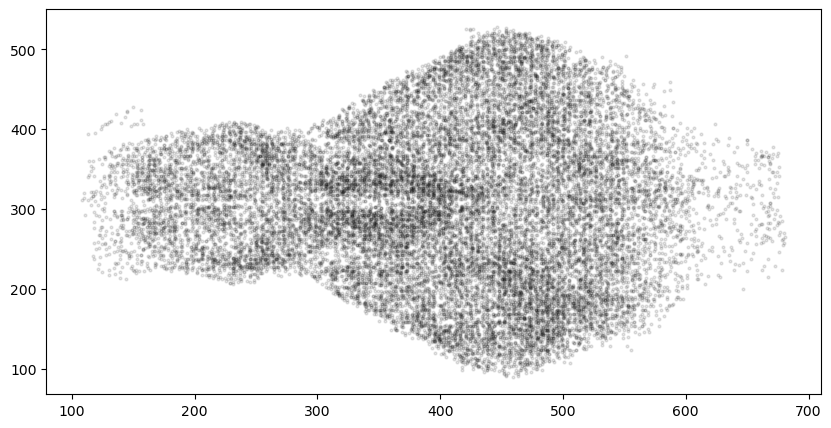

In [102]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = wt_lab_coord
trace_ch = wt_reg_deltaff

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(trace_ch[i])], 'inbrain')
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 4, c = 'k', alpha = 0.1)
plt.show()

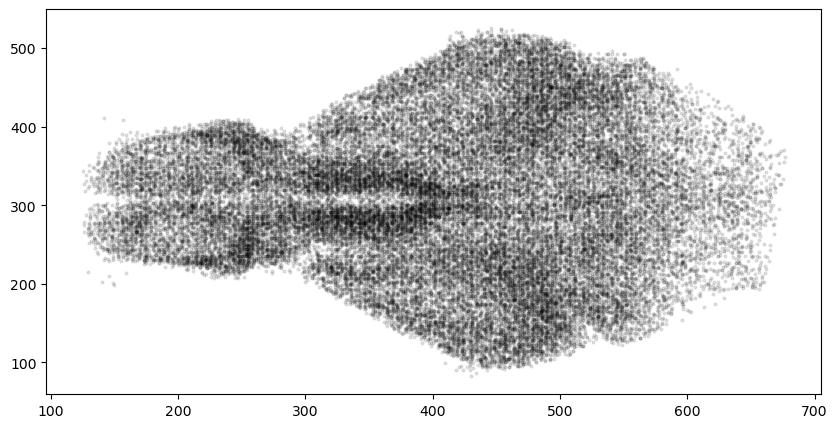

In [103]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = het_lab_coord
trace_ch = het_reg_deltaff

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(trace_ch[i])], 'inbrain')
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 4, c = 'k', alpha = 0.1)
plt.show()

In [2]:
#================================================
def select_region(trace, bind, coord, region):
#================================================
    
    """
    This function slices data to include only those within a specific brain region.

    Inputs:
        trace (np array): cells x timepoints, raw or normalised fluorescence values
        bind (np array): cells x time, binarised state vector
        coord (np array): cells x XYZ coordinates and labels
        region (str): 'all', 'Diencephalon', 'Midbrain', 'Hindbrain' or 'Telencephalon'
    
    Returns:
        sub_trace (np array): cells x timepoints, raw or normalised fluorescence values for subregion
        sub_bind (np array): cells x time, binarised state vector for subregion
        sub_coord (np array): cells x XYZ coordinates for subregion
    
    
    """
    
    import numpy as np

    if coord.shape[0] != trace.shape[0]:
        print('Trace and coordinate data not same shape')
        return()


    if region == 'all':
        locs = np.where(coord[:,4] != 'nan')

    else: 
        locs = np.where(coord[:,3] == region)

    sub_coord = coord[locs][:,:3].astype(float)

    sub_trace, sub_bind = trace[locs], bind[locs]


    return(sub_trace, sub_bind, sub_coord)

In [9]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind
time = 9828
i=0
wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur, wt_corr, wt_dim = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))
trace, bind, coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Subpallium')


In [8]:
def spike_stats(bind, dff):
    # calculate spike statistics - number of spikes per cell, mean amplitude per cell, number of continuous transients per cell, mean transient duration per cell
    import numpy as np
    import more_itertools as mit
    if bind.shape[0] != dff.shape[0]:
        print('Data not the same shape')
        return()
    spikes = np.sum(bind, axis = 1)
    mean_amp = np.mean(dff, axis = 1)
    n_trans = np.zeros((bind.shape[0]))
    corr = np.corrcoef(bind)
    for i in range(bind.shape[0]):
        si = np.where(bind[i] == 1)[0]
        n_trans[i] = len([list(group) for group in mit.consecutive_groups(si)])
    mean_transdur = spikes / n_trans
    dimen = dim(bind)
    return(spikes, mean_amp, n_trans, mean_transdur, corr, dimen)

In [9]:
def dim(data):
    import numpy as np
    cov = np.cov(data)
    eig = np.linalg.eigvals(cov)
    output = (((np.sum(eig))**2)/ (np.sum(eig**2))) / eig.shape[0]
    return(output)

## SPONTANEOUS

In [ ]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind
time = 9828
wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur, wt_corr, wt_dim = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    trace, dff, bind, coord = tfn.select_region(np.load(dff_ch[i])[:,:time], np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'all')

    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = spike_stats(bind, trace)
    

    wt_spikes[i] =spikes
    wt_amp[i] = mean_amp
    wt_n_trans[i] = n_trans
    wt_mean_transdur[i] = mean_transdur
    wt_corr[i] = corr
    wt_dim[i] = dimen
    print(i)
    

In [ ]:
coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind
time = 9828
het_spikes, het_amp, het_n_trans, het_mean_transdur, het_corr, het_dim = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    trace, dff, bind, coord = tfn.select_region(np.load(dff_ch[i])[:,:time], np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'all')

    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = spike_stats(bind, trace)
    

    het_spikes[i] =spikes
    het_amp[i] = mean_amp
    het_n_trans[i] = n_trans
    het_mean_transdur[i] = mean_transdur
    het_corr[i] = corr
    het_dim[i] = dimen
    print(i)
    

In [ ]:
coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind
time = 9828
hom_spikes, hom_amp, hom_n_trans, hom_mean_transdur, hom_corr, hom_dim = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    trace, dff, bind, coord = tfn.select_region(np.load(dff_ch[i])[:,:time], np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'all')

    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = spike_stats(bind, trace)
    

    hom_spikes[i] =spikes
    hom_amp[i] = mean_amp
    hom_n_trans[i] = n_trans
    hom_mean_transdur[i] = mean_transdur
    hom_corr[i] = corr
    hom_dim[i] = dimen
    print(i)
    

In [ ]:
n_neigh = 15 #15
dim = [.8, .8, 15]
reg_list = ['Telencephalon']

for i in range(len(trace_list)):

    trace = np.load(trace_list[i])
    bind = np.load(bind_list[i])
    coord = (np.load(coord_list[i]))
    name = adfn.save_name(trace_list[i])

    for reg in reg_list:
        sub_trace, sub_bind, sub_coord = tfn.select_region(trace, bind, coord, reg)
        data = tfn.trace_analyse(name).criticality(sub_trace, sub_bind, sub_coord, n_neigh, dim)
        np.save(Fdata + 'BLNLIGHTPTZ-FOXG1/' + name + '_' + reg + '_criticality.npy', data.__dict__)
    print('Processed ' + name)

In [7]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind
wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur, wt_corr, wt_dim =  list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    coord, trace = tfn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time]], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = mafn.spike_stats(trace[1], trace[0])
    wt_spikes[i] = spikes
    wt_amp[i] = mean_amp
    wt_n_trans[i] = n_trans
    wt_mean_transdur[i] = mean_transdur 
    wt_corr[i] = corr
    wt_dim[i] = dimen
    print(i)

NameError: name 'mafn' is not defined

In [4]:
coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind
het_spikes, het_amp, het_n_trans, het_mean_transdur, het_corr, het_dim =  list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time]], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = mafn.spike_stats(trace[1], trace[0])
    het_spikes[i] = spikes
    het_amp[i] = mean_amp
    het_n_trans[i] = n_trans
    het_mean_transdur[i] = mean_transdur 
    het_corr[i] = corr
    het_dim[i] = dimen
    print(i)

0
1
2
3
4
5
6
7


In [5]:
coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind
hom_spikes, hom_amp, hom_n_trans, hom_mean_transdur, hom_corr, hom_dim = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i])[:,time:], np.load(bind_ch[i])[:,time:]], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = mafn.spike_stats(trace[1], trace[0])
    hom_spikes[i] = spikes
    hom_amp[i] = mean_amp
    hom_n_trans[i] = n_trans
    hom_mean_transdur[i] = mean_transdur 
    hom_corr[i] = corr
    hom_dim[i] = dimen
    print(i)

0
1
2
3
4


In [57]:
p_spike_df = pd.read_csv('foxg1_spike.csv')
p_spike_df

,mean spike count per neuron,Labels
0,1045.059852,WT
1,911.390110,WT
2,848.385356,WT
3,1581.925868,WT
4,1211.944853,WT
5,969.909449,HET
6,1252.974608,HET
7,1103.751116,HET
8,1268.552194,HET
9,996.050706,HET


In [26]:
point = np.zeros((18))

p_spike_df = {}
count=0
choose = 0

data = [wt_spikes, het_spikes, hom_spikes]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.mean(data[e][i][choose])
        count+=1

p_spike_df = pd.DataFrame({"mean spike count per neuron":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

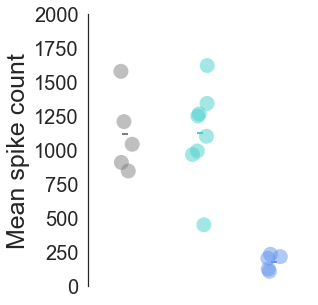

In [58]:
import seaborn as sns

from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['grey','mediumturquoise','cornflowerblue']

fig, ax = plt.subplots(figsize = (4,5))
ax = sns.pointplot(x="Labels", y="mean spike count per neuron", data = p_spike_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=1, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="mean spike count per neuron", data=p_spike_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 0.5)

plt.yticks(size = 20)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Mean spike count', size = '25')
ax.get_xaxis().set_visible(False)
#ax.set_xticklabels(['Baseline', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.ylim(top = 2000, bottom = 0)

plt.savefig(Ffig + 'foxg1_spikes.svg', transparent = True)
plt.show()

In [10]:
from scipy import stats
data1 = p_spike_df['mean spike count per neuron'][p_spike_df['Labels'] == 'WT']
mean = np.mean(data1)
sem = stats.sem(data1)
print(mean, sem)

from scipy import stats
data2 = p_spike_df['mean spike count per neuron'][p_spike_df['Labels'] == 'HET']
mean = np.mean(data2)
sem = stats.sem(data2)
print(mean, sem)

from scipy import stats
data3 = p_spike_df['mean spike count per neuron'][p_spike_df['Labels'] == 'HOM']
mean = np.mean(data3)
sem = stats.sem(data3)
print(mean, sem)

1119.7412077690005 131.28930931395078
1126.7499960664231 121.61398669044105
179.44141520279086 25.39163880562224


In [11]:
#BLN - SZ
alpha = 0.05/2

U, p = stats.mannwhitneyu(data1, data2)
print('U = ' + str(U) +  '   p = ' + str(p))

    
U, p = stats.mannwhitneyu(data1, data3)
print('U = ' + str(U) +  '   p = ' + str(p))


U = 16.0   p = 0.30420390011649917
U = 0.0   p = 0.006092890177672406


In [59]:
p_spike_df = pd.read_csv('foxg1_spikes_PTZ.csv')
p_spike_df

,mean spikes per neuron - PTZ,Labels
0,1574.898868,WT
1,1031.753230,WT
2,976.944637,WT
3,1496.602287,WT
4,1076.691617,HET
5,1357.050154,HET
6,1283.942222,HET
7,1793.956094,HET
8,1323.264432,HET
9,1522.631702,HET


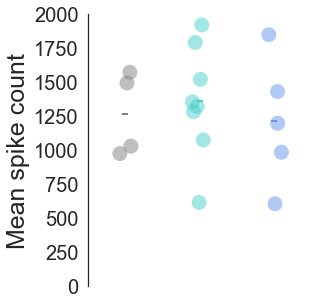

In [60]:
import seaborn as sns

from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['grey','mediumturquoise','cornflowerblue']

fig, ax = plt.subplots(figsize = (4,5))
ax = sns.pointplot(x="Labels", y="mean spikes per neuron - PTZ", data = p_spike_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=1, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="mean spikes per neuron - PTZ", data=p_spike_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 0.5)

plt.yticks(size = 20)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Mean spike count', size = '25')
ax.get_xaxis().set_visible(False)
#ax.set_xticklabels(['Baseline', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.ylim(top = 2000, bottom = 0)

plt.savefig(Ffig + 'foxg1_spikes_PTZ.svg', transparent = True)
plt.show()

In [19]:
from scipy import stats
data1 = p_spike_df["mean spikes per neuron - PTZ"][p_spike_df['Labels'] == 'WT']
mean = np.mean(data1)
sem = stats.sem(data1)
print(mean, sem)

from scipy import stats
data2 = p_spike_df["mean spikes per neuron - PTZ"][p_spike_df['Labels'] == 'HET']
mean = np.mean(data2)
sem = stats.sem(data2)
print(mean, sem)

from scipy import stats
data3 = p_spike_df["mean spikes per neuron - PTZ"][p_spike_df['Labels'] == 'HOM']
mean = np.mean(data3)
sem = stats.sem(data3)
print(mean, sem)

1270.0497555692725 154.63798477766147
1362.2642989641738 144.60080451694637
1215.653762508231 209.0089955200502


In [20]:
#BLN - SZ
alpha = 0.05/2

U, p = stats.mannwhitneyu(data1, data2)
print('U = ' + str(U) +  '   p = ' + str(p))

    
U, p = stats.mannwhitneyu(data1, data3)
print('U = ' + str(U) +  '   p = ' + str(p))


U = 13.0   p = 0.3355627291949064
U = 9.0   p = 0.4512616250888397


In [54]:
amp_df = pd.read_csv('foxg1_amplitude_PTZ.csv')
amp_df

,mean fluorescence per neuron - PTZ,Labels
0,6.390085,WT
1,7.743942,WT
2,7.878058,WT
3,7.149753,WT
4,7.542465,HET
5,7.465558,HET
6,5.765892,HET
7,7.192795,HET
8,7.543114,HET
9,6.853876,HET


In [68]:
point = np.zeros((18))

amp_df = {}
count=0
choose = 0
data = [wt_amp, het_amp, hom_amp]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.mean(data[e][i][choose])
        count+=1

amp_df = pd.DataFrame({"mean fluorescence per neuron":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

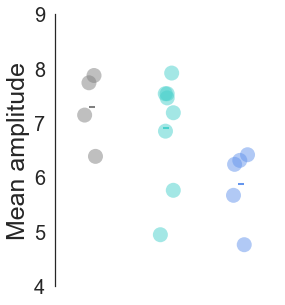

In [56]:
import seaborn as sns

from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['grey','mediumturquoise','cornflowerblue']

fig, ax = plt.subplots(figsize = (4,5))
ax = sns.pointplot(x="Labels", y="mean fluorescence per neuron - PTZ", data = amp_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=1, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="mean fluorescence per neuron - PTZ", data=amp_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 0.5)

plt.yticks(size = 20)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Mean amplitude', size = '25')
ax.get_xaxis().set_visible(False)
#ax.set_xticklabels(['Baseline', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.ylim(top = 9, bottom = 4)
plt.savefig(Ffig + 'foxg1_amp_PTZ.svg', transparent = True)
plt.show()

In [28]:
from scipy import stats
data1 = amp_df["mean fluorescence per neuron - PTZ"][amp_df['Labels'] == 'WT']
mean = np.mean(data1)
sem = stats.sem(data1)
print(mean, sem)

from scipy import stats
data2 = amp_df["mean fluorescence per neuron - PTZ"][amp_df['Labels'] == 'HET']
mean = np.mean(data2)
sem = stats.sem(data2)
print(mean, sem)

from scipy import stats
data3 = amp_df["mean fluorescence per neuron - PTZ"][amp_df['Labels'] == 'HOM']
mean = np.mean(data3)
sem = stats.sem(data3)
print(mean, sem)

7.2904593748345725 0.3392872993814923
6.90440664084281 0.3628589983442974
5.883694630884653 0.3081460936138665


In [29]:
#BLN - SZ
alpha = 0.05/2

U, p = stats.mannwhitneyu(data1, data2)
print('U = ' + str(U) +  '   p = ' + str(p))

    
U, p = stats.mannwhitneyu(data1, data3)
print('U = ' + str(U) +  '   p = ' + str(p))


U = 13.0   p = 0.3355627291949064
U = 1.0   p = 0.01866820796033144


In [81]:
point = np.zeros((18))

amp_df = {}
count=0
choose = 0
data = [wt_n_trans, het_n_trans, hom_n_trans]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.mean(data[e][i][choose])
        count+=1

ntrans_df = pd.DataFrame({"n trans":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

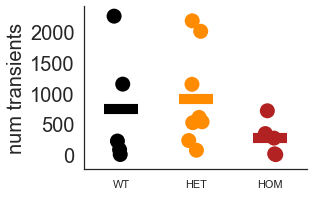

In [82]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="n trans", data = ntrans_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="n trans", data=ntrans_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('num transients', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

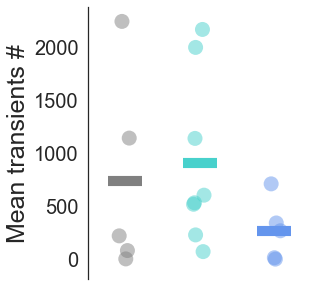

In [83]:
import seaborn as sns

from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['grey','mediumturquoise','cornflowerblue']

fig, ax = plt.subplots(figsize = (4,5))
ax = sns.pointplot(x="Labels", y="n trans", data = ntrans_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="n trans", data=ntrans_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 0.5)

plt.yticks(size = 20)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Mean transients #', size = '25')
ax.get_xaxis().set_visible(False)
#ax.set_xticklabels(['Baseline', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.savefig(Ffig + 'foxg1_ntrans.svg', transparent = True)
plt.show()

In [84]:
from scipy import stats
data1 = ntrans_df["n trans"][ntrans_df['Labels'] == 'WT']
mean = np.mean(data1)
sem = stats.sem(data1)
print(mean, sem)

from scipy import stats
data2 = ntrans_df["n trans"][ntrans_df['Labels'] == 'HET']
mean = np.mean(data2)
sem = stats.sem(data2)
print(mean, sem)

from scipy import stats
data3 = ntrans_df["n trans"][ntrans_df['Labels'] == 'HOM']
mean = np.mean(data3)
sem = stats.sem(data3)
print(mean, sem)

739.4 429.55961169551307
909.375 280.2854372586733
267.0 130.2796991092626


In [85]:
#BLN - SZ
alpha = 0.05/2

U, p = stats.mannwhitneyu(data1, data2)
print('U = ' + str(U) +  '   p = ' + str(p))

    
U, p = stats.mannwhitneyu(data1, data3)
print('U = ' + str(U) +  '   p = ' + str(p))


U = 16.0   p = 0.30420390011649917
U = 10.0   p = 0.33805165701157347


In [37]:
transdur_df = pd.read_csv('foxg1_transient_duration_PTZ.csv')
transdur_df

,data,Labels
0,1.382551,WT
1,1.206243,WT
2,1.217687,WT
3,1.359289,WT
4,1.232931,HET
5,1.303909,HET
6,1.261020,HET
7,1.371735,HET
8,1.295311,HET
9,1.375033,HET


In [90]:
point = np.zeros((18))

amp_df = {}
count=0
choose = 0
data = [wt_mean_transdur, het_mean_transdur, hom_mean_transdur]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.nanmean(data[e][i][choose])/2.73
        count+=1

transdur_df = pd.DataFrame({"transdur":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

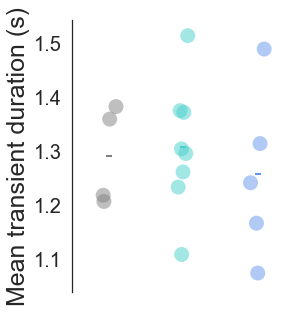

In [38]:
import seaborn as sns

from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['grey','mediumturquoise','cornflowerblue']

fig, ax = plt.subplots(figsize = (4,5))
ax = sns.pointplot(x="Labels", y="data", data = transdur_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=1, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=transdur_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 0.5)

plt.yticks(size = 20)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Mean transient duration (s)', size = '25')
ax.get_xaxis().set_visible(False)
#ax.set_xticklabels(['Baseline', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.savefig(Ffig + 'foxg1_transdur_PTZ.svg', transparent = True)
plt.show()

In [40]:
from scipy import stats
data1 = transdur_df["data"][transdur_df['Labels'] == 'WT']
mean = np.mean(data1)
sem = stats.sem(data1)
print(mean, sem)

from scipy import stats
data2 = transdur_df["data"][transdur_df['Labels'] == 'HET']
mean = np.mean(data2)
sem = stats.sem(data2)
print(mean, sem)

from scipy import stats
data3 = transdur_df["data"][transdur_df['Labels'] == 'HOM']
mean = np.mean(data3)
sem = stats.sem(data3)
print(mean, sem)

1.2914425620335375 0.046190448054030754
1.307748153759799 0.042097139993585435
1.2566421227277904 0.07058775410284358


In [41]:
#BLN - SZ
alpha = 0.05/2

U, p = stats.mannwhitneyu(data1, data2)
print('U = ' + str(U) +  '   p = ' + str(p))

    
U, p = stats.mannwhitneyu(data1, data3)
print('U = ' + str(U) +  '   p = ' + str(p))


U = 14.0   p = 0.3994533348216349
U = 8.0   p = 0.3566515869392288


In [46]:
point = np.zeros((18))

amp_df = {}
count=0
choose = 1
data = [wt_mean_transdur, het_mean_transdur, hom_mean_transdur]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.nanmean(data[e][i][choose])
        count+=1

transdur_df = pd.DataFrame({"Subpallium mean transient duration per neuron":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

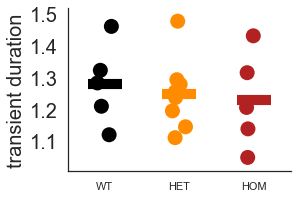

In [47]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="Subpallium mean transient duration per neuron", data = transdur_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="Subpallium mean transient duration per neuron", data=transdur_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('transient duration', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [65]:
point = np.zeros((18))

amp_df = {}
count=0

data = [wt_mean_transdur, het_mean_transdur, hom_mean_transdur]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.nanmean(data[e][i])
        count+=1

transdur_df = pd.DataFrame({"mean transient duration per neuron":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

In [66]:
transdur_df

,mean transient duration per neuron,Labels
0,1.252165,WT
1,1.204678,WT
2,1.278258,WT
3,1.469643,WT
4,1.343738,WT
5,1.210441,HET
6,1.332510,HET
7,1.263808,HET
8,1.321542,HET
9,1.238194,HET


In [67]:
transdur_df.to_csv('foxg1_transient_duration.csv',index=False)

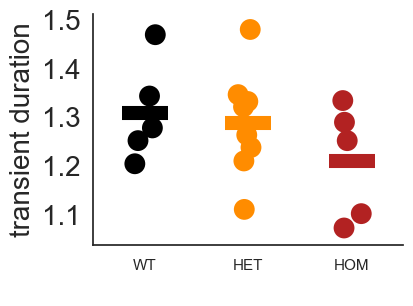

In [176]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = transdur_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=transdur_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('transient duration', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [64]:
corr_df = pd.read_csv('foxg1_correlation.csv')
corr_df

,mean pairwise correlation,Labels
0,0.003684,WT
1,0.003620,WT
2,0.004944,WT
3,0.003125,WT
4,0.003756,WT
5,0.003763,HET
6,0.002422,HET
7,0.002851,HET
8,0.002673,HET
9,0.002992,HET


In [49]:
point = np.zeros((18))
choose= 0
count=0

data = [wt_corr, het_corr, hom_corr]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.nanmean(data[e][i][choose])
        count+=1

corr_df = pd.DataFrame({"Pallium mean pairwise correlation":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

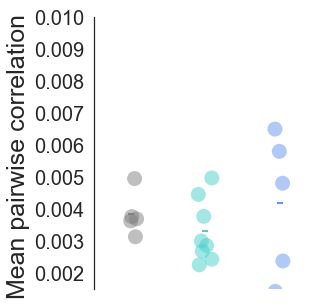

In [65]:
import seaborn as sns

from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['grey','mediumturquoise','cornflowerblue']

fig, ax = plt.subplots(figsize = (4,5))
ax = sns.pointplot(x="Labels", y="mean pairwise correlation", data = corr_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=1, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="mean pairwise correlation", data=corr_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 0.5)

plt.yticks(size = 20)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Mean pairwise correlation ', size = '25')
ax.get_xaxis().set_visible(False)
#ax.set_xticklabels(['Baseline', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.ylim(top = 0.010, bottom = 0.0015)

plt.savefig(Ffig + 'foxg1_corr.svg', transparent = True)
plt.show()

In [51]:
from scipy import stats
data1 = corr_df["mean pairwise correlation - PTZ"][corr_df['Labels'] == 'WT']
mean = np.mean(data1)
sem = stats.sem(data1)
print(mean, sem)

from scipy import stats
data2 = corr_df["mean pairwise correlation - PTZ"][corr_df['Labels'] == 'HET']
mean = np.mean(data2)
sem = stats.sem(data2)
print(mean, sem)

from scipy import stats
data3 = corr_df["mean pairwise correlation - PTZ"][corr_df['Labels'] == 'HOM']
mean = np.mean(data3)
sem = stats.sem(data3)
print(mean, sem)

0.00320693992814485 0.0005386046548831219
0.00446291442865775 0.0002701495454932791
0.00604071902424712 0.0012579660730787712


In [52]:
#BLN - SZ
alpha = 0.05/2

U, p = stats.mannwhitneyu(data1, data2)
print('U = ' + str(U) +  '   p = ' + str(p))

    
U, p = stats.mannwhitneyu(data1, data3)
print('U = ' + str(U) +  '   p = ' + str(p))


U = 5.0   p = 0.03726578552730971
U = 3.0   p = 0.055673443266570206


In [51]:
point = np.zeros((18))
choose= 1
count=0

data = [wt_corr, het_corr, hom_corr]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.nanmean(data[e][i][choose])
        count+=1

corr_df = pd.DataFrame({"Subpallium mean pairwise correlation":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

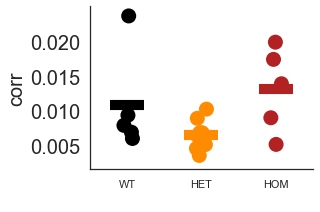

In [52]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="Subpallium mean pairwise correlation", data = corr_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="Subpallium mean pairwise correlation", data=corr_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('corr', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [55]:
from scipy import stats
wt_corr = corr_df[corr_df['Labels'] == 'WT']
het_corr = corr_df[corr_df['Labels'] == 'HET']
hom_corr = corr_df[corr_df['Labels'] == 'HOM']

#BLN - PTZ20
alpha = 0.05/2

t, p = stats.ttest_ind(wt_corr['Subpallium mean pairwise correlation'], het_corr['Subpallium mean pairwise correlation'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = 1.5524160031930803   p = 0.14884220370127407
Samples are the same


In [68]:
point = np.zeros((18))

count=0

data = [wt_corr, het_corr, hom_corr]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.nanmean(data[e][i])
        count+=1

corr_df = pd.DataFrame({"mean pairwise correlation":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

In [70]:
corr_df.to_csv('foxg1_correlation.csv',index=False)

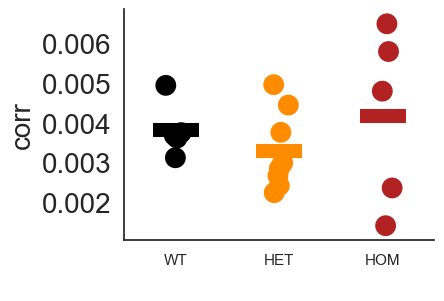

In [23]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = corr_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=corr_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('corr', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [68]:
point = np.zeros((18))

count=0
choose = 0
data = [wt_dim, het_dim, hom_dim]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i][choose]
        count+=1

dim_df = pd.DataFrame({"Pallium dimensionality":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

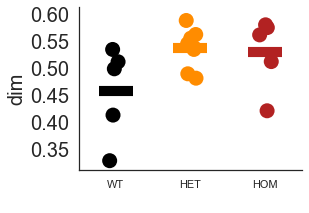

In [69]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="Pallium dimensionality", data = dim_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="Pallium dimensionality", data=dim_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('dim', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [71]:
wt_dim = dim_df[dim_df['Labels'] == 'WT']
het_dim = dim_df[dim_df['Labels'] == 'HET']
hom_dim = dim_df[dim_df['Labels'] == 'HOM']

#BLN - PTZ20
alpha = 0.05

t, p = stats.ttest_ind(wt_dim['Pallium dimensionality'], het_dim['Pallium dimensionality'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = -2.364841218173482   p = 0.03749196879426136
Samples are significantly different


In [58]:
point = np.zeros((18))

count=0
choose = 1
data = [wt_dim, het_dim, hom_dim]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i][choose]
        count+=1

dim_df = pd.DataFrame({"Subpallium dimensionality":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

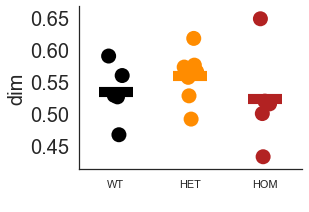

In [59]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="Subpallium dimensionality", data = dim_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="Subpallium dimensionality", data=dim_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('dim', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [71]:
point = np.zeros((18))

count=0

data = [wt_dim, het_dim, hom_dim]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i]
        count+=1

dim_df = pd.DataFrame({"dimensionality":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

In [73]:
dim_df.to_csv('foxg1_dimensionality.csv',index=False)

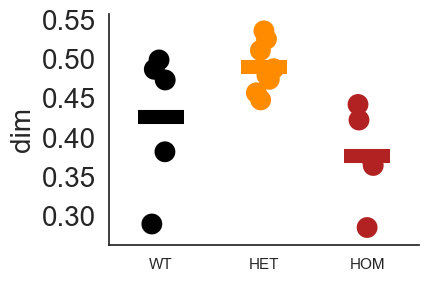

In [185]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = dim_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=dim_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('dim', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [186]:
wt_dim = dim_df[dim_df['Labels'] == 'WT']
het_dim = dim_df[dim_df['Labels'] == 'HET']
hom_dim = dim_df[dim_df['Labels'] == 'HOM']


In [187]:
wt_dim = dim_df[dim_df['Labels'] == 'WT']
het_dim = dim_df[dim_df['Labels'] == 'HET']
hom_dim = dim_df[dim_df['Labels'] == 'HOM']

#BLN - PTZ20
alpha = 0.05/2

t, p = stats.ttest_ind(wt_dim['data'], het_dim['data'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = -1.8811288118350389   p = 0.08667149052994054
Samples are the same


In [ ]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind
time = 9828
wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur, wt_corr, wt_dim = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    p_trace, p_bind, p_coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Pallium')
    s_trace, s_bind, s_coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Subpallium')

    p_spikes, p_mean_amp, p_n_trans, p_mean_transdur, p_corr, p_dimen = spike_stats(p_bind, p_trace)
    
    
    s_spikes, s_mean_amp, s_n_trans, s_mean_transdur, s_corr, s_dimen = spike_stats(s_bind, s_trace)
    
    
    wt_spikes[i] =p_spikes, s_spikes
    wt_amp[i] = p_mean_amp, s_mean_amp
    wt_n_trans[i] = p_n_trans, s_n_trans
    wt_mean_transdur[i] = p_mean_transdur, s_mean_transdur
    wt_corr[i] = p_corr, s_corr
    wt_dim[i] = p_dimen, s_dimen
    print(i)
    

In [72]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind

wt_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    p_trace, p_bind, p_coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Pallium')
    s_trace, s_bind, s_coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Subpallium')
    wt_list[i] = len(p_coord), len(s_coord)

In [73]:
coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind

het_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    p_trace, p_bind, p_coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Pallium')
    s_trace, s_bind, s_coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Subpallium')
    het_list[i] = len(p_coord), len(s_coord)

In [74]:
coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind

hom_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    p_trace, p_bind, p_coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Pallium')
    s_trace, s_bind, s_coord = select_region( np.load(dff_ch[i])[:,:time], np.load(bind_ch[i])[:,:time], np.load(coord_ch[i]), 'Subpallium')
    hom_list[i] = len(p_coord), len(s_coord)

In [33]:

coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind

hom_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    hom_list[i] = len(coord)

In [204]:
wt_list = [1487, 1557, 1902, 1632]

In [75]:
point = np.zeros((18))

count=0

data = [wt_list, het_list, hom_list]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i][0]
        count+=1

cells_df = pd.DataFrame({"total cell number":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

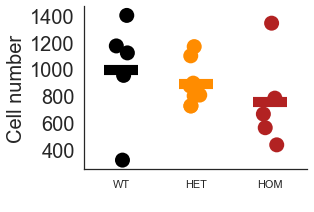

In [76]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="total cell number", data = cells_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="total cell number", data=cells_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Cell number', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [78]:
point = np.zeros((18))

count=0

data = [wt_list, het_list, hom_list]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i][1]
        count+=1

cells_df = pd.DataFrame({"total cell number":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

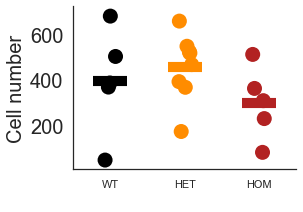

In [79]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="total cell number", data = cells_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="total cell number", data=cells_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Cell number', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [45]:
point = np.zeros((18))

count=0

data = [wt_list, het_list, hom_list]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i]
        count+=1

cells_df = pd.DataFrame({"total cell number":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

In [75]:
cells_df.to_csv('foxg1_cell_number.csv',index=False)

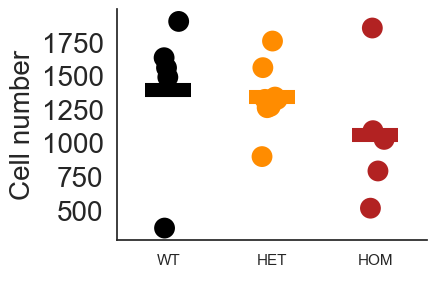

In [41]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = cells_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=cells_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Cell number', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [209]:
wt_c = cells_df[cells_df['Labels'] == 'WT']
het_c = cells_df[cells_df['Labels'] == 'HET']
hom_c = cells_df[cells_df['Labels'] == 'HOM']


In [211]:
#BLN - PTZ20
alpha = 0.05/2

t, p = stats.ttest_ind(wt_c['data'], hom_c['data'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = 2.2193700197474686   p = 0.06193481056032113
Samples are the same


In [ ]:
def corrme(data, coord, cutoff):
    fullmat = np.corrcoef(data)
    right_n = fullmat[coord[:,0] > cutoff]
    corr = 0
    count=0
    for i in range(right_n.shape[0]):
        corr+= np.mean(right_n[i][coord[:,0] < cutoff])
        count+=1
    corr_mean = corr/count
    return(corr_mean)

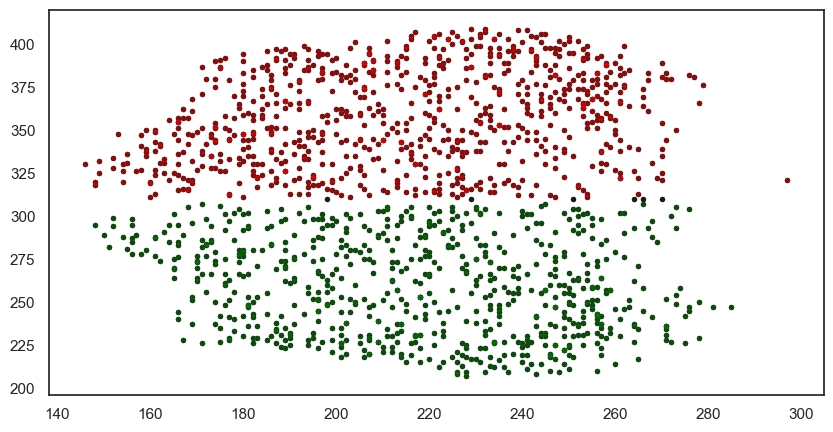

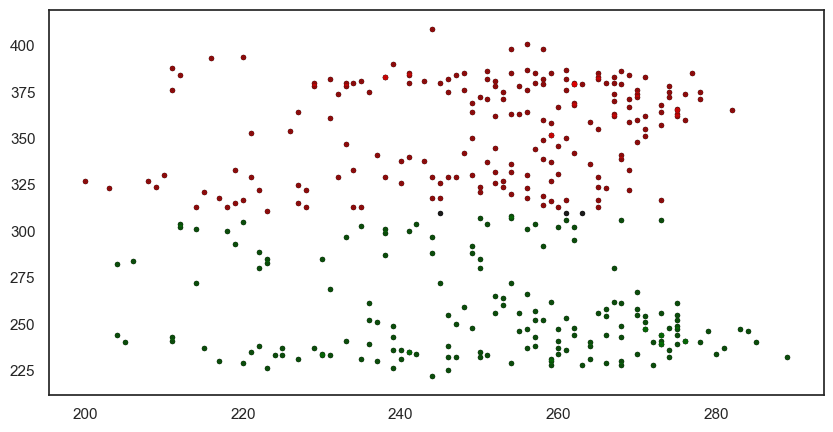

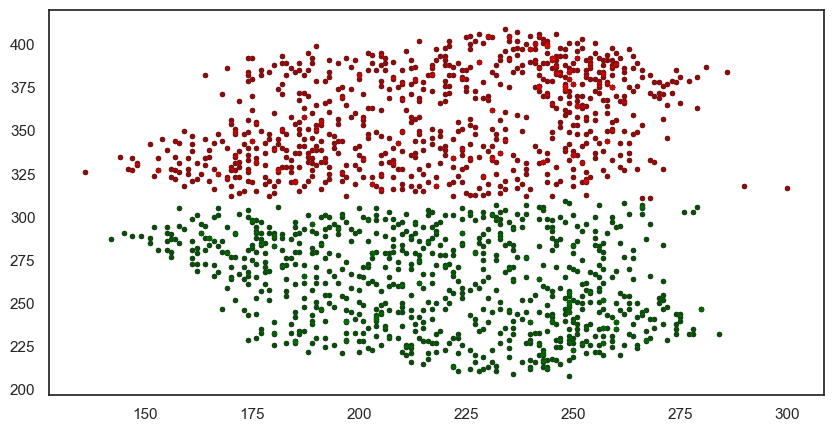

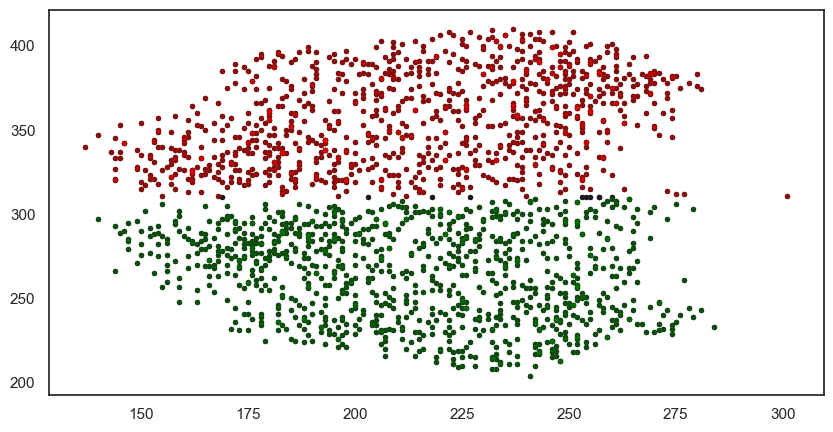

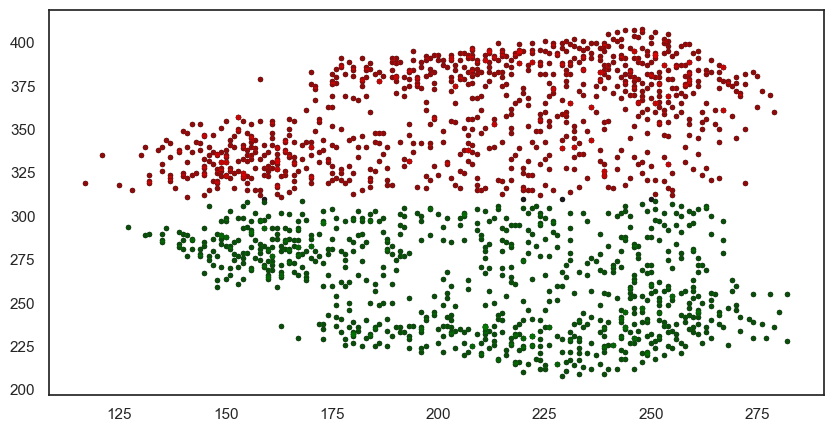

In [231]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind

wt_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    wt_list[i] = corrme(trace[1], sub_coord, cutoff)


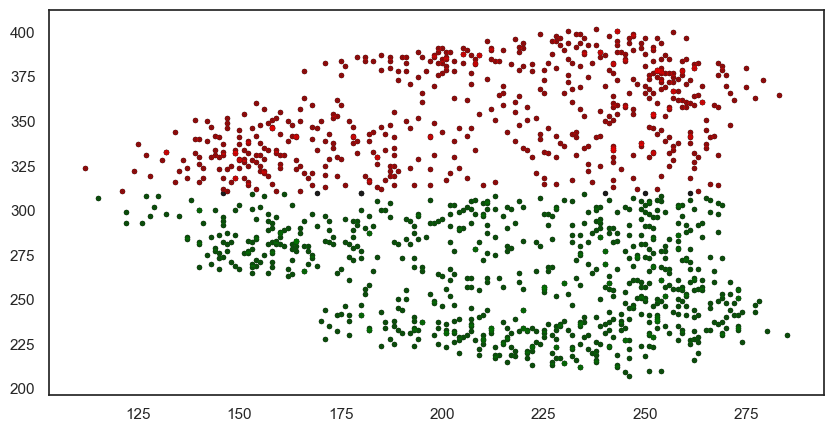

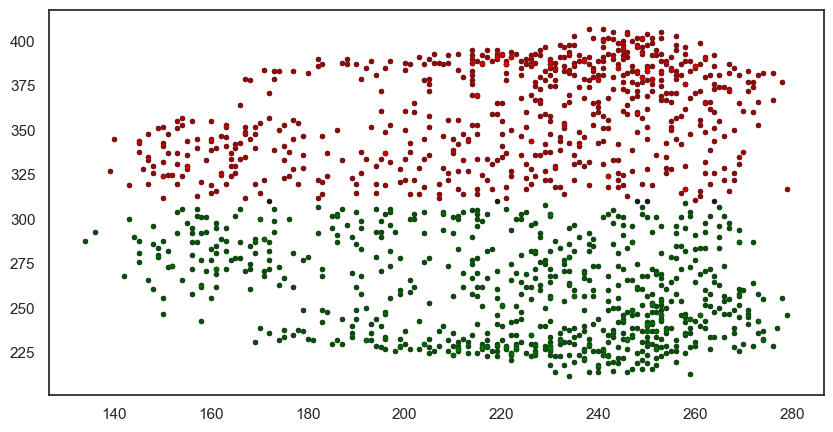

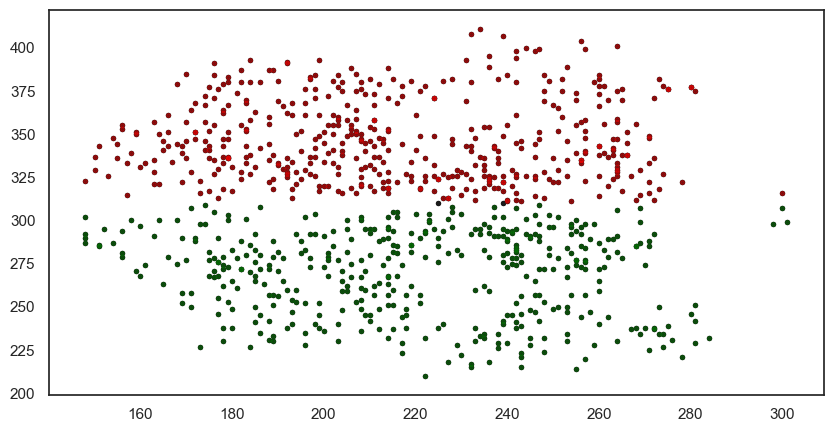

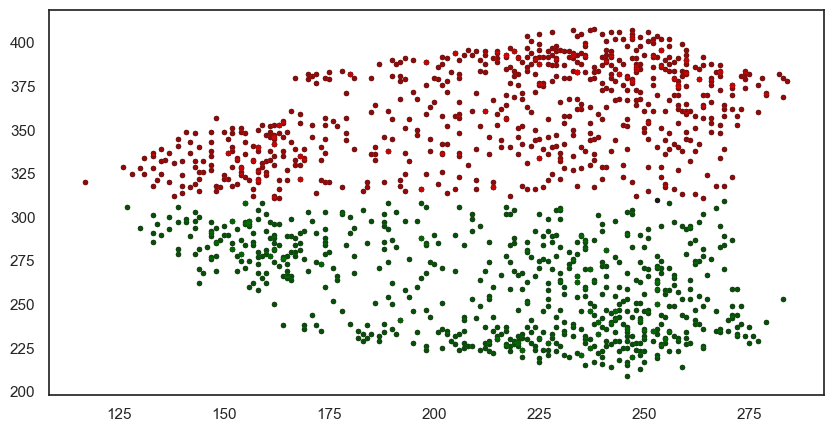

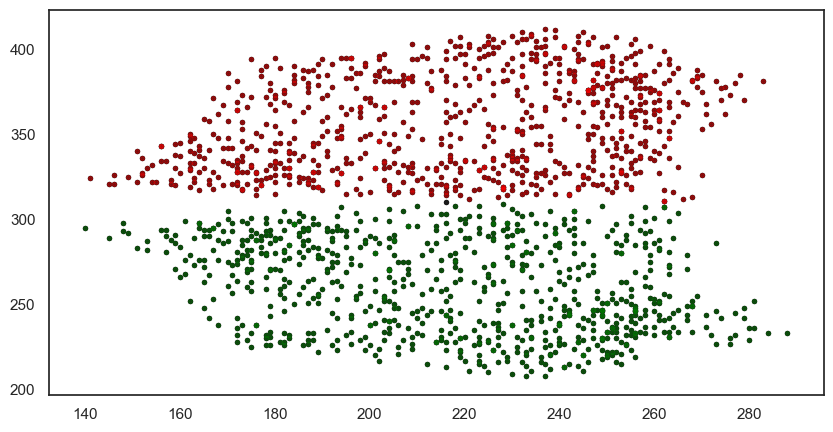

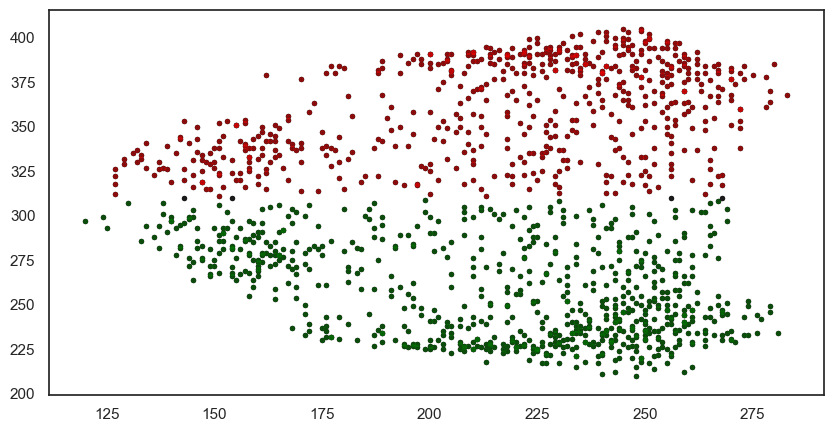

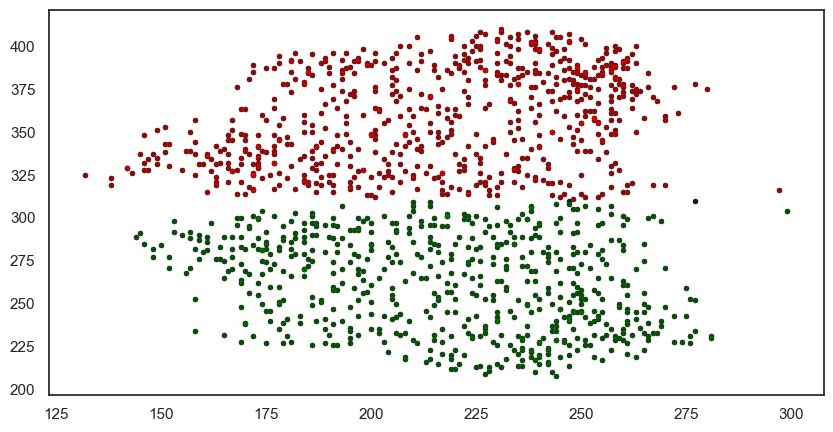

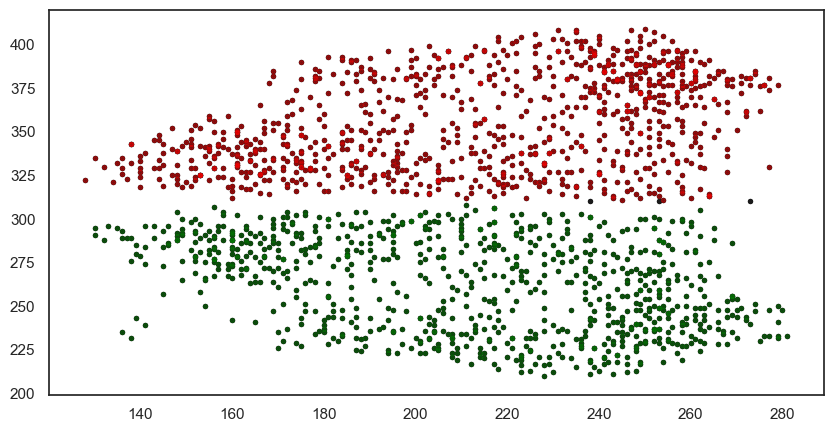

In [232]:


coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind

het_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    het_list[i] = corrme(trace[1], sub_coord, cutoff)


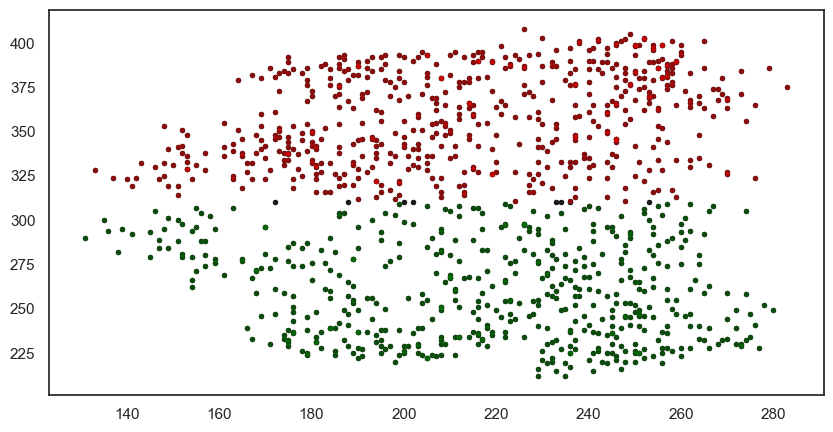

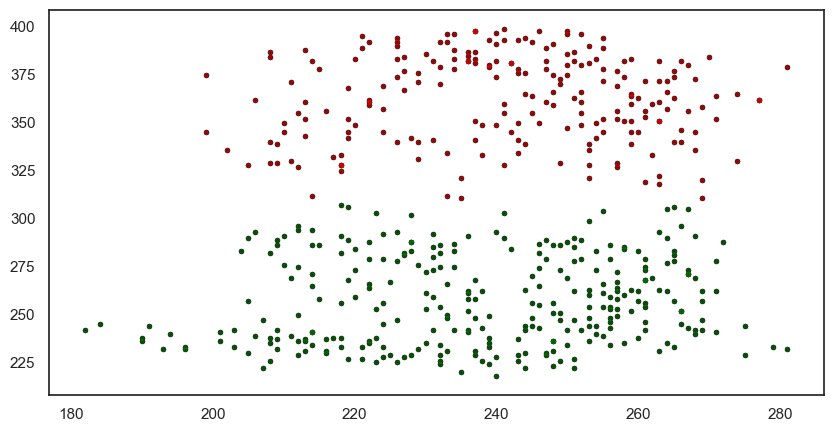

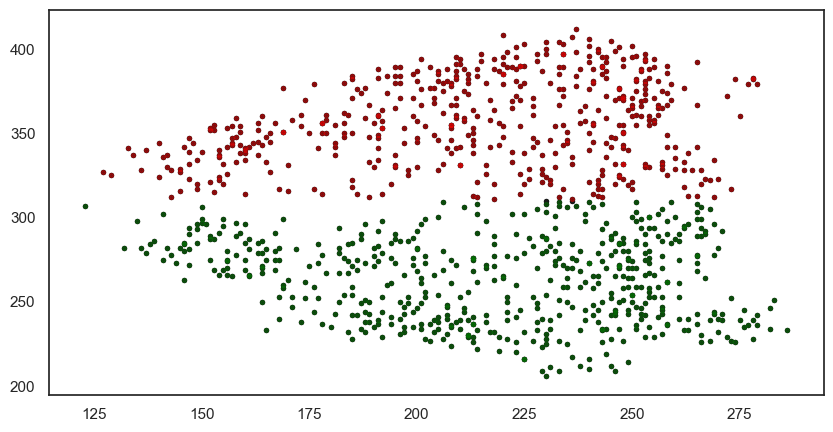

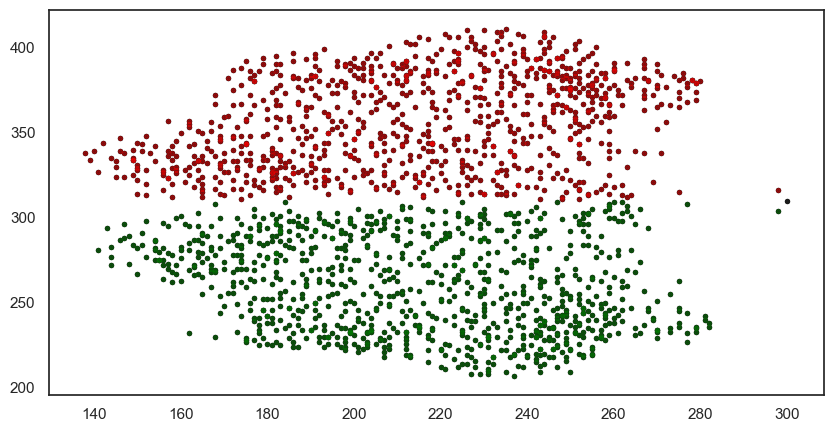

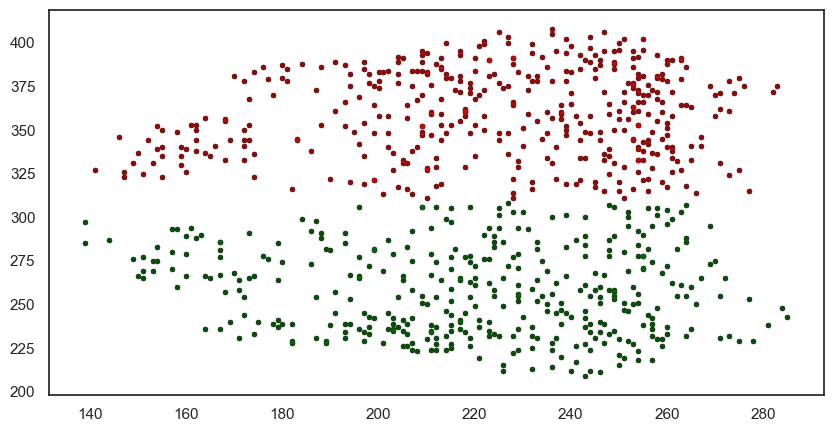

In [233]:
coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind

hom_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    hom_list[i] = corrme(trace[1], sub_coord, cutoff)


In [234]:
point = np.zeros((18))

count=0

data = [wt_list, het_list, hom_list]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i]
        count+=1

corr_df = pd.DataFrame({"data":point , "Labels":  np.append(adfn.repeat_list('WT',5),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})


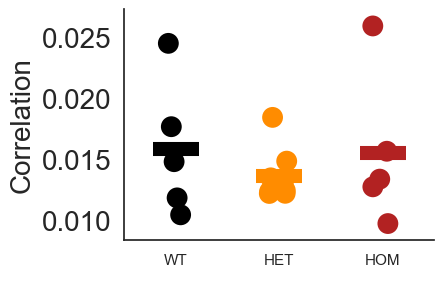

In [235]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = corr_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=corr_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Correlation', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

## PTZ02

In [92]:
#SPONTANEOUS
experiment = 'BLNLIGHTPTZ-FOXG1'
os.chdir(Fdrop + 'Project/' + experiment)

wt_lab_coord = sorted(glob.glob('*++*PTZ02_*labcoord.npy*')) 
wt_reg_deltaff = sorted(glob.glob('*++*PTZ02_*regdeltaff.npy*'))
wt_reg_bind = sorted(glob.glob('*++*PTZ02_*regbinarised.npy*'))

het_lab_coord = sorted(glob.glob('*1+-*PTZ02_*labcoord.npy*')) 
het_reg_deltaff = sorted(glob.glob('*1+-*PTZ02_*regdeltaff.npy*'))
het_reg_bind = sorted(glob.glob('*1+-*PTZ02_*regbinarised.npy*'))

hom_lab_coord = sorted(glob.glob('*1---*PTZ02_*labcoord.npy*')) 
hom_reg_deltaff = sorted(glob.glob('*1---*PTZ02_*regdeltaff.npy*'))
hom_reg_bind = sorted(glob.glob('*1---*PTZ02_*regbinarised.npy*'))
wt_lab_coord, wt_reg_deltaff, wt_reg_bind, het_lab_coord, het_reg_deltaff, het_reg_bind, hom_lab_coord, hom_reg_deltaff, hom_reg_bind

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy'],
 ['BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'

In [93]:
wt_lab_coord, wt_reg_deltaff, wt_reg_bind

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy'])

In [94]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind
time = 9828
wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur, wt_corr, wt_dim = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = mafn.spike_stats(trace[1], trace[0])
    wt_spikes[i] = spikes
    wt_amp[i] = mean_amp
    wt_n_trans[i] = n_trans
    wt_mean_transdur[i] = mean_transdur 
    wt_corr[i] = corr
    wt_dim[i] = dimen
    print(i)
    

0
1
2
3


In [138]:
het_lab_coord, het_reg_deltaff, het_reg_bind

(['BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--03_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--04_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--05_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--06_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--07_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--08_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--09_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1+--03_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1+--04_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1+--05_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1+--06_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ

In [95]:
coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind
het_spikes, het_amp, het_n_trans, het_mean_transdur, het_corr, het_dim =  list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = mafn.spike_stats(trace[1], trace[0])
    het_spikes[i] = spikes
    het_amp[i] = mean_amp
    het_n_trans[i] = n_trans
    het_mean_transdur[i] = mean_transdur 
    het_corr[i] = corr
    het_dim[i] = dimen
    print(i)

0
1
2
3
4
5
6
7


In [139]:
hom_lab_coord, hom_reg_deltaff, hom_reg_bind

(['BLNLIGHTPTZ-FOXG1---02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1---03_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1---04_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1---05_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1---06_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1---02_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1---03_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1---04_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1---05_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1---06_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy'],
 ['BLNLIGHTPTZ-FOXG1---02_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1---03_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1---04_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
 

In [96]:
coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind
hom_spikes, hom_amp, hom_n_trans, hom_mean_transdur, hom_corr, hom_dim = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur, corr, dimen = mafn.spike_stats(trace[1], trace[0])
    hom_spikes[i] = spikes
    hom_amp[i] = mean_amp
    hom_n_trans[i] = n_trans
    hom_mean_transdur[i] = mean_transdur 
    hom_corr[i] = corr
    hom_dim[i] = dimen
    print(i)

0
1
2
3
4


In [258]:
len(wt_lab_coord), len(het_lab_coord), len(hom_lab_coord)

(4, 8, 5)

In [98]:
point = np.zeros((17))

spike_df = {}
count=0

data = [wt_spikes, het_spikes, hom_spikes]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.mean(data[e][i])
        count+=1

spike_df = pd.DataFrame({"mean spikes per neuron - PTZ":point , "Labels":  np.append(adfn.repeat_list('WT',4),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

In [100]:
spike_df.to_csv('foxg1_spikes_PTZ.csv',index=False)

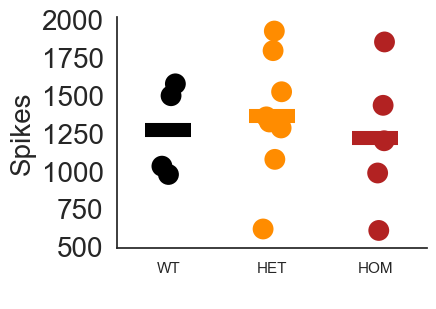

In [298]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = spike_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=spike_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Spikes', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [70]:
wt_spike = spike_df[spike_df['Labels'] == 'WT']
het_spike = spike_df[spike_df['Labels'] == 'HET']
hom_spike = spike_df[spike_df['Labels'] == 'HOM']

In [71]:
#BLN - PTZ20
alpha = 0.05/2

t, p = stats.ttest_ind(wt_spike['data'], het_spike['data'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = -0.3284269325550995   p = 0.748756019429677
Samples are the same


In [73]:
#BLN - PTZ20
alpha = 0.05/2

t, p = stats.ttest_ind(wt_spike['data'], hom_spike['data'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = 0.4766035096103938   p = 0.6463904553091148
Samples are the same


In [102]:
point = np.zeros((17))

amp_df = {}
count=0

data = [wt_amp, het_amp, hom_amp]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.mean(data[e][i])
        count+=1

amp_df = pd.DataFrame({"mean fluorescence per neuron - PTZ":point , "Labels":  np.append(adfn.repeat_list('WT',4),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

In [103]:
amp_df

,mean fluorescence per neuron - PTZ,Labels
0,6.390085,WT
1,7.743942,WT
2,7.878058,WT
3,7.149753,WT
4,7.542465,HET
5,7.465558,HET
6,5.765892,HET
7,7.192795,HET
8,7.543114,HET
9,6.853876,HET


In [104]:
amp_df.to_csv('foxg1_amplitude_PTZ.csv',index=False)

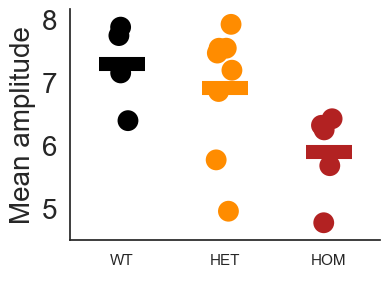

In [300]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = amp_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=amp_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Mean amplitude', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [149]:
wt_amps = amp_df[amp_df['Labels'] == 'WT']
het_amps = amp_df[amp_df['Labels'] == 'HET']
hom_amps = amp_df[amp_df['Labels'] == 'HOM']

In [151]:
#BLN - PTZ20
alpha = 0.05/2

t, p = stats.ttest_ind(wt_amps['data'], het_amps['data'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = 1.152517979002994   p = 0.2735396219092233
Samples are the same


In [152]:
#BLN - PTZ20
alpha = 0.05/2

t, p = stats.ttest_ind(wt_amps['data'], hom_amps['data'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = 2.2602515399402527   p = 0.05370127930764889
Samples are the same


In [270]:
point = np.zeros((17))

amp_df = {}
count=0

data = [wt_n_trans, het_n_trans, hom_n_trans]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.mean(data[e][i])
        count+=1

ntrans_df = pd.DataFrame({"data":point , "Labels":  np.append(adfn.repeat_list('WT',4),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

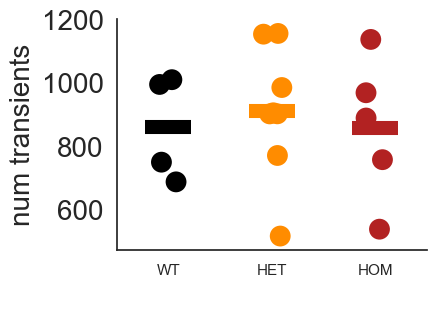

In [271]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = ntrans_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=ntrans_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('num transients', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [105]:
point = np.zeros((17))

amp_df = {}
count=0

data = [wt_mean_transdur, het_mean_transdur, hom_mean_transdur]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.nanmean(data[e][i])
        count+=1

transdur_df = pd.DataFrame({"mean transient duration per neuron - PTZ":point , "Labels":  np.append(adfn.repeat_list('WT',4),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

In [106]:
transdur_df.to_csv('foxg1_transient_duration_PTZ.csv',index=False)

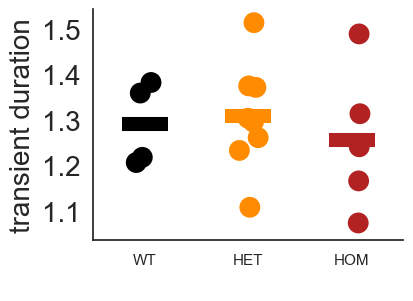

In [273]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = transdur_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=transdur_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('transient duration', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [90]:
len(data[0])

5

In [110]:
point = np.zeros((17))

count=0

data = [wt_corr, het_corr, hom_corr]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = np.nanmean(data[e][i])
        count+=1

corr_df = pd.DataFrame({"mean pairwise correlation - PTZ":point , "Labels":  np.append(adfn.repeat_list('WT',4),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})

In [112]:
corr_df.to_csv('foxg1_correlation_PTZ.csv',index=False)

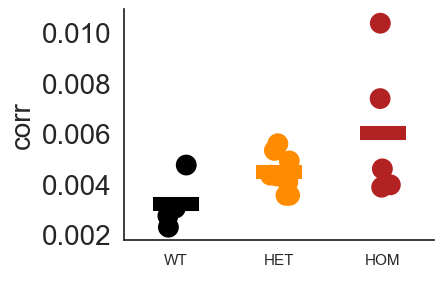

In [108]:

from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = corr_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=corr_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('corr', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [109]:
wt_corrs = corr_df[corr_df['Labels'] == 'WT']
het_corrs = corr_df[corr_df['Labels'] == 'HET']
hom_corrs = corr_df[corr_df['Labels'] == 'HOM']

#BLN - PTZ20
alpha = 0.05

t, p = stats.ttest_ind(wt_corrs['data'], het_corrs['data'])
print('t = ' + str(t) +  '   p = ' + str(p))
if p > alpha:
    print('Samples are the same')
else:
    print('Samples are significantly different')

t = -2.3576146053291676   p = 0.040116182319331985
Samples are significantly different


In [114]:
point = np.zeros((17))

count=0

data = [wt_dim, het_dim, hom_dim]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i]
        count+=1

dim_df = pd.DataFrame({"dimensionality PTZ":point , "Labels":  np.append(adfn.repeat_list('WT',4),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})


In [115]:
dim_df.to_csv('foxg1_dim_PTZ.csv',index=False)

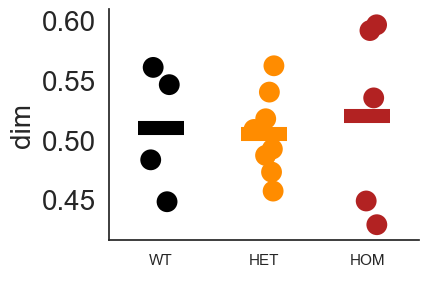

In [283]:
from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = dim_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=dim_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('dim', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

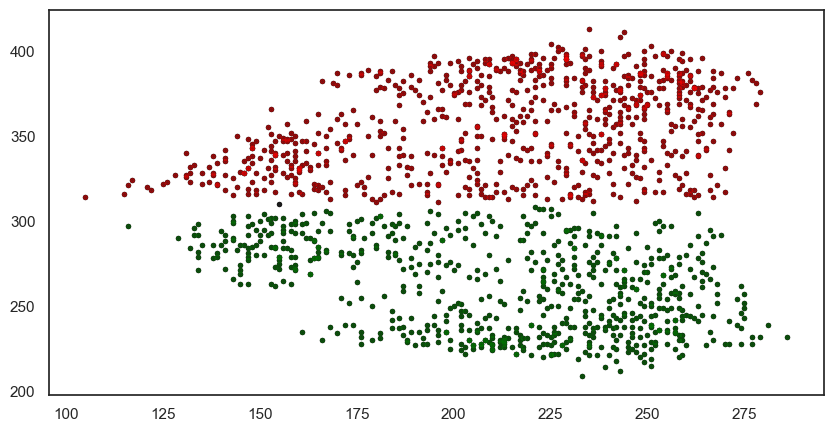

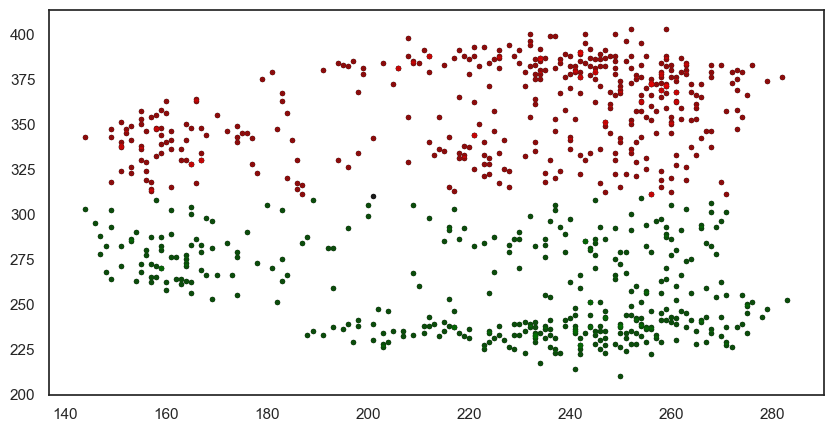

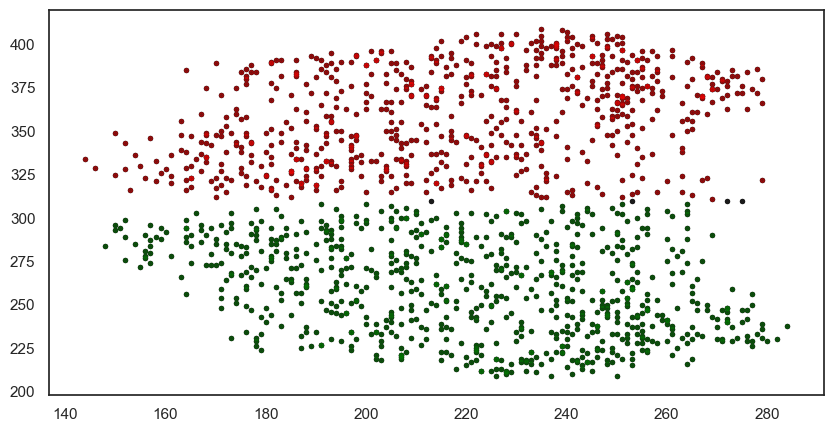

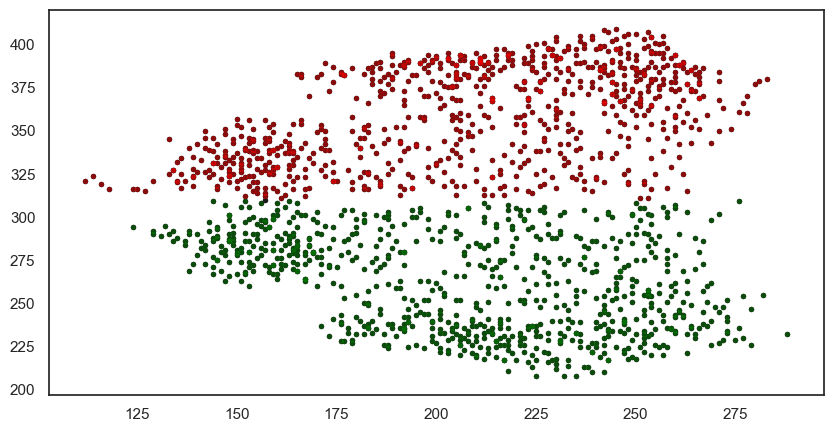

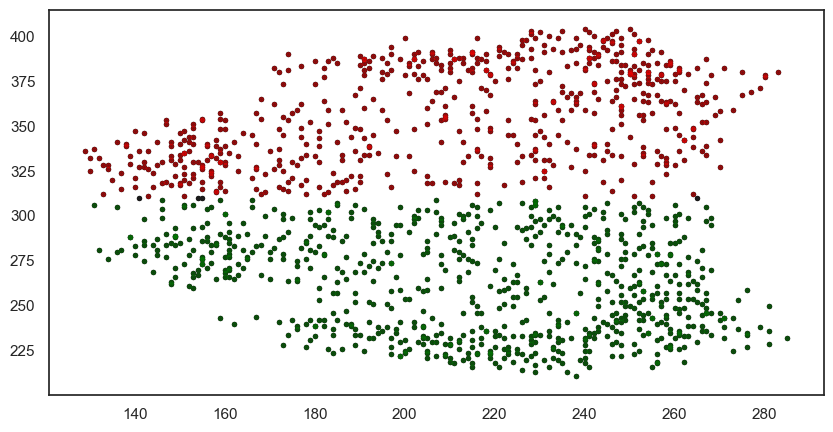

...

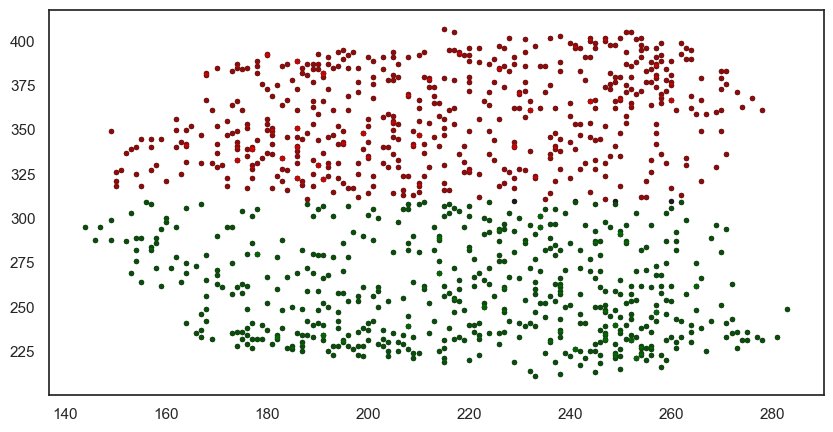

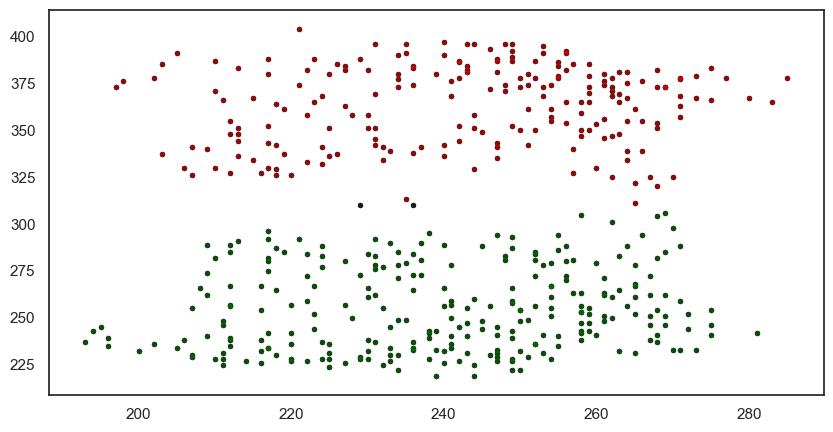

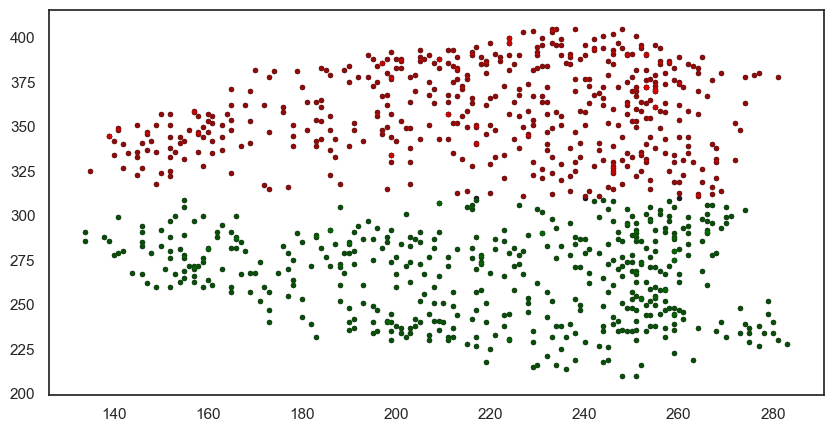

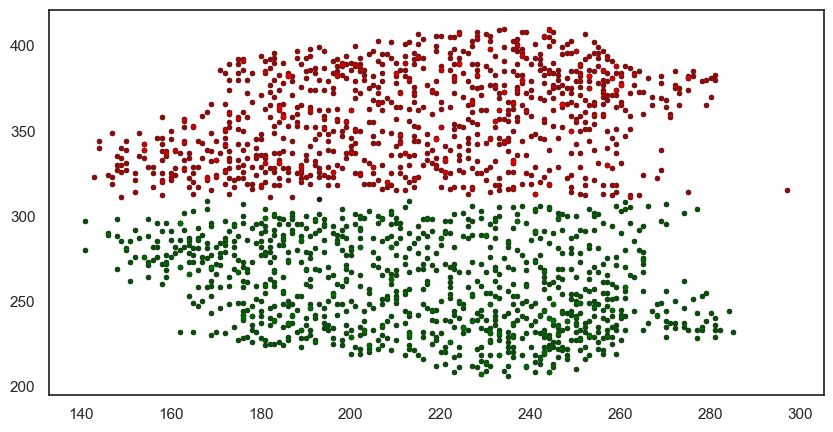

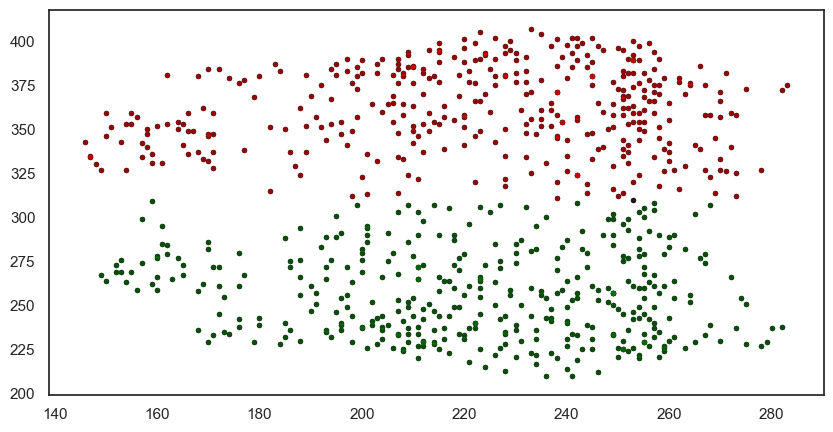

In [288]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind

wt_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    wt_list[i] = corrme(trace[1], sub_coord, cutoff)


coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind

het_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    het_list[i] = corrme(trace[1], sub_coord, cutoff)


coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind

hom_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    hom_list[i] = corrme(trace[1], sub_coord, cutoff)


In [316]:
point = np.zeros((17))

count=0

data = [wt_list, het_list, hom_list]

for e in range(len(data)):
    for i in range(len(data[e])):
        point[count] = data[e][i]
        count+=1

corr_df = pd.DataFrame({"data":point , "Labels":  np.append(adfn.repeat_list('WT',4),np.append(adfn.repeat_list('HET',8),adfn.repeat_list('HOM',5)))})


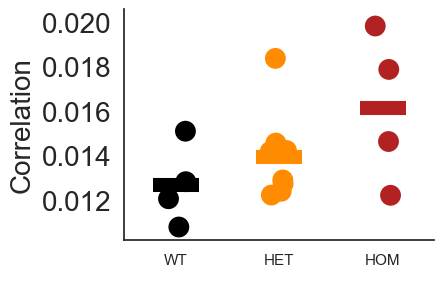

In [317]:


from matplotlib.collections import PathCollection
from matplotlib import cm
sns.set(style="white")

colors1  = cm.Spectral_r(np.linspace(0,1,11))
colors2 = ['black','darkorange','firebrick']

fig, ax = plt.subplots(figsize = (4,3))
ax = sns.pointplot(x="Labels", y="data", data = corr_df, hue = 'Labels', palette = colors2, join=True, ci=0, scale=5, markers = '_')
for artist in ax.lines:
    artist.set_zorder(10)
for artist in ax.findobj(PathCollection):
    artist.set_zorder(11)
#ax = sns.pointplot(x="Labels", y="Exponent", data=sizexdf, color = 'grey', linestyles = ["--"], ci = 0, scale=0.6)
ax = sns.stripplot(x="Labels", y="data", data=corr_df, hue = 'Labels', palette = colors2, size = 15, jitter = True ,alpha = 1)

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('Correlation', size = '20')
plt.yticks(size = 20)
#ax.set_xticklabels(['Spontaneous', 'Focal', 'Generalised'], size = 15)
ax.legend_.remove()
plt.show()

In [236]:
#SPONTANEOUS
experiment = 'BLNLIGHTPTZ-FOXG1'
os.chdir(Fdrop + 'Project/' + experiment)

wt_lab_coord = sorted(glob.glob('*++*PTZ02_*labcoord.npy*')) 
wt_reg_deltaff = sorted(glob.glob('*++*PTZ02_*regdeltaff.npy*'))
wt_reg_bind = sorted(glob.glob('*++*PTZ02_*regbinarised.npy*'))

het_lab_coord = sorted(glob.glob('*1+-*PTZ02_*labcoord.npy*')) 
het_reg_deltaff = sorted(glob.glob('*1+-*PTZ02_*regdeltaff.npy*'))
het_reg_bind = sorted(glob.glob('*1+-*PTZ02_*regbinarised.npy*'))

hom_lab_coord = sorted(glob.glob('*1---*PTZ02_*labcoord.npy*')) 
hom_reg_deltaff = sorted(glob.glob('*1---*PTZ02_*regdeltaff.npy*'))
hom_reg_bind = sorted(glob.glob('*1---*PTZ02_*regbinarised.npy*'))
wt_lab_coord, wt_reg_deltaff, wt_reg_bind, het_lab_coord, het_reg_deltaff, het_reg_bind, hom_lab_coord, hom_reg_deltaff, hom_reg_bind

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-03_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-05_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy'],
 ['BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'

In [ ]:
coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind

hom_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    hom_list[i] = corrme(trace[0], sub_coord, cutoff)


In [160]:
COORD

NameError: name 'COORD' is not defined

In [122]:
def corrme(data, coord, cutoff):
    fullmat = np.corrcoef(data)
    right_n = fullmat[coord[:,0] > cutoff]
    corr = 0
    count=0
    for i in range(right_n.shape[0]):
        corr+= np.mean(right_n[i][coord[:,0] < cutoff])
        count+=1
    corr_mean = corr/count
    return(corr_mean)

In [159]:
wt_list, het_list, hom_list

([0.015675115808262773,
  0.006401874459128138,
  0.0489274218636579,
  0.014605264784278389,
  0.021318566140392216],
 [0.012121679139949165,
  0.009551136455838778,
  0.038030985449439995,
  0.010249685906947668,
  0.021982067113453713,
  0.013153231260431619,
  0.06612412481749158,
  0.0333798206019106],
 [0.0215565920872486,
  0.025018613329881943,
  0.02332761101543231,
  0.06516461992815707,
  0.037795949926266045])

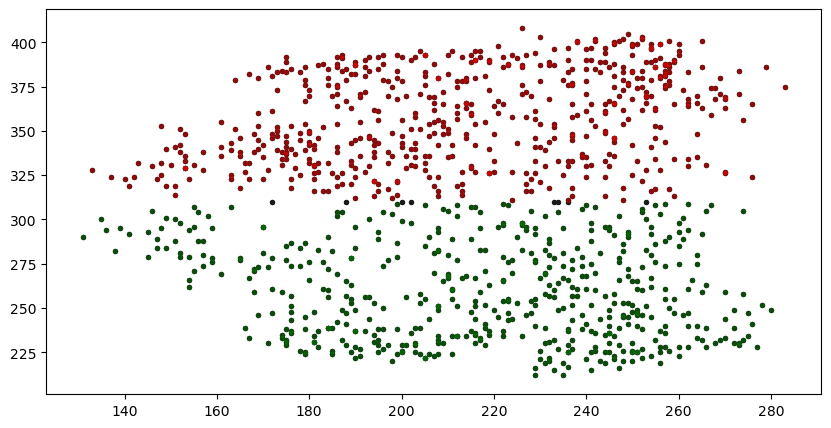

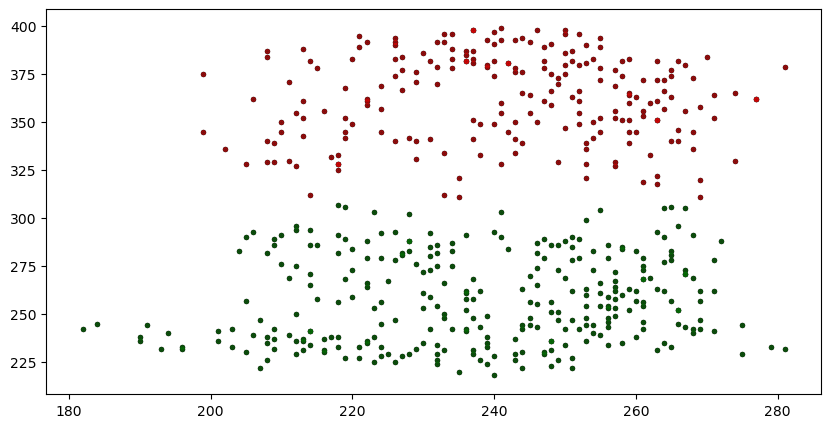

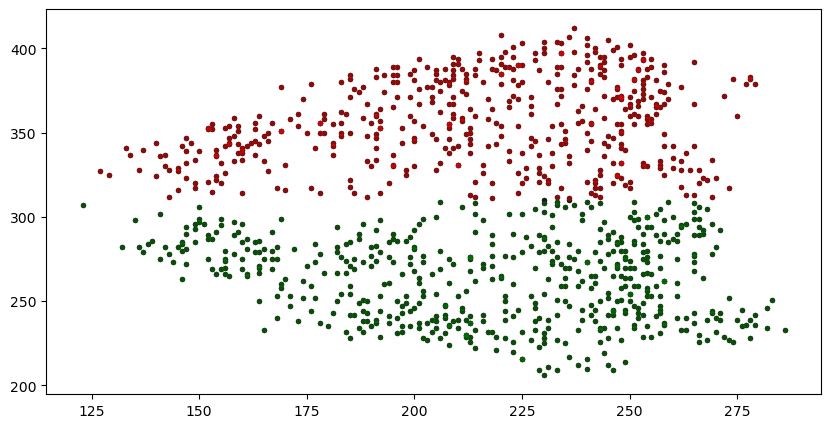

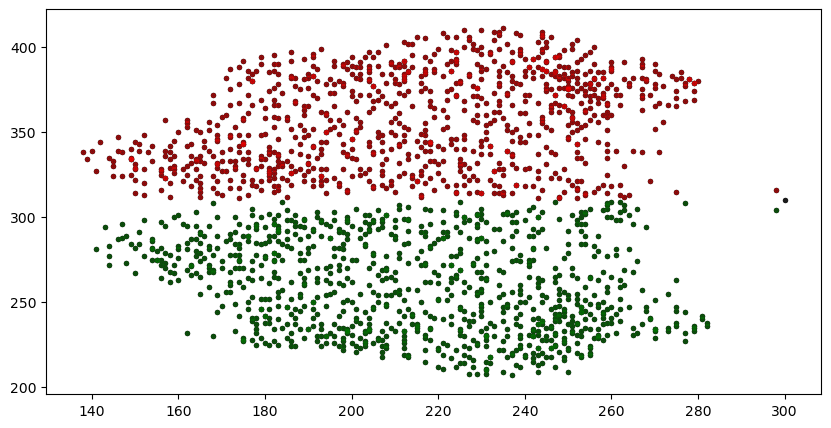

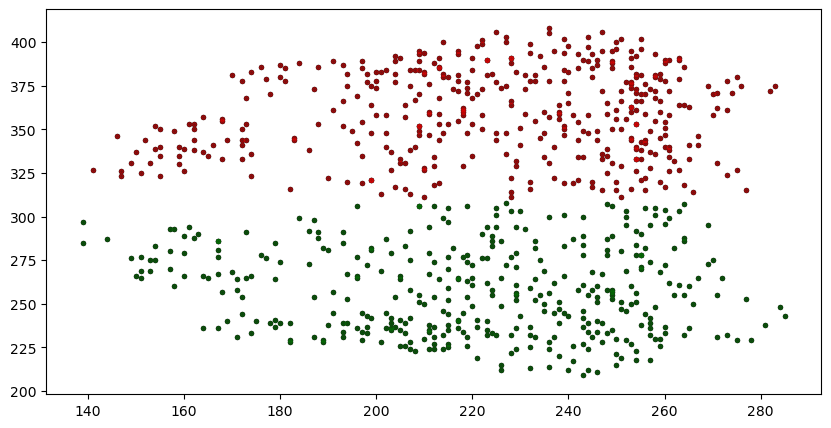

In [155]:
coord_ch = hom_lab_coord
dff_ch = hom_reg_deltaff
bind_ch = hom_reg_bind

hom_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))

    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    hom_list[i] = corrme(trace[0], sub_coord, cutoff)


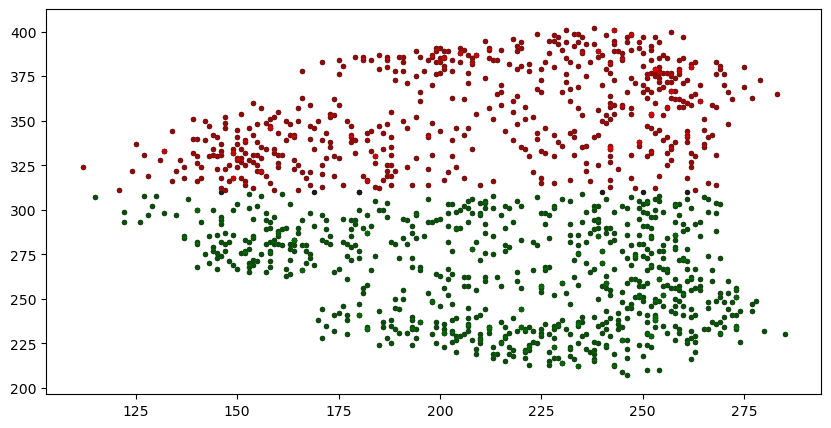

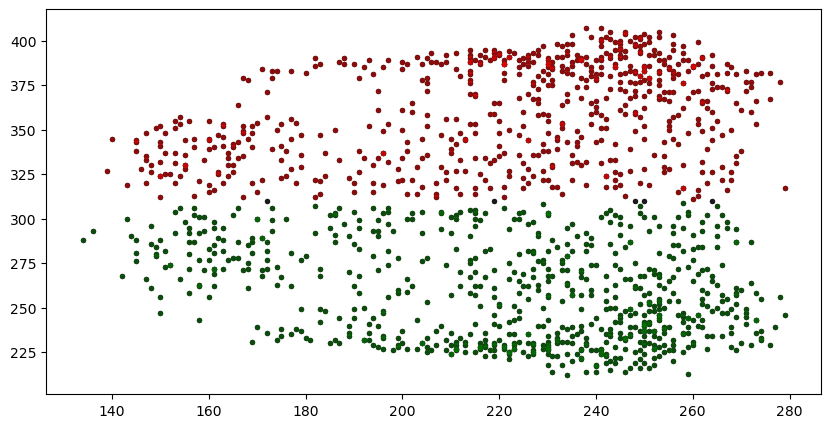

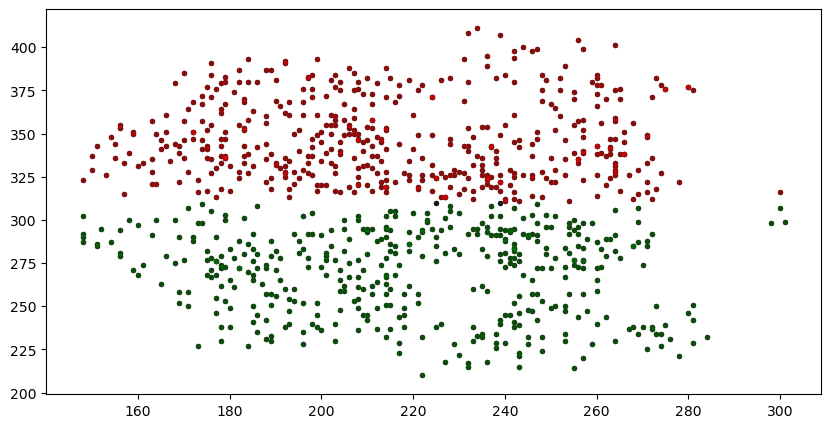

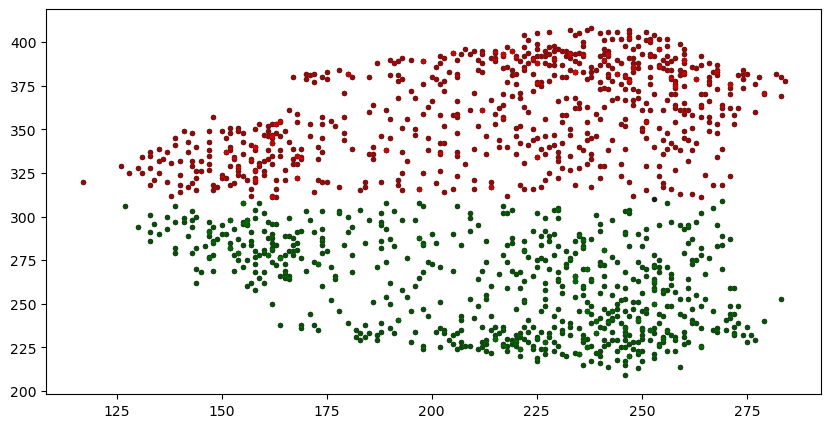

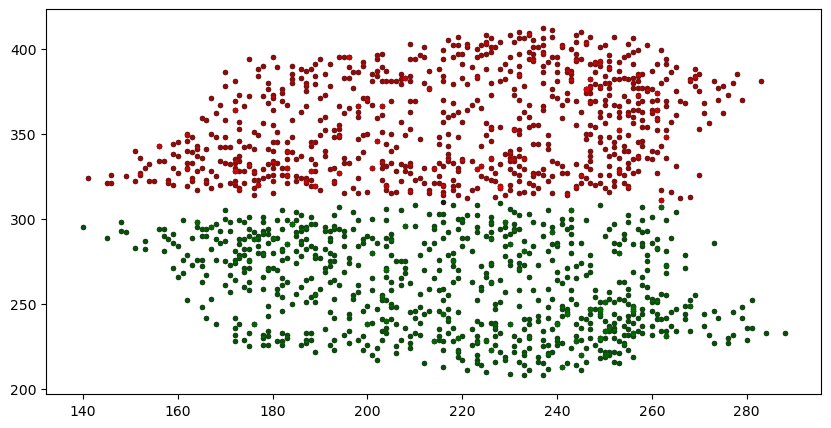

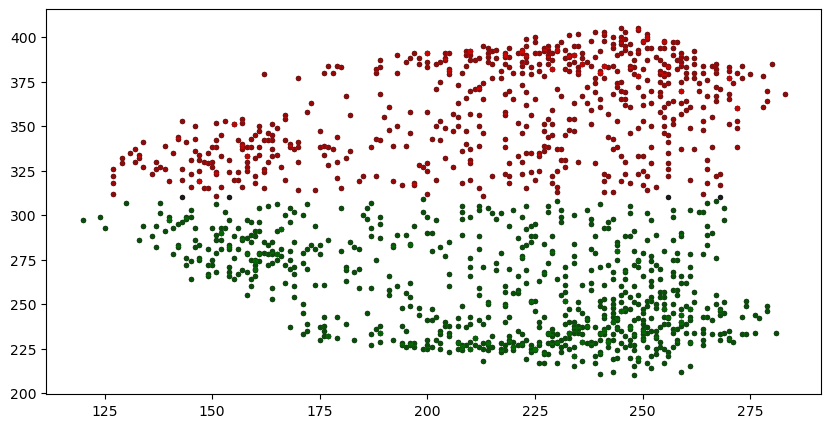

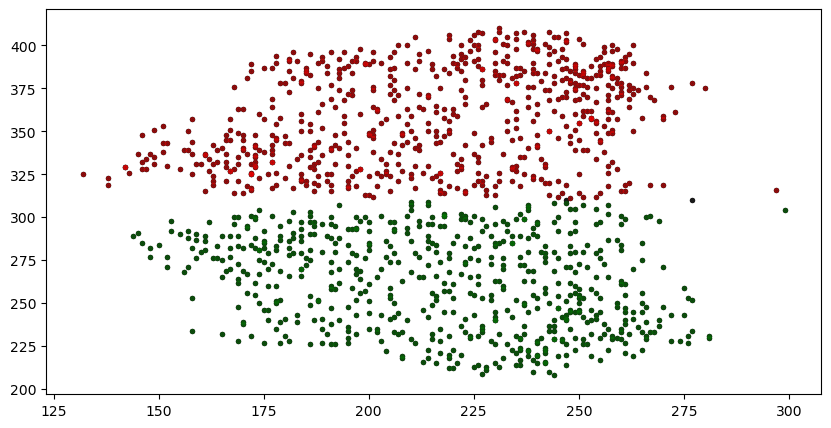

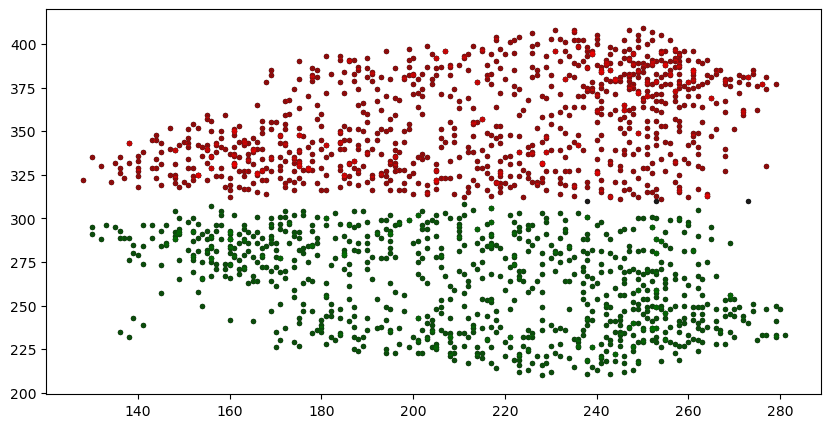

In [157]:
coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind

het_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    het_list[i] = corrme(trace[0], sub_coord, cutoff)


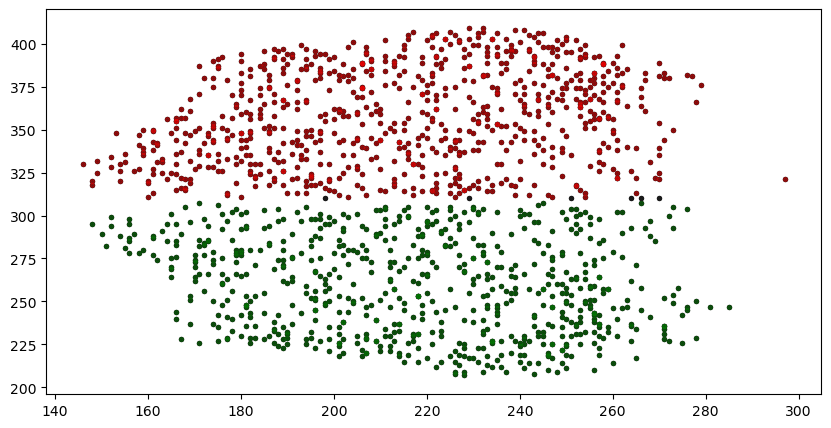

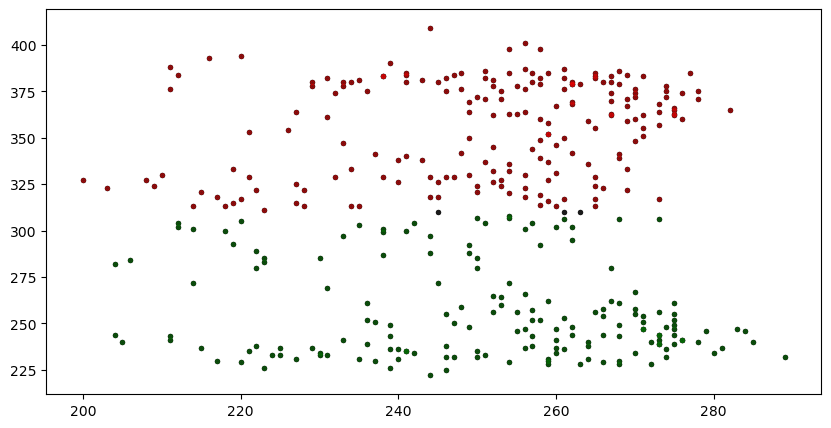

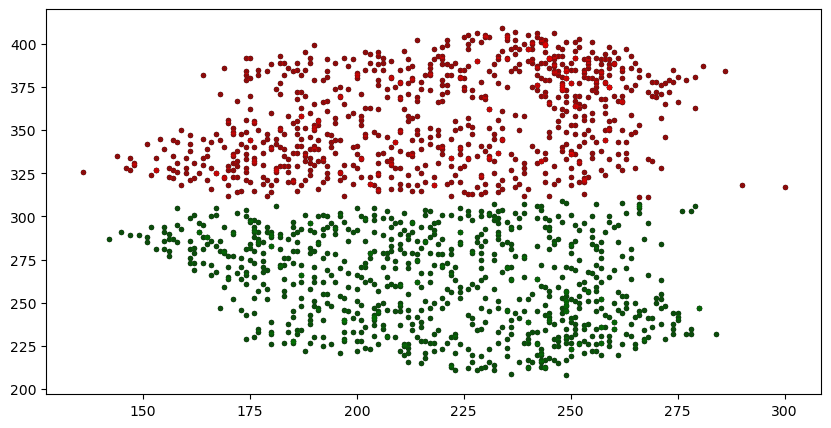

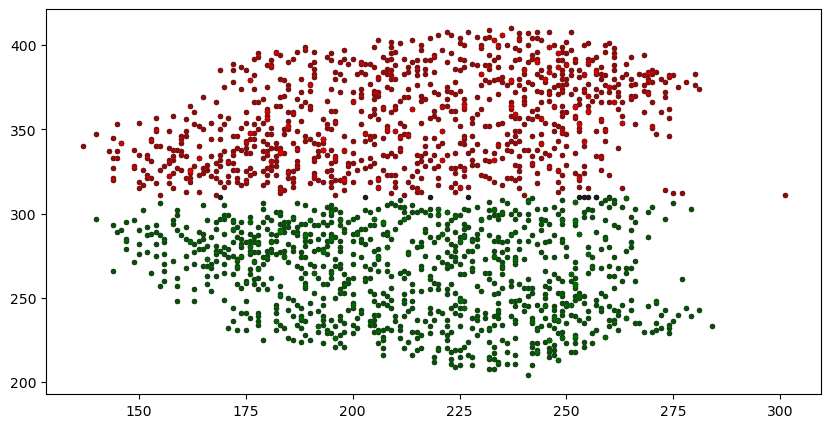

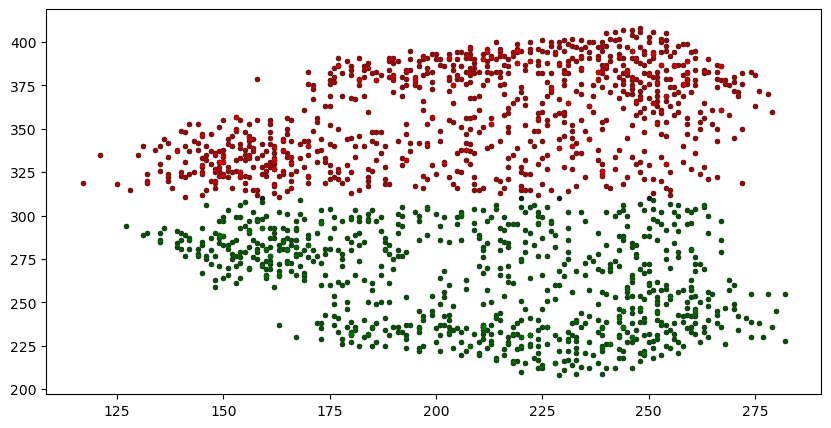

In [158]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind

wt_list = list(range(len(coord_ch)))

for i in range(len(coord_ch)):
    time = 9828
    wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur = list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch))),list(range(len(coord_ch)))
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

    from matplotlib import cm
    plt.figure(figsize = (10,5))

    cutoff = 310
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
    plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
    plt.show()

    wt_list[i] = corrme(trace[0], sub_coord, cutoff)


In [145]:
corrme(trace[0], sub_coord, cutoff)

0.06612412481749158

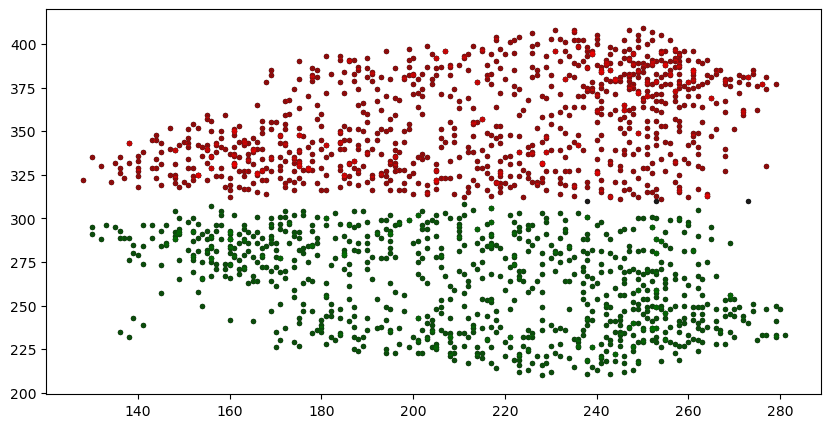

0.0333798206019106

In [146]:
coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind
time = 9828

i = 7
coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')

from matplotlib import cm
plt.figure(figsize = (10,5))

cutoff = 310
sub_coord = (coord[:,:3].astype(float)).astype(int)
plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, alpha = 0.9, c = 'k')
plt.scatter(sub_coord[:,1][sub_coord[:,0] > cutoff],sub_coord[:,0][sub_coord[:,0] > cutoff], s = 8, alpha = 0.4, c = 'red')
plt.scatter(sub_coord[:,1][sub_coord[:,0] < cutoff],sub_coord[:,0][sub_coord[:,0] < cutoff], s = 8, alpha = 0.4, c = 'green')
plt.show()
corrme(trace[0], sub_coord, cutoff)

In [447]:
#pallium and subpallium

coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind
time = 9828
wt_spikes_p, wt_amp_p, wt_n_trans_p, wt_mean_transdur_p = [],[],[],[]
wt_spikes_s, wt_amp_s, wt_n_trans_s, wt_mean_transdur_s = [],[],[],[]


for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i])[:,time:], np.load(bind_ch[i])[:,time:]], 'Telencephalon')
    pal_coord = coord[coord[:,3] == 'Pallium'][:,:3]
    pal_dff = trace[0][coord[:,3] == 'Pallium']
    pal_bind = trace[1][coord[:,3] == 'Pallium']
    
    subpal_coord = coord[coord[:,3] == 'Subpallium'][:,:3]
    subpal_dff = trace[0][coord[:,3] == 'Subpallium']
    subpal_bind = trace[1][coord[:,3] == 'Subpallium']
    
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(pal_bind,pal_dff)
    wt_spikes_p.extend(spikes)
    wt_amp_p.extend(mean_amp)
    wt_n_trans_p.extend(n_trans)
    wt_mean_transdur_p.extend(mean_transdur) 
    
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(subpal_bind,subpal_dff)
    wt_spikes_s.extend(spikes)
    wt_amp_s.extend(mean_amp)
    wt_n_trans_s.extend(n_trans)
    wt_mean_transdur_s.extend(mean_transdur) 
    
    

coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind
het_spikes_p, het_amp_p, het_n_trans_p, het_mean_transdur_p = [],[],[],[]
het_spikes_s, het_amp_s, het_n_trans_s, het_mean_transdur_s = [],[],[],[]

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i])[:,time:], np.load(bind_ch[i])[:,time:]], 'Telencephalon')
    pal_coord = coord[coord[:,3] == 'Pallium'][:,:3]
    pal_dff = trace[0][coord[:,3] == 'Pallium']
    pal_bind = trace[1][coord[:,3] == 'Pallium']
    
    subpal_coord = coord[coord[:,3] == 'Subpallium'][:,:3]
    subpal_dff = trace[0][coord[:,3] == 'Subpallium']
    subpal_bind = trace[1][coord[:,3] == 'Subpallium']
    
    
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(pal_bind,pal_dff)
    het_spikes_p.extend(spikes)
    het_amp_p.extend(mean_amp)
    het_n_trans_p.extend(n_trans)
    het_mean_transdur_p.extend(mean_transdur) 
    
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(subpal_bind,subpal_dff)
    het_spikes_s.extend(spikes)
    het_amp_s.extend(mean_amp)
    het_n_trans_s.extend(n_trans)
    het_mean_transdur_s.extend(mean_transdur) 

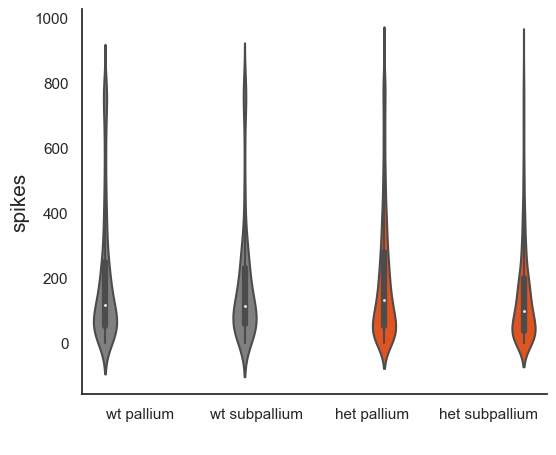

In [448]:
name = 'Spikes'
wt_p_data = wt_spikes_p
wt_s_data = wt_spikes_s
het_p_data = het_spikes_p
het_s_data = het_spikes_s
data = []
data.extend(wt_spikes_p + wt_spikes_s + het_spikes_p + het_spikes_s)
labels = []
labels.extend( (adfn.repeat_list('wt pallium', len(wt_p_data)) +  
                adfn.repeat_list('wt subpallium', len(wt_s_data)) + 
                adfn.repeat_list('het pallium', len(het_p_data)) ) +
                adfn.repeat_list('het subpallium', len(het_s_data)))
df = pd.DataFrame({name:data , "Labels": labels})


from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey','grey', 'orangered', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y="Spikes", data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('spikes', size = '15')
ax.legend_.remove()
plt.show()

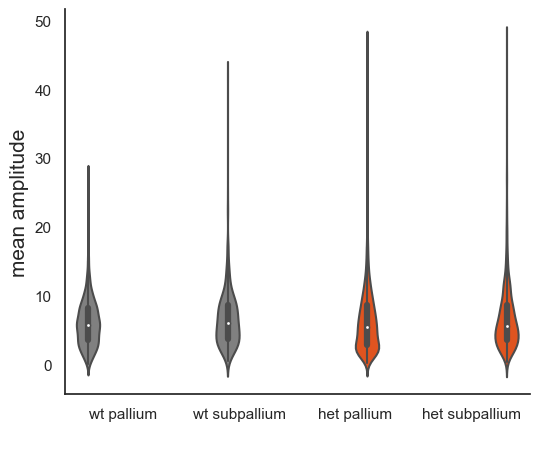

In [449]:
name = 'mean amplitude'
wt_p_data = wt_amp_p
wt_s_data = wt_amp_s
het_p_data = het_amp_p
het_s_data = het_amp_s
data = []
data.extend(wt_amp_p + wt_amp_s + het_amp_p + het_amp_s)
labels = []
labels.extend( (adfn.repeat_list('wt pallium', len(wt_p_data)) +  
                adfn.repeat_list('wt subpallium', len(wt_s_data)) + 
                adfn.repeat_list('het pallium', len(het_p_data)) ) +
                adfn.repeat_list('het subpallium', len(het_s_data)))
df = pd.DataFrame({name:data , "Labels": labels})


from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey','grey', 'orangered', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

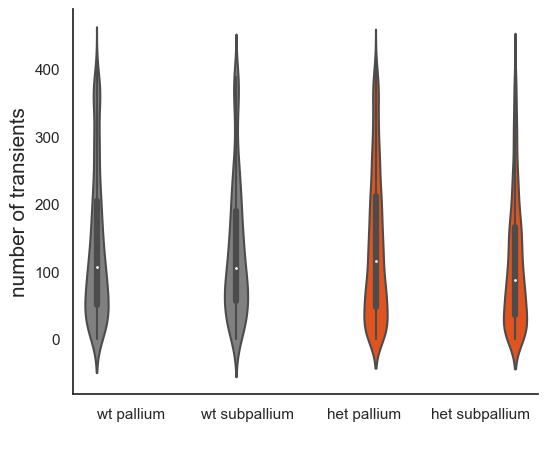

In [450]:
name = 'number of transients'
wt_p_data = wt_n_trans_p
wt_s_data = wt_n_trans_s
het_p_data = het_n_trans_p
het_s_data = het_n_trans_s
data = []
data.extend(wt_n_trans_p + wt_n_trans_s + het_n_trans_p + het_n_trans_s)
labels = []
labels.extend( (adfn.repeat_list('wt pallium', len(wt_p_data)) +  
                adfn.repeat_list('wt subpallium', len(wt_s_data)) + 
                adfn.repeat_list('het pallium', len(het_p_data)) ) +
                adfn.repeat_list('het subpallium', len(het_s_data)))
df = pd.DataFrame({name:data , "Labels": labels})


from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey','grey', 'orangered', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

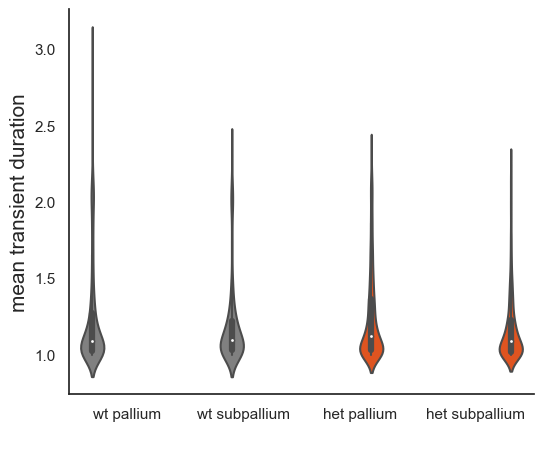

In [451]:
name = 'mean transient duration'
wt_p_data = wt_mean_transdur_p
wt_s_data = wt_mean_transdur_s
het_p_data = het_mean_transdur_p
het_s_data = het_mean_transdur_s
data = []
data.extend(wt_mean_transdur_p + wt_mean_transdur_s + het_mean_transdur_p + het_mean_transdur_s)
labels = []
labels.extend( (adfn.repeat_list('wt pallium', len(wt_p_data)) +  
                adfn.repeat_list('wt subpallium', len(wt_s_data)) + 
                adfn.repeat_list('het pallium', len(het_p_data)) ) +
                adfn.repeat_list('het subpallium', len(het_s_data)))
df = pd.DataFrame({name:data , "Labels": labels})


from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey','grey', 'orangered', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

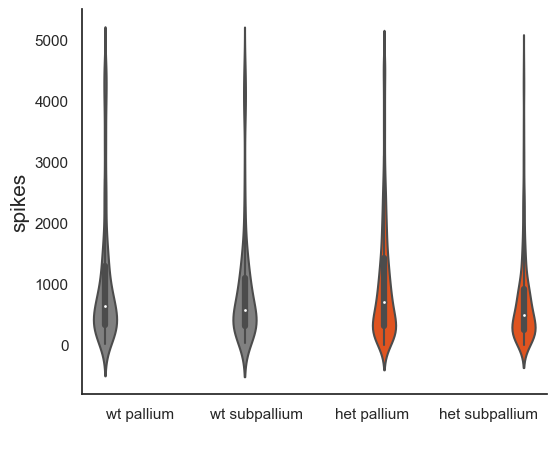

In [443]:
name = 'Spikes'
wt_p_data = wt_spikes_p
wt_s_data = wt_spikes_s
het_p_data = het_spikes_p
het_s_data = het_spikes_s
data = []
data.extend(wt_spikes_p + wt_spikes_s + het_spikes_p + het_spikes_s)
labels = []
labels.extend( (adfn.repeat_list('wt pallium', len(wt_p_data)) +  
                adfn.repeat_list('wt subpallium', len(wt_s_data)) + 
                adfn.repeat_list('het pallium', len(het_p_data)) ) +
                adfn.repeat_list('het subpallium', len(het_s_data)))
df = pd.DataFrame({name:data , "Labels": labels})


from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey','grey', 'orangered', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y="Spikes", data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('spikes', size = '15')
ax.legend_.remove()
plt.show()

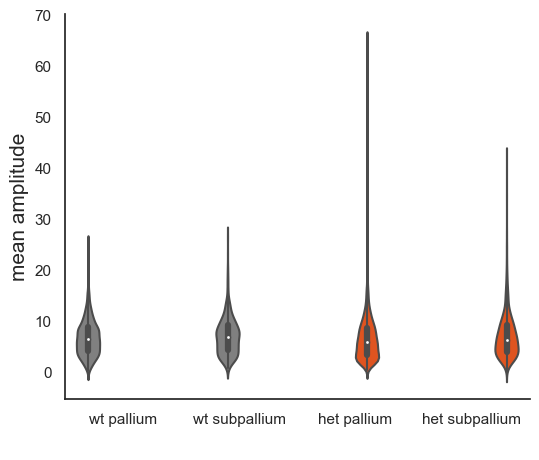

In [444]:
name = 'mean amplitude'
wt_p_data = wt_amp_p
wt_s_data = wt_amp_s
het_p_data = het_amp_p
het_s_data = het_amp_s
data = []
data.extend(wt_amp_p + wt_amp_s + het_amp_p + het_amp_s)
labels = []
labels.extend( (adfn.repeat_list('wt pallium', len(wt_p_data)) +  
                adfn.repeat_list('wt subpallium', len(wt_s_data)) + 
                adfn.repeat_list('het pallium', len(het_p_data)) ) +
                adfn.repeat_list('het subpallium', len(het_s_data)))
df = pd.DataFrame({name:data , "Labels": labels})


from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey','grey', 'orangered', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

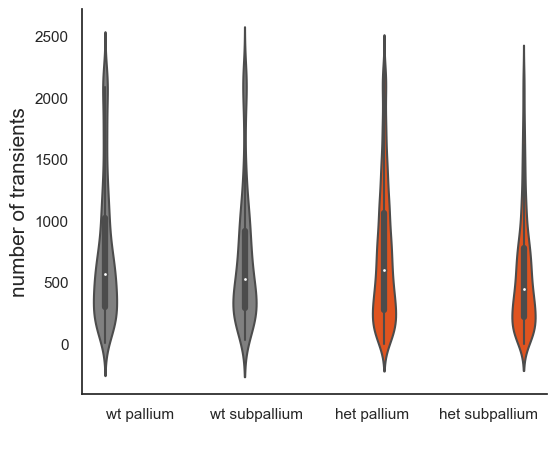

In [445]:
name = 'number of transients'
wt_p_data = wt_n_trans_p
wt_s_data = wt_n_trans_s
het_p_data = het_n_trans_p
het_s_data = het_n_trans_s
data = []
data.extend(wt_n_trans_p + wt_n_trans_s + het_n_trans_p + het_n_trans_s)
labels = []
labels.extend( (adfn.repeat_list('wt pallium', len(wt_p_data)) +  
                adfn.repeat_list('wt subpallium', len(wt_s_data)) + 
                adfn.repeat_list('het pallium', len(het_p_data)) ) +
                adfn.repeat_list('het subpallium', len(het_s_data)))
df = pd.DataFrame({name:data , "Labels": labels})


from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey','grey', 'orangered', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

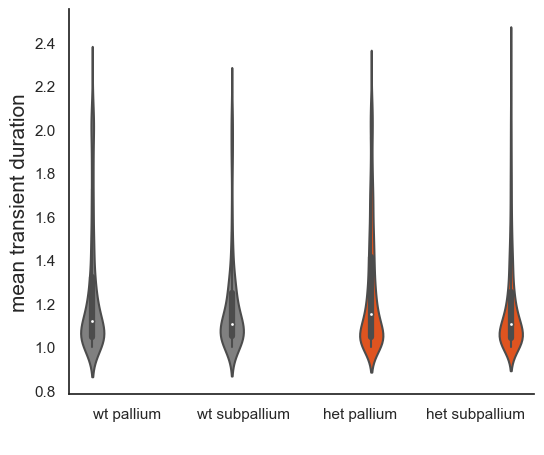

In [446]:
name = 'mean transient duration'
wt_p_data = wt_mean_transdur_p
wt_s_data = wt_mean_transdur_s
het_p_data = het_mean_transdur_p
het_s_data = het_mean_transdur_s
data = []
data.extend(wt_mean_transdur_p + wt_mean_transdur_s + het_mean_transdur_p + het_mean_transdur_s)
labels = []
labels.extend( (adfn.repeat_list('wt pallium', len(wt_p_data)) +  
                adfn.repeat_list('wt subpallium', len(wt_s_data)) + 
                adfn.repeat_list('het pallium', len(het_p_data)) ) +
                adfn.repeat_list('het subpallium', len(het_s_data)))
df = pd.DataFrame({name:data , "Labels": labels})


from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey','grey', 'orangered', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

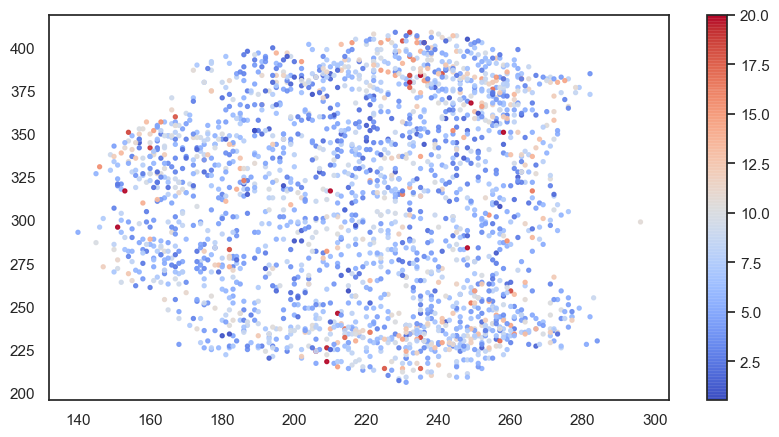

In [480]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind


for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(trace[1],trace[0])
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, c = mean_amp , alpha = 0.9, cmap = 'coolwarm', vmax = 20)
plt.colorbar()
plt.show()

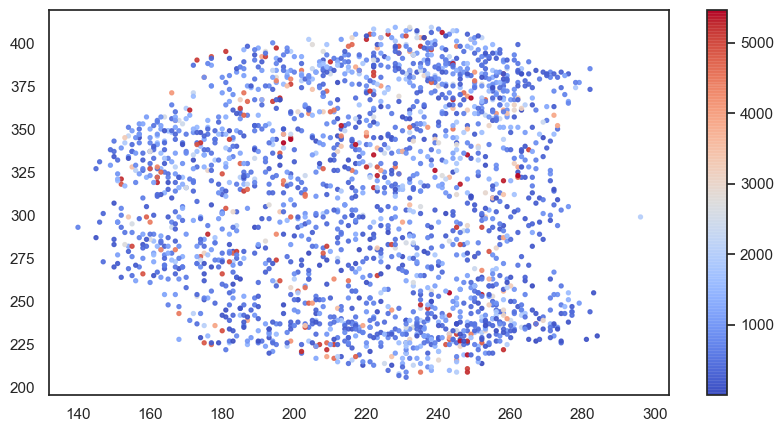

In [476]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind


for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(trace[1],trace[0])
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, c = spikes , alpha = 0.9, cmap = 'coolwarm')#, vmax = 250000)
plt.colorbar()
plt.show()

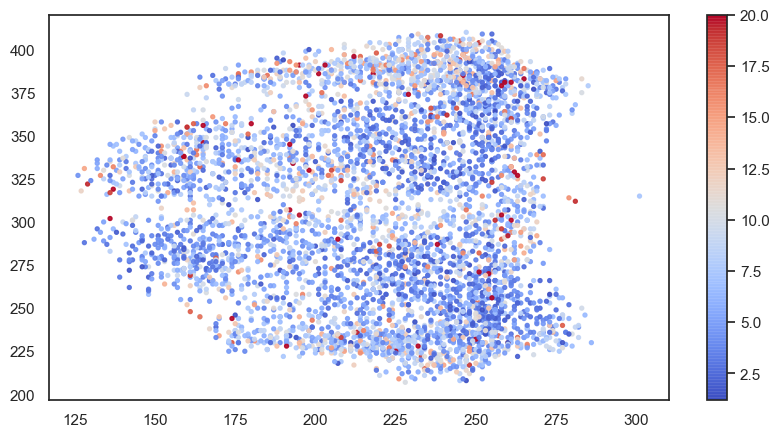

In [481]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(trace[1],trace[0])
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, c = mean_amp , alpha = 0.9, cmap = 'coolwarm', vmax = 20)
plt.colorbar()

plt.show()

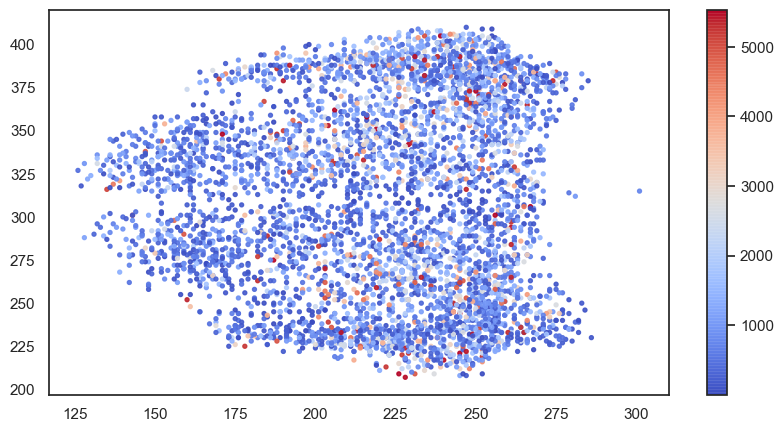

In [474]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(trace[1],trace[0])
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 8, c = spikes , alpha = 0.9, cmap = 'coolwarm')
plt.colorbar()

plt.show()

In [376]:
#PTZ02
wt_lab_coord = sorted(glob.glob('*++*PTZ02_*labcoord.npy*')) 
wt_reg_deltaff = sorted(glob.glob('*++*PTZ02_*regdeltaff.npy*'))
wt_reg_bind = sorted(glob.glob('*++*PTZ02_*regbinarised.npy*'))

het_lab_coord = sorted(glob.glob('*1+-*PTZ02_*labcoord.npy*')) 
het_reg_deltaff = sorted(glob.glob('*1+-*PTZ02_*regdeltaff.npy*'))
het_reg_bind = sorted(glob.glob('*1+-*PTZ02_*regbinarised.npy*'))
wt_lab_coord, wt_reg_deltaff, wt_reg_bind, het_lab_coord, het_reg_deltaff, het_reg_bind

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_regbinarised.npy'],
 ['BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--03_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--04_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--05_2photon_sess-01-6dpf_PTZ02_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1+--03_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1+--04_2photon_sess-01-6dpf_PTZ02_run-01_regdeltaff.npy',
  '

In [377]:
coord_ch = wt_lab_coord
dff_ch = wt_reg_deltaff
bind_ch = wt_reg_bind
wt_spikes, wt_amp, wt_n_trans, wt_mean_transdur = [],[],[],[]

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(trace[1], trace[0])
    wt_spikes.extend(spikes)
    wt_amp.extend(mean_amp)
    wt_n_trans.extend(n_trans)
    wt_mean_transdur.extend(mean_transdur) 
    

coord_ch = het_lab_coord
dff_ch = het_reg_deltaff
bind_ch = het_reg_bind
het_spikes, het_amp, het_n_trans, het_mean_transdur = [],[],[],[]

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(dff_ch[i]), np.load(bind_ch[i])], 'Telencephalon')
    spikes, mean_amp, n_trans, mean_transdur = mafn.spike_stats(trace[1], trace[0])
    het_spikes.extend(spikes)
    het_amp.extend(mean_amp)
    het_n_trans.extend(n_trans)
    het_mean_transdur.extend(mean_transdur) 

In [391]:
np.unique(coord[:,3])

array(['Pallium', 'Subpallium'], dtype='<U43')

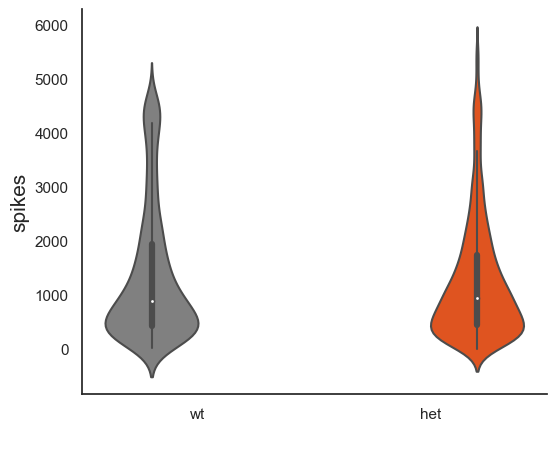

In [378]:
data = np.append(wt_spikes, het_spikes)
labels = np.append(adfn.repeat_list('wt', len(wt_spikes)), adfn.repeat_list('het', len(het_spikes)))
df = pd.DataFrame({"Spikes":data , "Labels": labels})

from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y="Spikes", data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel('spikes', size = '15')
ax.legend_.remove()
plt.show()

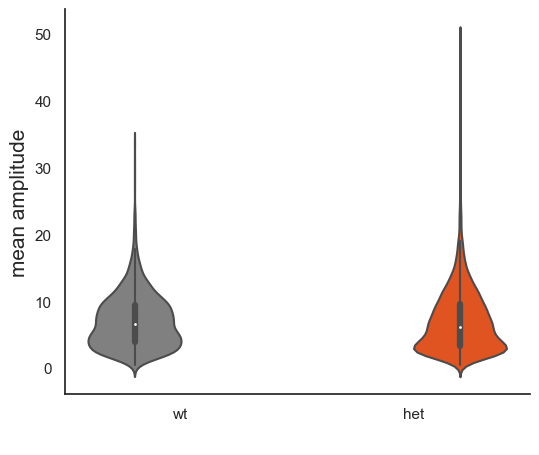

In [379]:
name = 'mean amplitude'
wt_data = wt_amp
het_data = het_amp
data = np.append(wt_data, het_data)
labels = np.append(adfn.repeat_list('wt', len(wt_data)), adfn.repeat_list('het', len(het_data)))
df = pd.DataFrame({name:data , "Labels": labels})

from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

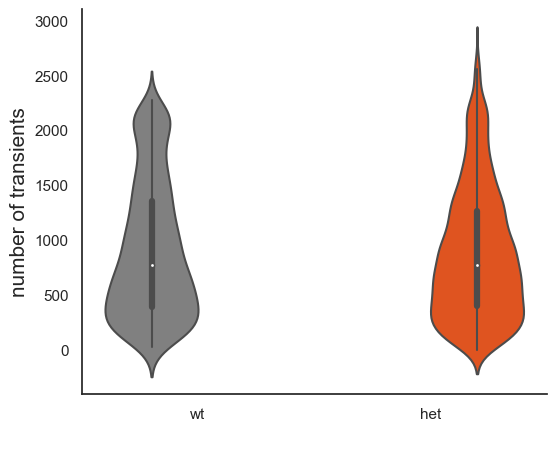

In [380]:
name = 'number of transients'
wt_data = wt_n_trans
het_data = het_n_trans
data = np.append(wt_data, het_data)
labels = np.append(adfn.repeat_list('wt', len(wt_data)), adfn.repeat_list('het', len(het_data)))
df = pd.DataFrame({name:data , "Labels": labels})

from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

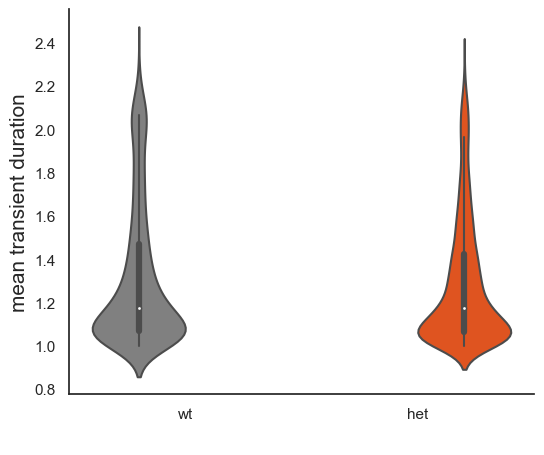

In [381]:
name = 'mean transient duration'
wt_data = wt_mean_transdur
het_data = het_mean_transdur
data = np.append(wt_data, het_data)
labels = np.append(adfn.repeat_list('wt', len(wt_data)), adfn.repeat_list('het', len(het_data)))
df = pd.DataFrame({name:data , "Labels": labels})

from matplotlib.collections import PathCollection
sns.set(style="white")
colors = ['grey', 'orangered']
fig, ax = plt.subplots(figsize = (6,5))

ax = sns.violinplot(x="Labels", y=name, data = df, palette = colors, hue = 'Labels')

points = ax.collections
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(' ', size = '13')
ax.set_ylabel(name, size = '15')
ax.legend_.remove()
plt.show()

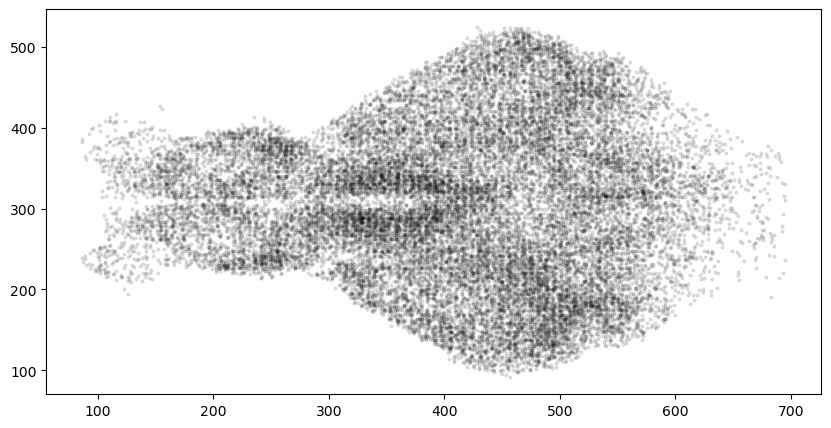

In [140]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = wt_lab_coord
trace_ch = wt_reg_deltaff

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(trace_ch[i])], 'inbrain')
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 4, c = 'k', alpha = 0.1)
plt.show()

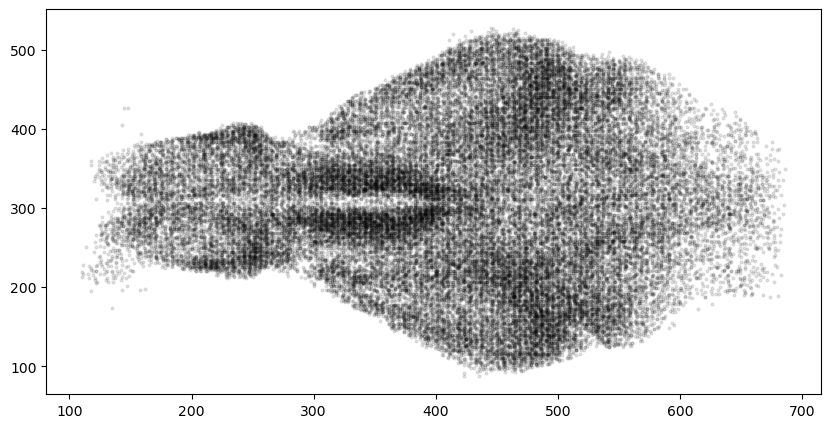

In [142]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = het_lab_coord
trace_ch = het_reg_deltaff

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(trace_ch[i])], 'inbrain')
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 4, c = 'k', alpha = 0.1)
plt.show()

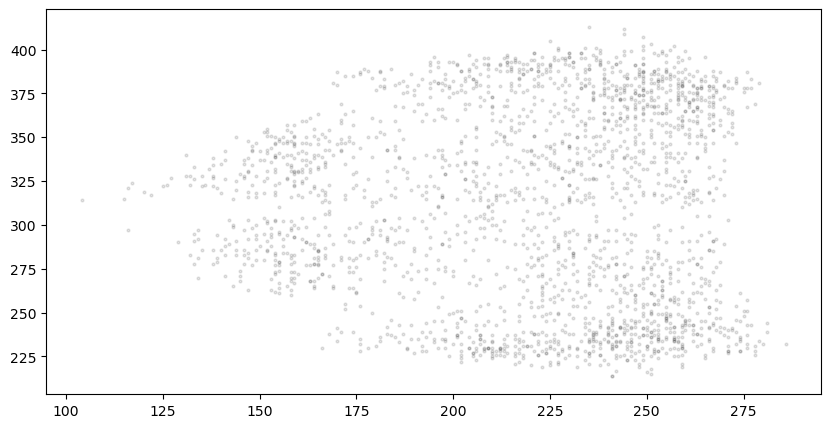

In [147]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = wt_lab_coord
trace_ch = wt_reg_deltaff

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(trace_ch[i])], 'Telencephalon')
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 4, c = 'k', alpha = 0.1)
plt.show()

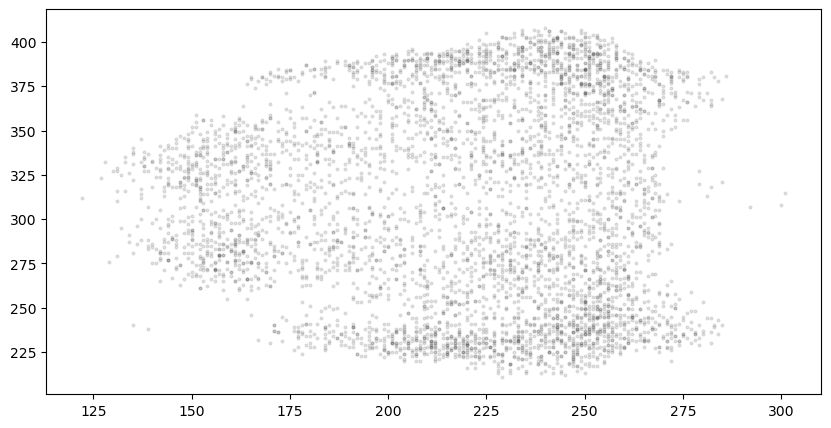

In [148]:
from matplotlib import cm
plt.figure(figsize = (10,5))
colors  = cm.coolwarm_r(np.linspace(0,1,len(lab_coord)))

coord_ch = het_lab_coord
trace_ch = het_reg_deltaff

for i in range(len(coord_ch)):
    coord, trace = mafn.select_cell_trace(np.load(coord_ch[i]), [np.load(trace_ch[i])], 'Telencephalon')
    sub_coord = (coord[:,:3].astype(float)).astype(int)
    plt.scatter(sub_coord[:,1],sub_coord[:,0], s = 4, c = 'k', alpha = 0.1)
plt.show()

# Network properties

In [482]:
#SPONTANEOUS
wt_lab_coord = sorted(glob.glob('*++*BLNLIGHT_*labcoord.npy*')) 
wt_reg_deltaff = sorted(glob.glob('*++*BLNLIGHT_*regdeltaff.npy*'))
wt_reg_bind = sorted(glob.glob('*++*BLNLIGHT_*regbinarised.npy*'))
het_lab_coord = sorted(glob.glob('*1+-*BLNLIGHT_*labcoord.npy*')) 
het_reg_deltaff = sorted(glob.glob('*1+-*BLNLIGHT_*regdeltaff.npy*'))
het_reg_bind = sorted(glob.glob('*1+-*BLNLIGHT_*regbinarised.npy*'))
wt_lab_coord, wt_reg_deltaff, wt_reg_bind, het_lab_coord, het_reg_deltaff, het_reg_bind

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_regbinarised.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_regbinarised.npy'],
 ['BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--03_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--04_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--05_2photon_sess-01-6dpf_BLNLIGHT_run-01_labcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1+--03_2photon_sess-01-6dpf_BLNLIGHT_run-01_regdeltaff.npy',
  'BLNLIGHTPTZ-FOXG1+--04_2photon_sess-01-6d

In [ ]:
#Functions
def Zscore(null_data, alt_data):
    euc_mat_null = np.zeros((len(null_data), len(null_data)))
    comp_euc_mat = np.zeros((len(alt_data), len(null_data)))

    for i in range(len(null_data)):
        for e in range(len(null_data)):
            euc_mat_null[i][e] = np.linalg.norm(null_data[i]-null_data[e])

    euc_nulldist = np.triu(euc_mat_null)[np.where(np.triu(euc_mat_null) !=0)]

    for i in range(len(alt_data)):
        for e in range(len(null_data)):
            comp_euc_mat[i][e] = np.linalg.norm(alt_data[i]-null_data[e])
    mean = np.mean(euc_mat_null)
    std = np.std(euc_mat_null)
    Z = (np.mean(comp_euc_mat) - mean) /std
    Z  
    return(Z, euc_nulldist, comp_euc_mat)
    

# Avalanches

In [ ]:
experiment = 'BLNLIGHTPTZ-FOXG1'
savepath = Fdrop + 'Project/' + experiment + os.sep 
os.chdir(Fdrop + 'Project/' + experiment)
het_avlist = sorted(glob.glob('*1+-*BLNLIGHT*av*'))
hom_avlist =  sorted(glob.glob('*1--*BLNLIGHT*av*'))
wt_avlist = sorted(glob.glob('*1++*BLNLIGHT*av*'))
wt_avlist, het_avlist, hom_avlist

In [22]:
experiment = 'BLNLIGHTPTZ-FOXG1'
savepath = Fdrop + 'Project/' + experiment + os.sep 
os.chdir(Fdrop + 'Project/' + experiment)
binlist = sorted(glob.glob('*binarised*'))
coordlist =  sorted(glob.glob('*realcoord*'))
coordlist

['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_PTZ02_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy',
 'BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_PTZ02_run-01_realcoord.npy']

In [ ]:
#NNB
size = 20
for i in range(len(coordlist)):
    name = coordlist[i][:coordlist[i].find('run')+7]
    nnb = crfn.neighbour_new(np.load(coordlist[i]), size, [.8, .8, 15])
    np.save(savepath + name + str(size) + '-nnb.npy', nnb)

In [3]:
experiment = 'BLNLIGHTPTZ-FOXG1'
os.chdir(Fdrop + 'Project/' + experiment)
nnblist = sorted(glob.glob('*nnb*'))
avlist = sorted(glob.glob('*av*'))
nnblist, avlist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_BLNLIGHT_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_PTZ02_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_BLNLIGHT_run-01_20-nnb.npy',
  'BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_PTZ02_run-01_20-nnb.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01

In [25]:
#Avalanches
for i in range(len(nnblist)):
    name = nnblist[i][:nnblist[i].find('run')+7]
    av, pkg = crfn.avalanche_r(np.load(nnblist[i]), np.load(binlist[i]))
    np.save(savepath + name + 'av.npy', av)
    np.save(savepath + name + 'pkg.npy', pkg)

In [23]:
plotlist = wt_avlist, het_avlist, hom_avlist
plotlist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy'],
 ['BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy'],
 ['BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy'])

In [37]:
i = 1
e = 0
np.load(plotlist[i][e])[choose][1:]

array([8, 3, 9, ..., 5, 3, 3])

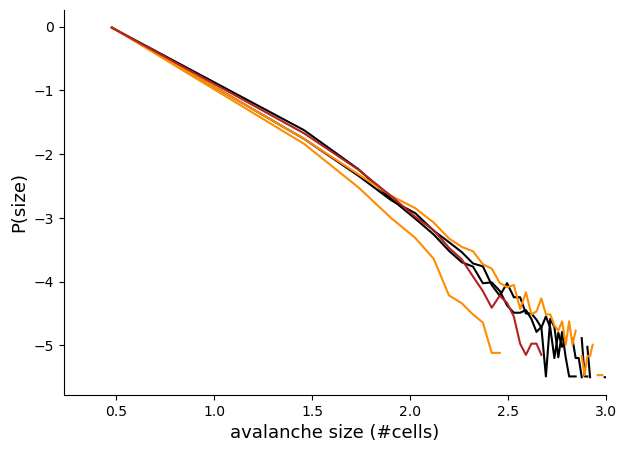

In [43]:
#BLNLIGHT

import matplotlib

choose = 0
bins= 100000

plotlist = wt_avlist, het_avlist, hom_avlist
fig, axarr = plt.subplots(figsize = (7,5))
sns.reset_orig()
colors = ['k', 'darkorange', 'firebrick']

binvec = []
for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):
        binvec = np.append(binvec, np.load(plotlist[i][e])[choose][1:])
mini = np.min(binvec)
maxi = np.max(binvec)


for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):

        avdistcut = np.load(plotlist[i][e])[choose][1:]
        binned=np.linspace(mini,maxi, bins)
        hist = np.histogram(avdistcut, bins = binned)
        xaxis = np.log10(hist[1][:-1])
        yaxis = np.log10(hist[0]/np.sum(hist[0]))
        axarr.plot(xaxis[:len(xaxis)-1], yaxis[:len(xaxis)-1], '-', linewidth = 1.5, markersize = 1, alpha = 1, c = colors[i])
axarr.set_ylabel('P(size)', size = '13')
axarr.set_xlabel('avalanche size (#cells)', size = '13')
axarr.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
axarr.spines['top'].set_visible(False)
axarr.spines['right'].set_visible(False)
plt.xlim(right = 3)  
plt.show()

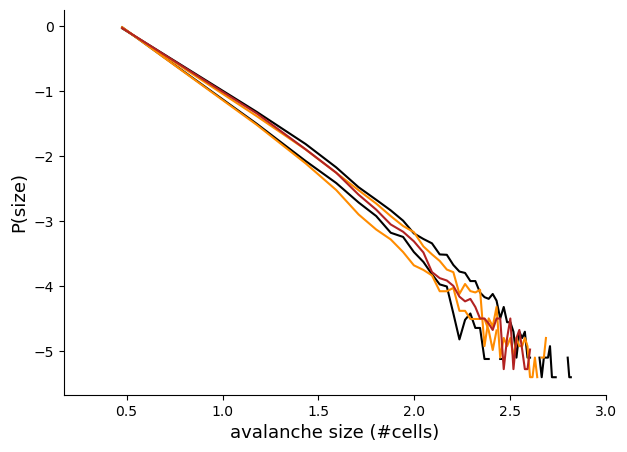

In [56]:
#PTZ02

import matplotlib

choose = 0
bins= 500000

plotlist = wt_avlist, het_avlist, hom_avlist
fig, axarr = plt.subplots(figsize = (7,5))
sns.reset_orig()
colors = ['k', 'darkorange', 'firebrick']

binvec = []
for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):
        binvec = np.append(binvec, np.load(plotlist[i][e])[choose][1:])
mini = np.min(binvec)
maxi = np.max(binvec)


for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):

        avdistcut = np.load(plotlist[i][e])[choose][1:]
        binned=np.linspace(mini,maxi, bins)
        hist = np.histogram(avdistcut, bins = binned)
        xaxis = np.log10(hist[1][:-1])
        yaxis = np.log10(hist[0]/np.sum(hist[0]))
        axarr.plot(xaxis[:len(xaxis)-1], yaxis[:len(xaxis)-1], '-', linewidth = 1.5, markersize = 1, alpha = 1, c = colors[i])
axarr.set_ylabel('P(size)', size = '13')
axarr.set_xlabel('avalanche size (#cells)', size = '13')
axarr.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
axarr.spines['top'].set_visible(False)
axarr.spines['right'].set_visible(False)
plt.xlim(right = 3)  
plt.show()

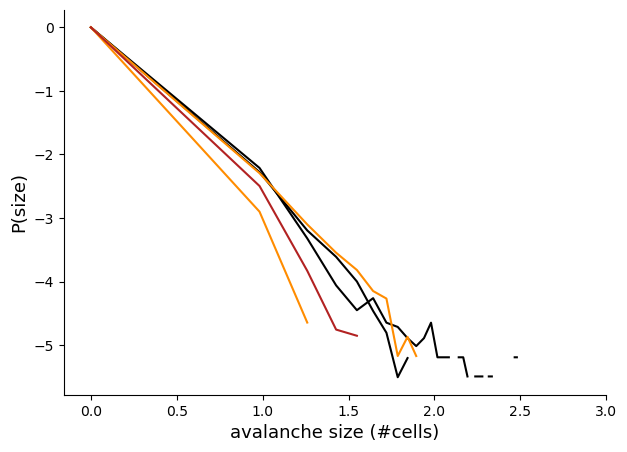

In [44]:
import matplotlib

choose = 1
bins= 10000
plotlist = wt_avlist, het_avlist, hom_avlist
fig, axarr = plt.subplots(figsize = (7,5))
sns.reset_orig()
colors = ['k', 'darkorange', 'firebrick']

binvec = []
for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):
        binvec = np.append(binvec, np.load(plotlist[i][e])[choose][1:])
mini = np.min(binvec)
maxi = np.max(binvec)


for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):

        avdistcut = np.load(plotlist[i][e])[choose][1:]
        binned=np.linspace(mini,maxi, bins)
        hist = np.histogram(avdistcut, bins = binned)
        xaxis = np.log10(hist[1][:-1])
        yaxis = np.log10(hist[0]/np.sum(hist[0]))
        axarr.plot(xaxis[:len(xaxis)-1], yaxis[:len(xaxis)-1], '-', linewidth = 1.5, markersize = 1, alpha = 1, c = colors[i])
axarr.set_ylabel('P(size)', size = '13')
axarr.set_xlabel('avalanche size (#cells)', size = '13')
axarr.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
axarr.spines['top'].set_visible(False)
axarr.spines['right'].set_visible(False)
plt.xlim(right = 3)  
plt.show()


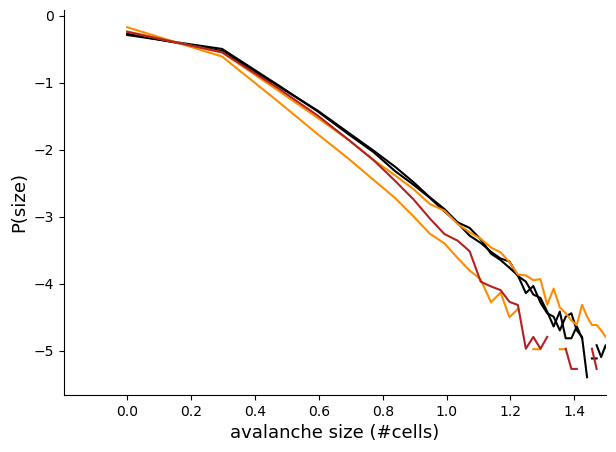

In [54]:
#PTZ02

import matplotlib

choose = 1
bins= 10000

plotlist = wt_avlist, het_avlist, hom_avlist
fig, axarr = plt.subplots(figsize = (7,5))
sns.reset_orig()
colors = ['k', 'darkorange', 'firebrick']

binvec = []
for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):
        binvec = np.append(binvec, np.load(plotlist[i][e])[choose][1:])
mini = np.min(binvec)
maxi = np.max(binvec)


for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):

        avdistcut = np.load(plotlist[i][e])[choose][1:]
        binned=np.linspace(mini,maxi, bins)
        hist = np.histogram(avdistcut, bins = binned)
        xaxis = np.log10(hist[1][:-1])
        yaxis = np.log10(hist[0]/np.sum(hist[0]))
        axarr.plot(xaxis[:len(xaxis)-1], yaxis[:len(xaxis)-1], '-', linewidth = 1.5, markersize = 1, alpha = 1, c = colors[i])
axarr.set_ylabel('P(size)', size = '13')
axarr.set_xlabel('avalanche size (#cells)', size = '13')
axarr.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
axarr.spines['top'].set_visible(False)
axarr.spines['right'].set_visible(False)
plt.xlim(right = 1.5)  
plt.show()


In [4]:
experiment = 'BLNLIGHTPTZ-FOXG1'
savepath = Fdrop + 'Project/' + experiment + os.sep 
os.chdir(Fdrop + 'Project/' + experiment)
het_avlist = sorted(glob.glob('*1+-*BLNLIGHT*av*'))
hom_avlist =  sorted(glob.glob('*1--*BLNLIGHT*av*'))
wt_avlist = sorted(glob.glob('*1++*BLNLIGHT*av*'))
wt_avlist, het_avlist, hom_avlist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy'],
 ['BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy'],
 ['BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_BLNLIGHT_run-01_av.npy'])

In [5]:
experiment = 'BLNLIGHTPTZ-FOXG1'
os.chdir(Fdrop + 'Project/' + experiment)
avlist = sorted(glob.glob('*PTZ02*av*'))
pkglist = sorted(glob.glob('*PTZ02*pkg*'))
avlist, pkglist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_PTZ02_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_av.npy',
  'BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_PTZ02_run-01_av.npy'],
 ['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_pkg.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_pkg.npy',
  'BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_PTZ02_run-01_pkg.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_pkg.npy',
  'BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_PTZ02_run-01_pkg.npy'])

In [ ]:
#BR
for i in range(len(avlist)):
    name = avlist[i][:avlist[i].find('run')+7]
    br = crfn.branch(np.load(pkglist[i]),np.load(avlist[i]))
    np.save(savepath + name + str(size) + '-branch.npy', br)
    print('Done ' + str(i))

doing time step 0 of 9828
doing time step 983 of 9828
doing time step 1966 of 9828
doing time step 2949 of 9828
doing time step 3932 of 9828
doing time step 4915 of 9828
doing time step 5898 of 9828
doing time step 6881 of 9828
doing time step 7864 of 9828
doing time step 8847 of 9828


# Functional connectivity

In [6]:
experiment = 'BLNLIGHTPTZ-FOXG1'
savepath = Fdrop + 'Project/' + experiment + os.sep 
os.chdir(Fdrop + 'Project/' + experiment)
het_tlist = sorted(glob.glob('*1+-*BLNLIGHT*realtrace*'))
hom_tlist =  sorted(glob.glob('*1--*BLNLIGHT*realtrace*'))
wt_tlist = sorted(glob.glob('*1++*BLNLIGHT*realtrace*'))
het_clist = sorted(glob.glob('*1+-*BLNLIGHT*realcoord*'))
hom_clist =  sorted(glob.glob('*1--*BLNLIGHT*realcoord*'))
wt_clist = sorted(glob.glob('*1++*BLNLIGHT*realcoord*'))
wt_tlist, het_tlist, hom_tlist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_realtrace.npy'],
 ['BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realtrace.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_realtrace.npy'],
 ['BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realtrace.npy'])

In [12]:
experiment = 'BLNLIGHTPTZ-FOXG1'
savepath = Fdrop + 'Project/' + experiment + os.sep 
os.chdir(Fdrop + 'Project/' + experiment)
het_fclist = sorted(glob.glob('*1+-*BLNLIGHT*corr*'))
hom_fclist =  sorted(glob.glob('*1--*BLNLIGHT*corr*'))
wt_fclist = sorted(glob.glob('*1++*BLNLIGHT*corr*'))
wt_fclist, het_fclist, hom_fclist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_corrdist.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_corrdist.npy'],
 ['BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_BLNLIGHT_run-01_corrdist.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_corrdist.npy'],
 ['BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_BLNLIGHT_run-01_corrdist.npy'])

In [7]:
wt_clist, het_clist, hom_clist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy'],
 ['BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_BLNLIGHT_run-01_realcoord.npy'])

In [29]:
#FCD
from sklearn.metrics.pairwise import euclidean_distances
trace_list = wt_tlist
coord_list = wt_clist
ans_list = list(range(len(trace_list)))

for i in range(len(trace_list)):
    trace = np.load(trace_list[i])
    corr = np.corrcoef(trace)
    dist = euclidean_distances(np.load(coord_list[i]))
    corrdistbin = crfn.corrdis_bin(corr, dist, 50)
    name = trace_list[i][:trace_list[i].find('run') + 7]
    #np.save(savepath + name + 'corrdist.npy', corrdistbin)

KeyboardInterrupt: 

In [28]:
data = np.load(het_fclist[0])
data

array([[8.70618835e+01, 1.69486502e+02, 2.21288306e+02, 2.63408650e+02,
        3.00280614e+02, 3.33988918e+02, 3.65892159e+02, 3.97345397e+02,
        4.30335858e+02, 0.00000000e+00],
       [5.21765788e-02, 4.49929363e-02, 4.14845901e-02, 3.96221258e-02,
        3.91926612e-02, 3.92907274e-02, 3.82493914e-02, 3.57660810e-02,
        3.10545556e-02, 0.00000000e+00]])

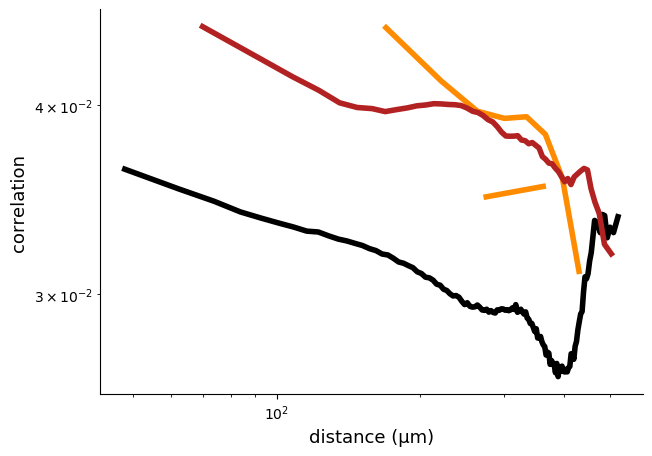

In [30]:
import matplotlib
import powerlaw
from scipy import stats

#BLNLIGHT
plotlist = wt_fclist, het_fclist, hom_fclist
fig, axarr = plt.subplots(figsize = (7,5))
sns.reset_orig()
colors = ['k', 'darkorange', 'firebrick']


for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):
        data = np.load(plotlist[i][e])
        xaxis = data[0]
        yaxis = data[1]
        axarr.plot(xaxis[1:len(xaxis)-1], yaxis[1:len(xaxis)-1], '-', linewidth = 4, markersize = 1, alpha = 1, color = colors[i])

axarr.set_xscale('log')
axarr.set_yscale('log')
axarr.set_xlabel('distance (μm)', size = '13')
#axarr.set_xticklabels(['100', '100', '100', '100'])
axarr.set_ylabel('correlation', size = '13')
axarr.spines['top'].set_visible(False)
axarr.spines['right'].set_visible(False)

plt.show()

# Eigenspectrum

In [3]:
experiment = 'BLNLIGHTPTZ-FOXG1'
savepath = Fdrop + 'Project/' + experiment + os.sep 
os.chdir(Fdrop + 'Project/' + experiment)
het_tlist = sorted(glob.glob('*1+-*PTZ02*realtrace*'))
hom_tlist =  sorted(glob.glob('*1--*PTZ02*realtrace*'))
wt_tlist = sorted(glob.glob('*1++*PTZ02*realtrace*'))
wt_tlist, het_tlist, hom_tlist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_realtrace.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_realtrace.npy'],
 ['BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_PTZ02_run-01_realtrace.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_realtrace.npy'],
 ['BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_PTZ02_run-01_realtrace.npy'])

In [11]:
experiment = 'BLNLIGHTPTZ-FOXG1'
savepath = Fdrop + 'Project/' + experiment + os.sep 
os.chdir(Fdrop + 'Project/' + experiment)
het_vlist = sorted(glob.glob('*1+-*PTZ02*eigvar*'))
hom_vlist =  sorted(glob.glob('*1--*PTZ02*eigvar*'))
wt_vlist = sorted(glob.glob('*1++*PTZ02*eigvar*'))
wt_vlist, het_vlist, hom_vlist

(['BLNLIGHTPTZ-FOXG1++-01_2photon_sess-01-6dpf_PTZ02_run-01_eigvar.npy',
  'BLNLIGHTPTZ-FOXG1++-02_2photon_sess-01-6dpf_PTZ02_run-01_eigvar.npy'],
 ['BLNLIGHTPTZ-FOXG1+--01_2photon_sess-01-6dpf_PTZ02_run-01_eigvar.npy',
  'BLNLIGHTPTZ-FOXG1+--02_2photon_sess-01-6dpf_PTZ02_run-01_eigvar.npy'],
 ['BLNLIGHTPTZ-FOXG1---01_2photon_sess-01-6dpf_PTZ02_run-01_eigvar.npy'])

In [ ]:
het_tlist = sorted(glob.glob('*1+-*BLNLIGHT*realtrace*'))
hom_tlist =  sorted(glob.glob('*1--*BLNLIGHT*realtrace*'))
wt_tlist = sorted(glob.glob('*1++*BLNLIGHT*realtrace*'))
wt_tlist, het_tlist, hom_tlist

In [79]:
list_list = wt_tlist, het_tlist, hom_tlist
for i in range(len(list_list)):
    for e in range(len(list_list[i])):
        print(np.load(list_list[i][e]).shape)

(14508, 11521)
(9775, 11521)
(7407, 11466)
(9893, 11521)
(7669, 11466)


In [ ]:
from sklearn import decomposition
data_list = wt_tlist
comp = 7000
for i in range(len(data_list)):
    data = np.load(data_list[i])
    pca = decomposition.PCA(comp)
    fit = pca.fit(data)
    var = fit.explained_variance_ratio_
    name = data_list[i][:data_list[i].find('run') + 7]
    np.save(savepath + name + 'eigvar.npy', var)

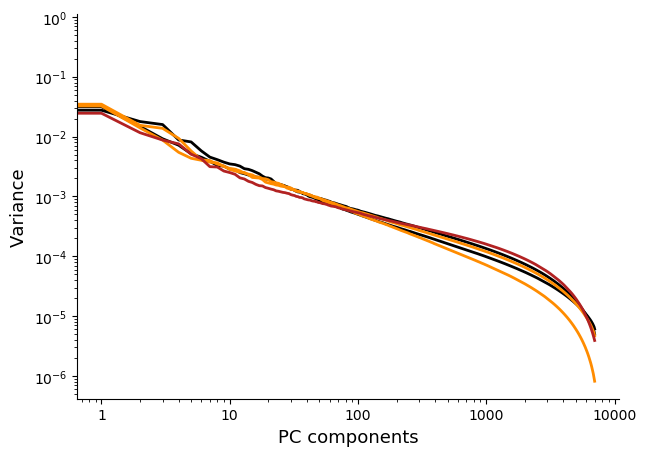

In [10]:
#BLNLIGHT
import matplotlib
import powerlaw
from scipy import stats
    
#BLNLIGHT
plotlist = wt_vlist, het_vlist, hom_vlist
fig, axarr = plt.subplots(figsize = (7,5))
sns.reset_orig()
colors = ['k', 'darkorange', 'firebrick']

for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):
        data = np.load(plotlist[i][e])
        xaxis = np.linspace(0,np.shape(data)[0], num = np.shape(data)[0]+1)
        yaxis = data
        axarr.plot(xaxis[:len(xaxis)-1], yaxis[:len(xaxis)-1], '-', linewidth = 2, markersize = 1, alpha = 1, color = colors[i])
axarr.set_xscale('log')
axarr.set_yscale('log')
axarr.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
axarr.set_ylabel('Variance', size = '13')
axarr.set_xlabel('PC components', size = '13')
axarr.spines['top'].set_visible(False)
axarr.spines['right'].set_visible(False)
plt.show()
    

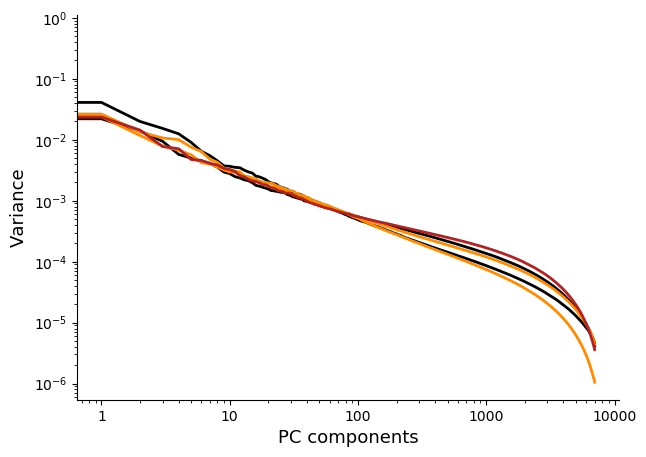

In [12]:
#PTZ02
import matplotlib
import powerlaw
from scipy import stats
    
#BLNLIGHT
plotlist = wt_vlist, het_vlist, hom_vlist
fig, axarr = plt.subplots(figsize = (7,5))
sns.reset_orig()
colors = ['k', 'darkorange', 'firebrick']

for i in range(len(plotlist)):
    for e in range(len(plotlist[i])):
        data = np.load(plotlist[i][e])
        xaxis = np.linspace(0,np.shape(data)[0], num = np.shape(data)[0]+1)
        yaxis = data
        axarr.plot(xaxis[:len(xaxis)-1], yaxis[:len(xaxis)-1], '-', linewidth = 2, markersize = 1, alpha = 1, color = colors[i])
axarr.set_xscale('log')
axarr.set_yscale('log')
axarr.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
axarr.set_ylabel('Variance', size = '13')
axarr.set_xlabel('PC components', size = '13')
axarr.spines['top'].set_visible(False)
axarr.spines['right'].set_visible(False)
plt.show()
    

# Regional measures

In [ ]:
name = coordlist[i][:coordlist[i].find('run')+7]

In [3]:
experiment = 'BLNLIGHTSTIM-THAP12'
os.chdir(Fdrop + 'Project/' + experiment)
wt6_list = sorted(glob.glob('*6dpf*WT*.csv'))
wt7_list = sorted(glob.glob('*7dpf*WT*.csv'))
mu6_list = sorted(glob.glob('*6dpf*THAP12*.csv'))
mu7_list = sorted(glob.glob('*7dpf*THAP12*.csv'))

In [4]:
wt6_list, wt7_list, mu6_list, mu7_list

(['F02_6dpf_WT.csv',
  'F04_6dpf_WT.csv',
  'F05_6dpf_WT.csv',
  'F06_6dpf_WT.csv',
  'F07_6dpf_WT.csv'],
 ['F02_7dpf_WT.csv', 'F06_7dpf_WT.csv', 'F08_7dpf_WT.csv', 'F10_7dpf_WT.csv'],
 ['F04_6dpf_THAP12.csv',
  'F05_6dpf_THAP12.csv',
  'F06_6dpf_THAP12.csv',
  'F07_6dpf_THAP12.csv',
  'F08_6dpf_THAP12.csv',
  'F09_6dpf_THAP12.csv'],
 ['F04_7dpf_THAP12.csv',
  'F05_7dpf_THAP12.csv',
  'F06_7dpf_THAP12.csv',
  'F10_7dpf_THAP12.csv',
  'F11_7dpf_THAP12.csv'])

In [166]:
import pickle

namelist = ['left_tectum', 'right_tectum', 'left_cer', 'right_cer', 'left_hind', 'right_hind']
listlist = [mu7_list]
for i in range(len(listlist)):
    for e in range(len(listlist[i])):
        df = pd.read_csv(listlist[i][e])
        dic = {}
        for x in range(len(namelist)):
            curr = df['Mean(' + namelist[x] + ')']
            dic[namelist[x]] = np.asarray(curr)
            dic_pd = pd.DataFrame(dic)
        # This saves your dict
        with open(listlist[i][e][:listlist[i][e].find('csv') - 1] + '.p', 'bw') as f:
            pickle.dump(dic_pd, f)
        

In [8]:
import pickle

experiment = 'BLNLIGHTSTIM-THAP12'
os.chdir(Fdrop + 'Project/' + experiment)
wt6 = sorted(glob.glob('*6dpf*WT*p*'))
wt7 = sorted(glob.glob('*7dpf*WT*p*'))
mu6 = sorted(glob.glob('*6dpf*THAP12*p*'))[:5]
mu7 = sorted(glob.glob('*7dpf*THAP12*p*'))
wt6, wt7, mu6, mu7

(['F02_6dpf_WT.p',
  'F04_6dpf_WT.p',
  'F05_6dpf_WT.p',
  'F06_6dpf_WT.p',
  'F07_6dpf_WT.p'],
 ['F02_7dpf_WT.p', 'F06_7dpf_WT.p', 'F08_7dpf_WT.p', 'F10_7dpf_WT.p'],
 ['F04_6dpf_THAP12.p',
  'F05_6dpf_THAP12.p',
  'F06_6dpf_THAP12.p',
  'F07_6dpf_THAP12.p',
  'F08_6dpf_THAP12.p'],
 ['F04_7dpf_THAP12.p',
  'F05_7dpf_THAP12.p',
  'F06_7dpf_THAP12.p',
  'F10_7dpf_THAP12.p',
  'F11_7dpf_THAP12.p'])

In [4]:
name_list = ['left_tectum', 'right_tectum', 'left_cer', 'right_cer', 'left_hind', 'right_hind']
subname_list = ['tectum', 'cer', 'hind']
name_list, subname_list

(['left_tectum',
  'right_tectum',
  'left_cer',
  'right_cer',
  'left_hind',
  'right_hind'],
 ['tectum', 'cer', 'hind'])

In [5]:
## INFO
## 2100s total = 62979 frames
## Baseline = 53982 frames (30 minutes)
## Light period = 1499 frames (50 s)
## Light paradigm = 5 repeats, 4 s duration, 6s stimuli between
light_on = 120
light_off = 180
light_start = 53982
light_end = 55302
l1_start = light_start
l1_end = light_start + light_on
l2_start = l1_end + light_off
l2_end = l2_start + light_on
l3_start = l2_end + light_off
l3_end = l3_start + light_on
l4_start = l3_end + light_off
l4_end = l4_start + light_on
l5_start = l4_end + light_off
l5_end = l5_start + light_on
on_list = [l1_start, l2_start, l3_start, l4_start, l5_start]
off_list = [l1_end, l2_end, l3_end, l4_end, l5_end]
on_list, off_list

([53982, 54282, 54582, 54882, 55182], [54102, 54402, 54702, 55002, 55302])

# Define functions

In [6]:
#Functions


def amp_n(input_list, name_list):
    output_list = list(range(len(input_list)))
    for i in range(len(input_list)):
        amp_list = list(range(len(name_list)))
        for e in range(len(name_list)):
            amp_list[e] = np.sum(input_list[i][e])/len(input_list[i][e])
        output_list[i] = amp_list
    return(output_list)

def amp(input_list, name_list):
    output_list = list(range(len(input_list)))
    for i in range(len(input_list)):
        amp_list = list(range(len(name_list)))
        for e in range(len(name_list)):
            amp_list[e] = np.sum(input_list[i][e])
        output_list[i] = amp_list
    return(output_list)


def corr_raw(input_list, name_list):
    output_list = list(range(len(input_list)))
    for i in range(len(input_list)):
        output_list[i] = np.corrcoef(input_list[i])
    return(output_list)

def reg_append(data_list):

    list1, list2, list3, list4, list5, list6 = [],[],[],[],[],[]
    listlist = list1, list2, list3, list4, list5, list6 
    for e in range(len(data_list)):
        for i in range(len(listlist)):
            if i == 0:
                list1 = np.append(list1,data_list[e][i])
            if i == 1:
                list2 = np.append(list2,data_list[e][i])
            if i == 2:
                list3 = np.append(list3,data_list[e][i])
            if i == 3:
                list4 = np.append(list4,data_list[e][i])
            if i == 4:
                list5 = np.append(list5,data_list[e][i])
            if i == 5:
                list6 = np.append(list6,data_list[e][i])
    return(list1, list2, list3, list4, list5, list6)



def deltaff(trace, percentile):
    newtrace = trace
    baseline = np.quantile(trace, percentile, axis= 0)
    newtrace[np.where(trace <= baseline)] = 0 #set all values below baseline to 0
    pos_index = np.where(trace > baseline) #indeces of values above baseline
    newtrace[pos_index] = (trace[pos_index] - baseline)/baseline
    return(newtrace)


def corr_list(input_list, name_list, start, end, meanreg):
    if meanreg == 'True':
        output_list = list(range(len(input_list)))
        for i in range(len(input_list)):
            dff_list = list(range(len(namelist)//2))
            with open(input_list[i], 'br') as f:
                curr = pickle.load(f)
                count=0
                for e in range(len(name_list)//2):
                    trace1 = np.array(curr[namelist[count]])[start:end]
                    trace2 = np.array(curr[namelist[count+1]])[start:end]
                    count+=2
                    stack = np.vstack((trace1 , trace2))
                    mean_trace = np.mean(stack, axis = 0)
                    dff = deltaff(mean_trace, 0.05)
                    dff_list[e] = dff
                output_list[i] = np.corrcoef(dff_list)
    else:
    
        output_list = list(range(len(input_list)))
        for i in range(len(input_list)):
            dff_list = list(range(len(namelist)))
            with open(input_list[i], 'br') as f:
                curr = pickle.load(f)
                for e in range(len(name_list)):
                    trace = np.array(curr[namelist[e]])[start:end]
                    dff = deltaff(trace, 0.05)
                    dff_list[e] = dff
                output_list[i] = np.corrcoef(dff_list)
    return(output_list)

def mean_mat(input_list, name_list):
    mean_mat = np.zeros((len(name_list), len(name_list)))
    for i in range(len(input_list)):
        curr = input_list[i]
        mean_mat = curr + mean_mat
    mean_mat = mean_mat/len(input_list)
    return(mean_mat)


import pickle
from scipy.ndimage import gaussian_filter1d



def plot_light(choose):
    output_list = list(range(len(choose)))
    for i in range(len(choose)):
        with open(choose[i], 'br') as f:
            curr = pickle.load(f)
            fig, axarr = plt.subplots(figsize = (6,2))

            reg_list = list(range(len(name_list)))
            on_shift = (np.array(on_list) - light_start)
            off_shift = (np.array(off_list) - light_start)
            for e in range(len(name_list)):
                trace = np.array(curr[name_list[e]])[light_start:light_end]
                dff = deltaff(trace, 0.05)
                data = gaussian_filter1d(dff, 3, axis = 0) 
                sum_data = np.zeros((120))
                for x in range(len(on_shift)):
                    sum_data += data[on_shift[x]:off_shift[x]]
                mean_data = sum_data/(len(on_shift))
                reg_list[e] = mean_data
                plt.plot(mean_data, label = name_list[e])
                for x in [(np.array(on_list) - light_start)[0]]: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
                for x in [(np.array(off_list) - light_start)[0]]: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
            output_list[i] = reg_list
            #plt.legend()
            plt.show()
    return(output_list)

def Zscore(null_data, alt_data):
    euc_mat_null = np.zeros((len(null_data), len(null_data)))
    comp_euc_mat = np.zeros((len(alt_data), len(null_data)))

    for i in range(len(null_data)):
        for e in range(len(null_data)):
            euc_mat_null[i][e] = np.linalg.norm(null_data[i]-null_data[e])

    euc_nulldist = np.triu(euc_mat_null)[np.where(np.triu(euc_mat_null) !=0)]

    for i in range(len(alt_data)):
        for e in range(len(null_data)):
            comp_euc_mat[i][e] = np.linalg.norm(alt_data[i]-null_data[e])
    mean = np.mean(euc_mat_null)
    std = np.std(euc_mat_null)
    Z = (np.mean(comp_euc_mat) - mean) /std
    Z  
    return(Z, euc_nulldist, comp_euc_mat)
    

def find_events(choose, std):
    nevs_list = list(range(len(choose)))
    dur_list = list(range(len(choose)))
    spike_list = list(range(len(choose)))
    sub_list = list(range(len(choose)))

    for i in range(len(choose)):
        with open(choose[i], 'br') as f:
            curr = pickle.load(f)
            nevs_reg, dur_reg, spikes_reg, sub_reg = list(range(len(name_list))), list(range(len(name_list))), list(range(len(name_list))), list(range(len(name_list)))
            for e in range(len(name_list)):
                trace = np.array(curr[name_list[e]])
                dff = deltaff(trace, 0.05)
                data = gaussian_filter1d(dff, 3, axis = 0)
                thresh = np.mean(data) + np.std(data)*std
                spike_index = np.where(data > thresh)[0]
                n_evs = len([list(group) for group in mit.consecutive_groups(spike_index)])
                dur = len(spike_index)
                nevs_reg[e] = n_evs
                dur_reg[e] = dur
                spikes_reg[e] = spike_index
                sub_reg[e] = data[spike_index]
        nevs_list[i] = nevs_reg
        dur_list[i] = dur_reg
        spike_list[i] = spikes_reg
        sub_list[i] = sub_reg
    return(nevs_list, dur_list, spike_list, sub_list)

# Visualise data

F02_6dpf_WT.p


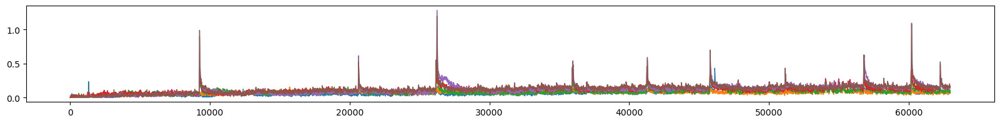

F04_6dpf_WT.p


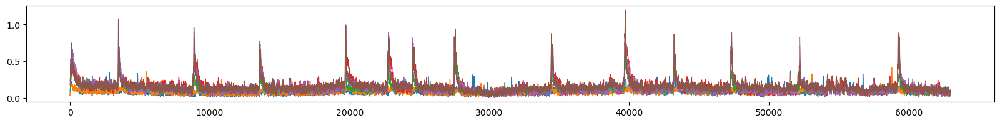

F05_6dpf_WT.p


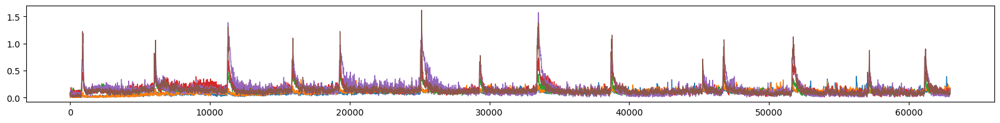

F06_6dpf_WT.p


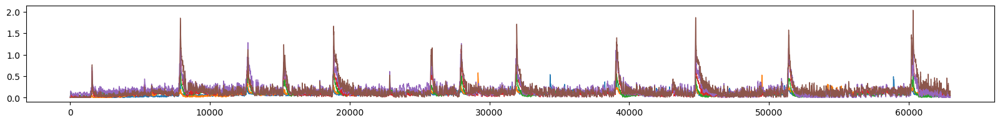

F07_6dpf_WT.p


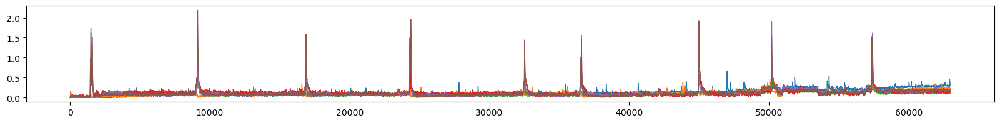

In [76]:
#### import pickle
from scipy.ndimage import gaussian_filter1d
import more_itertools as mit


for i in range(len(wt6)):
    print(wt6[i])
    with open(wt6[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))
        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0)
            thresh = np.mean(data) + np.std(data)*3
            n_evs = len([list(group) for group in mit.consecutive_groups(np.where(data > thresh)[0])])
            reg_list[e] = n_evs
            plt.plot(data, label = str(name_list[e]) + '  n =' + str(n_evs), linewidth = 1)
        #plt.legend()
        plt.show()

F04_6dpf_THAP12.p


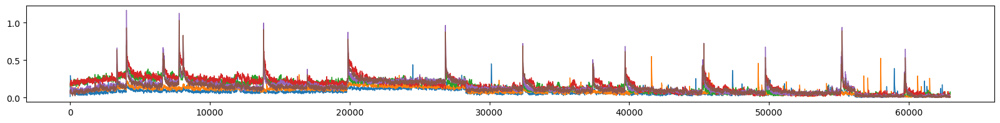

F05_6dpf_THAP12.p


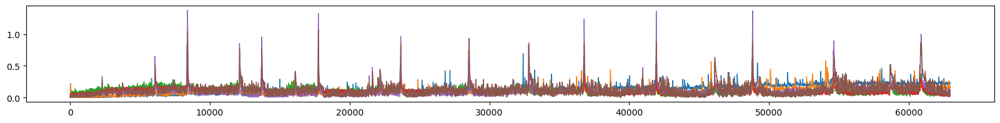

F06_6dpf_THAP12.p


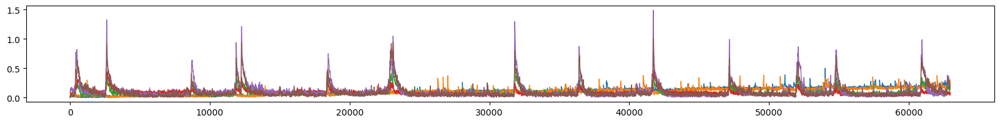

F07_6dpf_THAP12.p


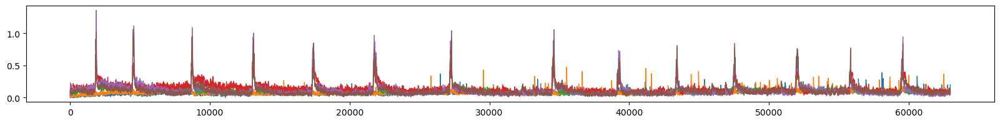

F08_6dpf_THAP12.p


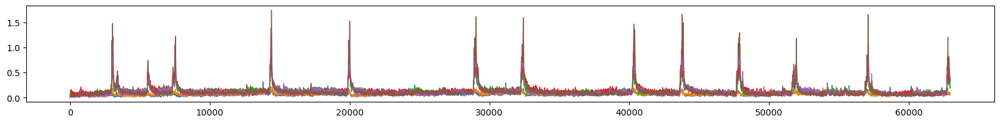

F09_6dpf_THAP12.p


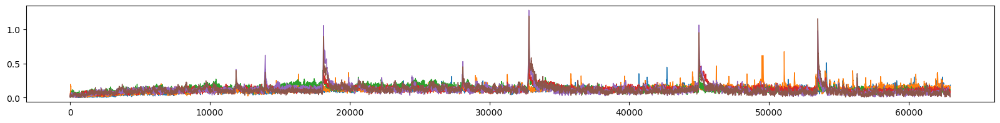

In [77]:
#### import pickle
from scipy.ndimage import gaussian_filter1d
import more_itertools as mit


for i in range(len(mu6)):
    print(mu6[i])
    with open(mu6[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))
        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0)
            thresh = np.mean(data) + np.std(data)*3
            n_evs = len([list(group) for group in mit.consecutive_groups(np.where(data > thresh)[0])])
            reg_list[e] = n_evs
            plt.plot(data, label = str(name_list[e]) + '  n =' + str(n_evs), linewidth = 1)
        #plt.legend()
        plt.show()

In [47]:
mu6

['F04_6dpf_THAP12.p',
 'F05_6dpf_THAP12.p',
 'F06_6dpf_THAP12.p',
 'F07_6dpf_THAP12.p',
 'F08_6dpf_THAP12.p',
 'F09_6dpf_THAP12.p']

In [ ]:
curr = 54000
real = 53982
n = 107

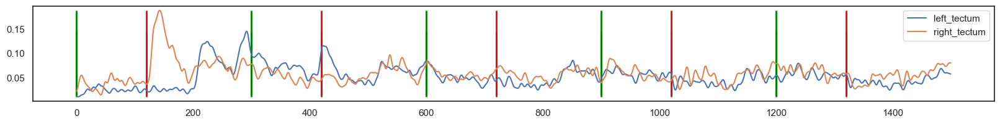

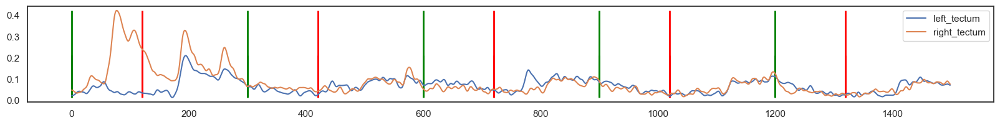

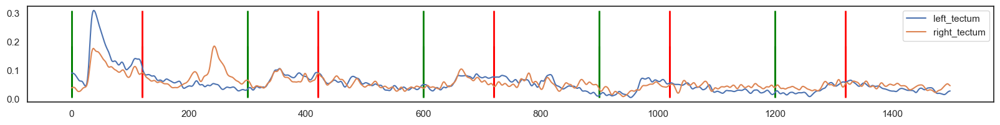

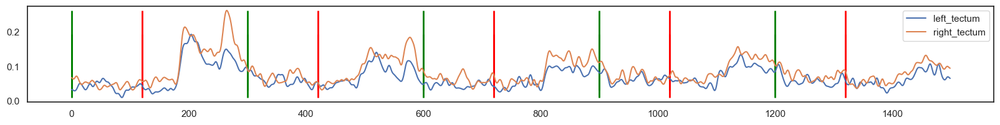

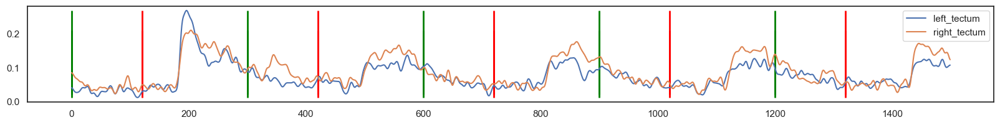

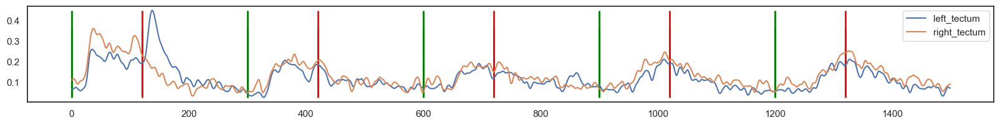

In [144]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = mu6
mu6_list = list(range(len(mu6)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(2))

        for e in range(2):
            trace = np.array(curr[name_list[e]])[light_start:light_end + 180]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
            for x in np.array(on_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
            for x in np.array(off_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
        mu6_list[i] = reg_list
        plt.legend()
        plt.show()

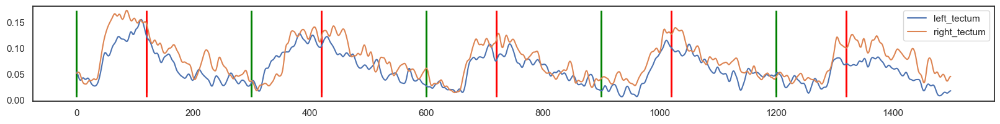

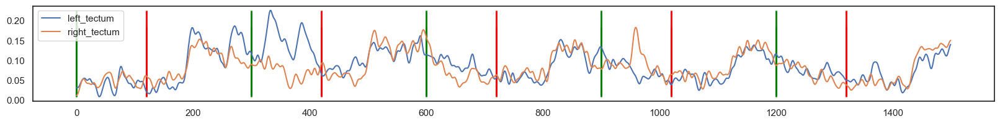

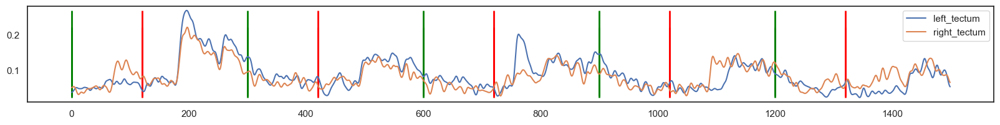

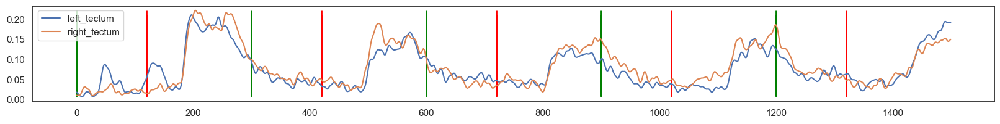

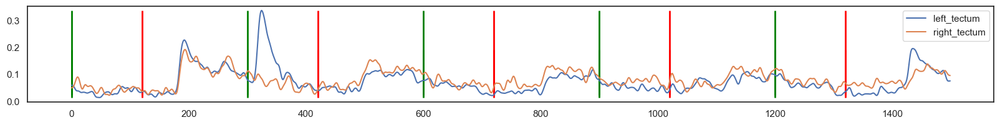

In [145]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = wt6
wt6_list = list(range(len(mu6)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(2))

        for e in range(2):
            trace = np.array(curr[name_list[e]])[light_start:light_end + 180]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
            for x in np.array(on_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
            for x in np.array(off_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
        wt6_list[i] = reg_list
        plt.legend()
        plt.show()

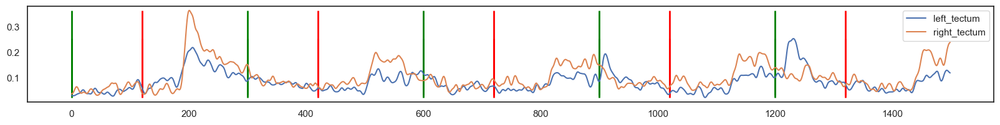

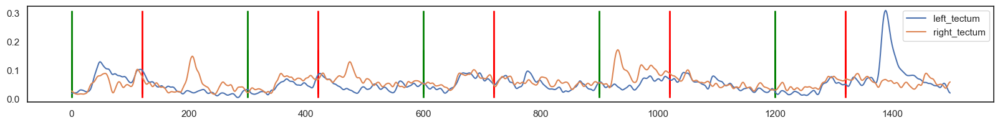

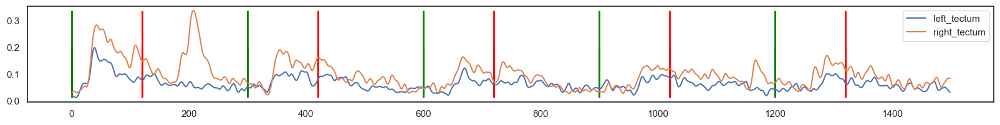

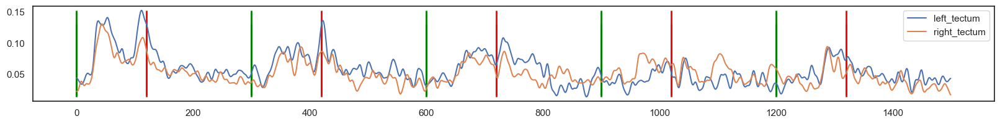

In [146]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = wt7
wt7_list = list(range(len(wt7)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(2))

        for e in range(2):
            trace = np.array(curr[name_list[e]])[light_start:light_end + 180]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
            for x in np.array(on_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
            for x in np.array(off_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
        wt7_list[i] = reg_list
        plt.legend()
        plt.show()

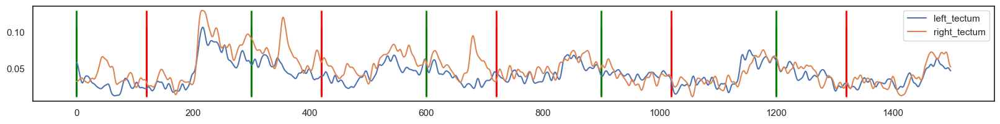

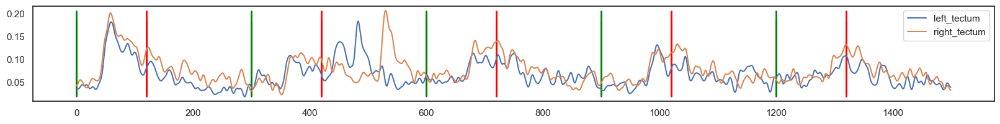

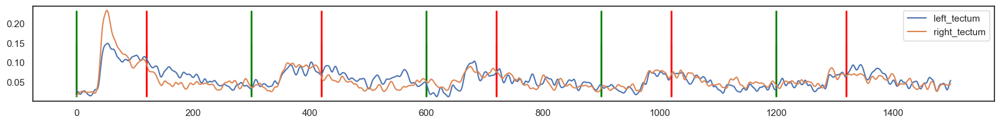

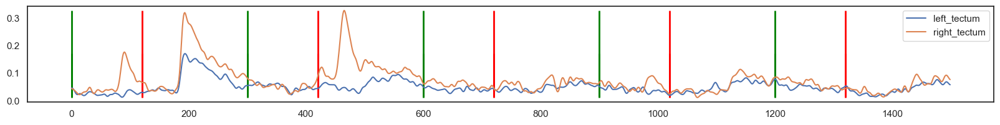

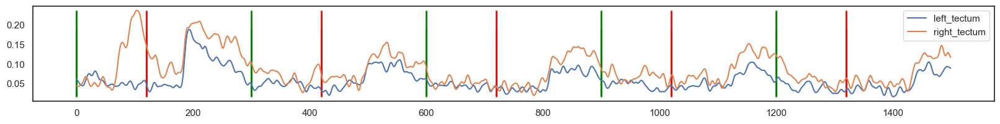

In [147]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = mu7
mu7_list = list(range(len(mu7)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(2))

        for e in range(2):
            trace = np.array(curr[name_list[e]])[light_start:light_end + 180]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
            for x in np.array(on_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
            for x in np.array(off_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
        mu7_list[i] = reg_list
        plt.legend()
        plt.show()

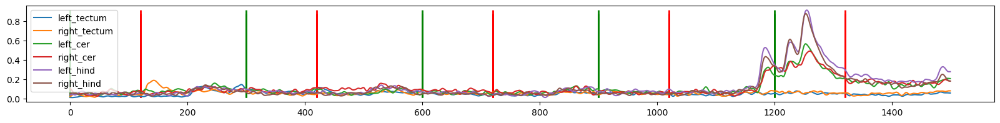

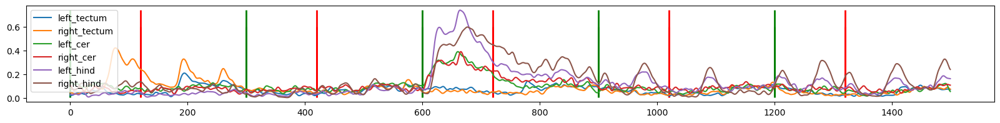

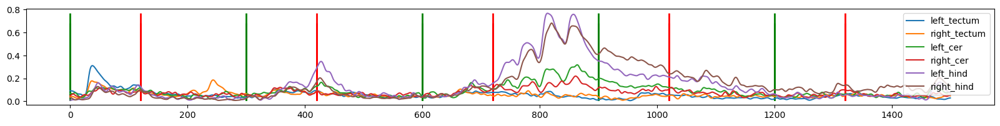

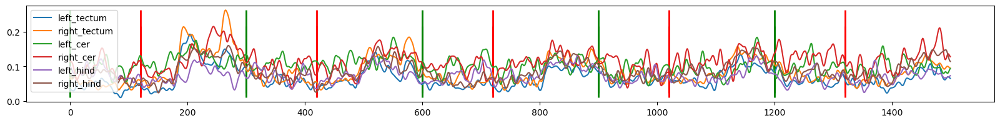

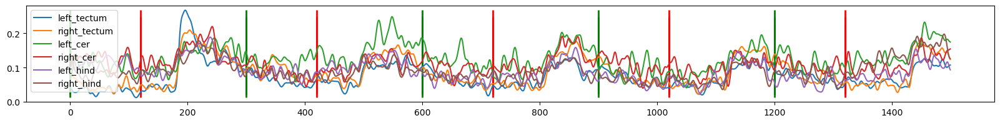

In [9]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = mu6
mu6_list = list(range(len(mu6)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))

        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])[light_start:light_end + 180]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
            for x in np.array(on_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
            for x in np.array(off_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
        mu6_list[i] = reg_list
        plt.legend()
        plt.show()

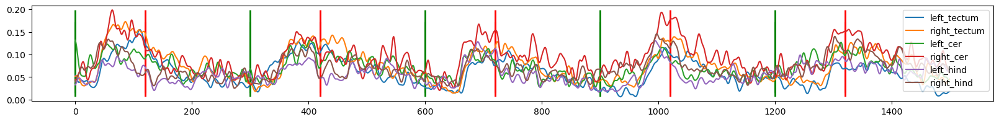

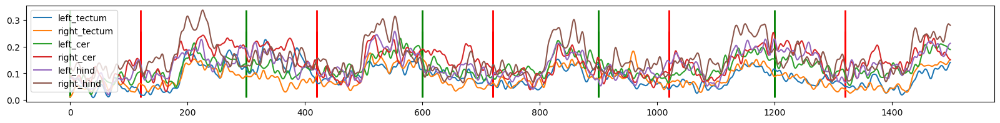

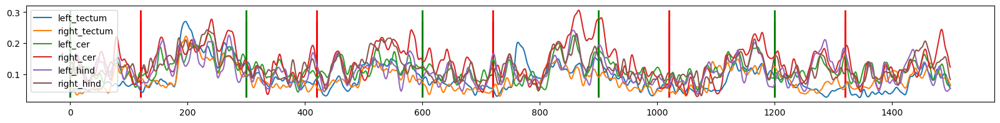

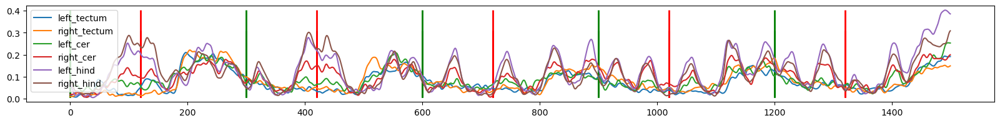

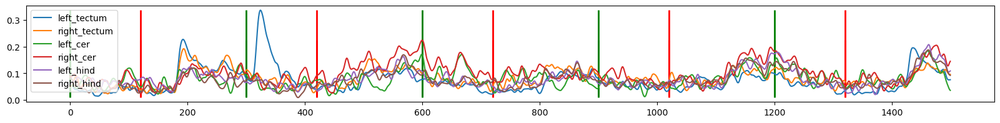

In [11]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = wt6
wt6_list = list(range(len(wt6)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))

        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])[light_start:light_end + 180]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
            for x in np.array(on_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
            for x in np.array(off_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
        wt6_list[i] = reg_list
        plt.legend()
        plt.show()

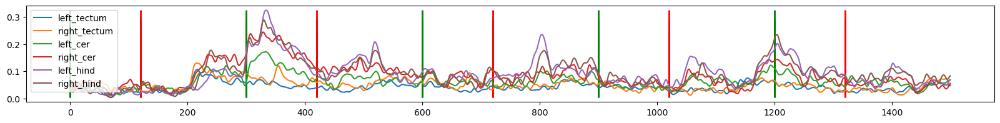

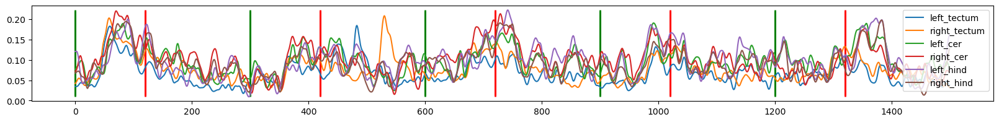

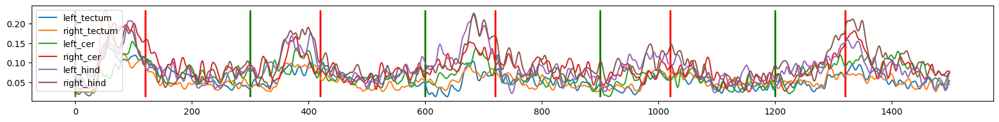

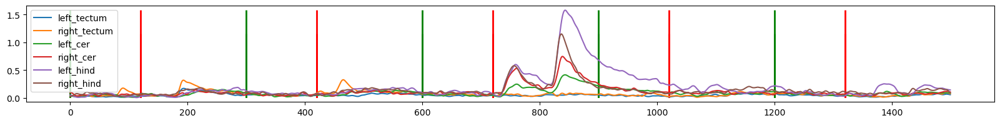

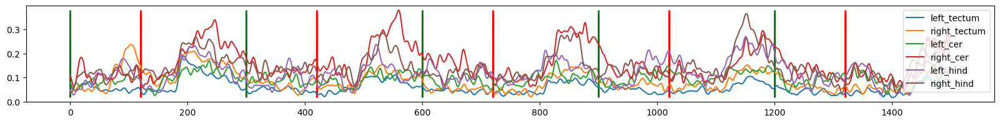

In [29]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = mu7
mu7_list = list(range(len(mu7)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))

        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])[light_start:light_end + 180]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
            for x in np.array(on_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
            for x in np.array(off_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
        mu7_list[i] = reg_list
        plt.legend()
        plt.show()

In [75]:
wt7

['F02_7dpf_WT.p', 'F06_7dpf_WT.p', 'F08_7dpf_WT.p', 'F10_7dpf_WT.p']

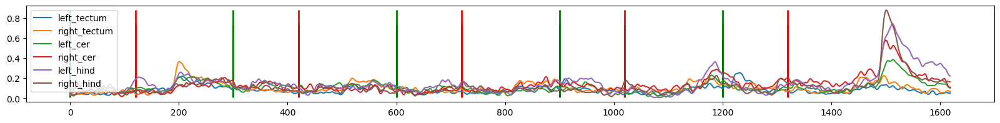

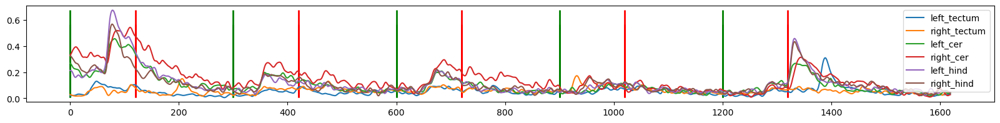

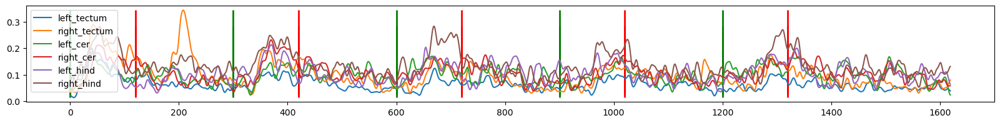

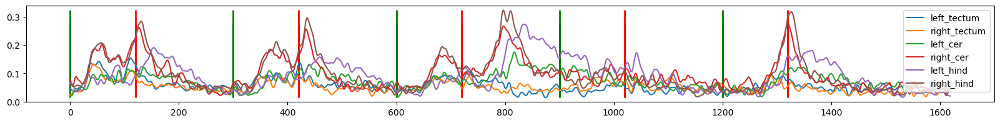

In [74]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = wt7
wt7_list = list(range(len(wt7)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))

        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])[light_start:light_end + 300]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
            for x in np.array(on_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'green', linewidth = 2)
            for x in np.array(off_list) - light_start: plt.vlines(x=x,  alpha = 1, ymin = np.min(data), ymax = np.max(data), color = 'red', linewidth = 2) 
        wt7_list[i] = reg_list
        plt.legend()
        plt.show()

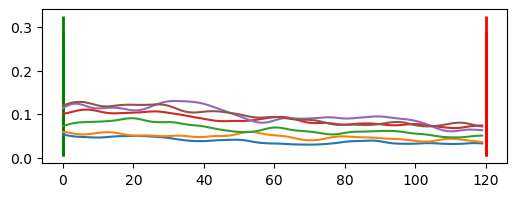

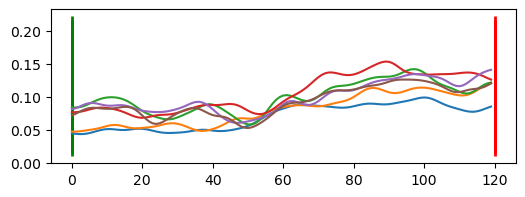

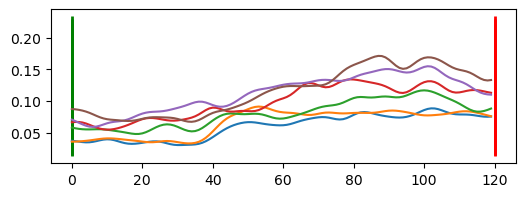

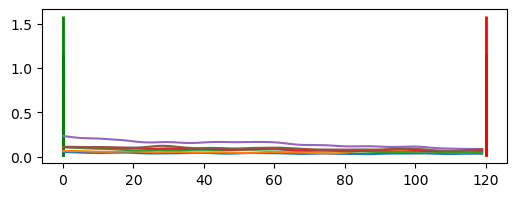

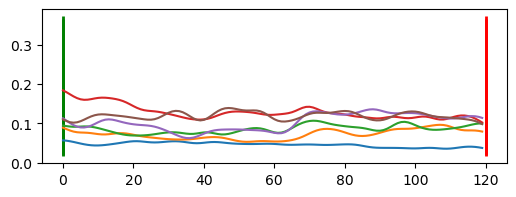

In [14]:
wt6_li = plot_light(mu7)

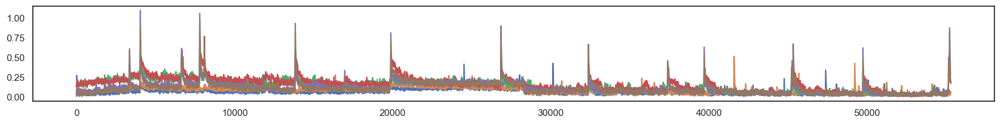

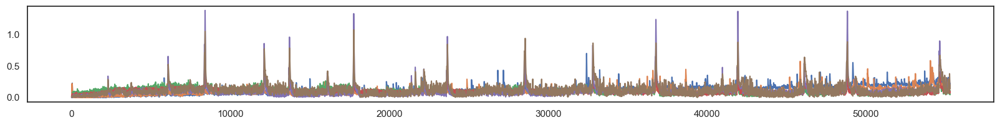

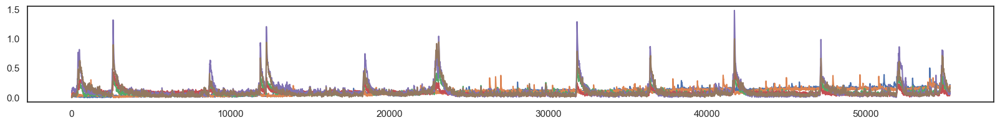

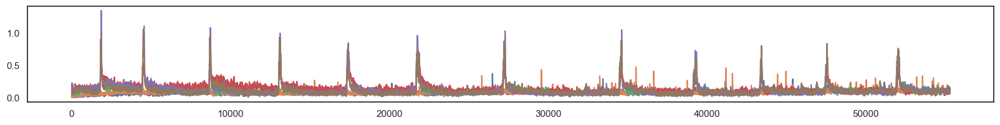

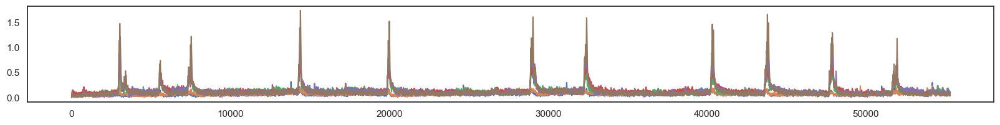

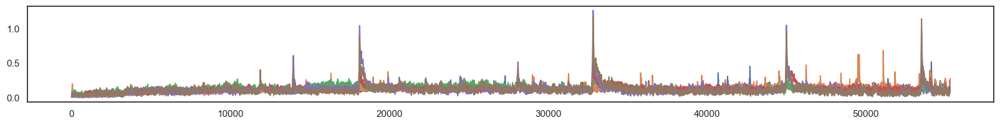

In [181]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = mu6
mu6_list = list(range(len(mu6)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))

        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])[:light_end]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
        mu6_list[i] = reg_list
        #plt.legend()
        plt.show()

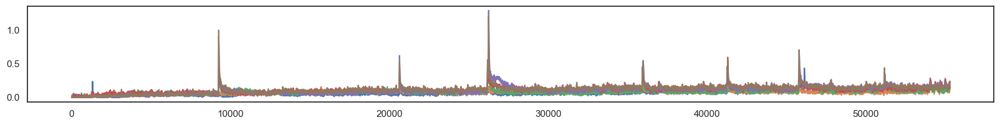

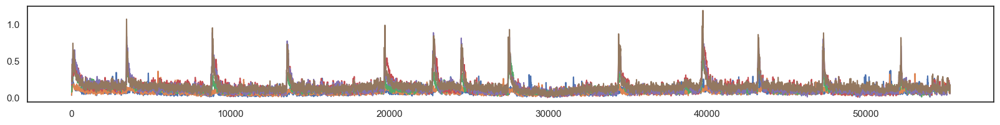

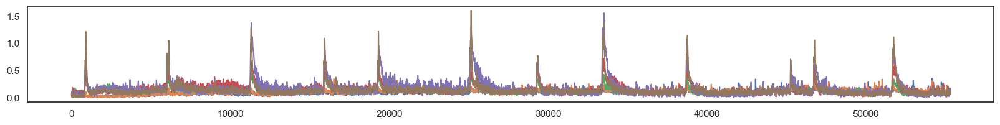

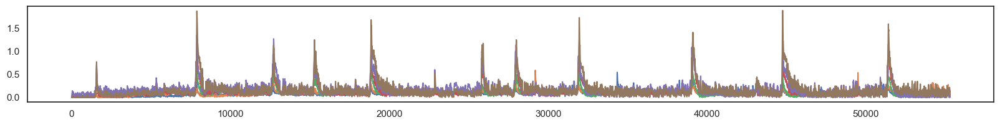

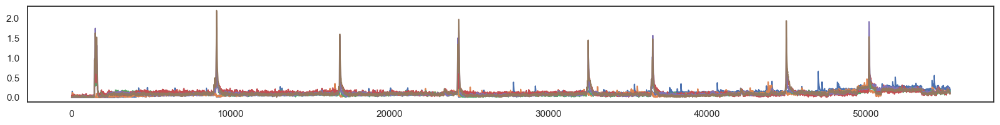

In [182]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = wt6
wt6_list = list(range(len(wt6)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))

        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])[:light_end]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
        wt6_list[i] = reg_list
        #plt.legend()
        plt.show()

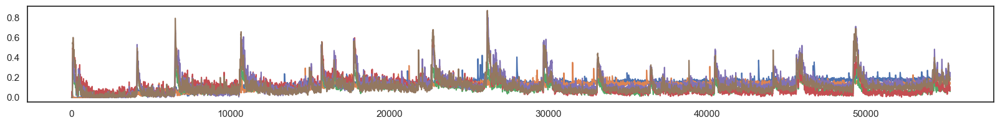

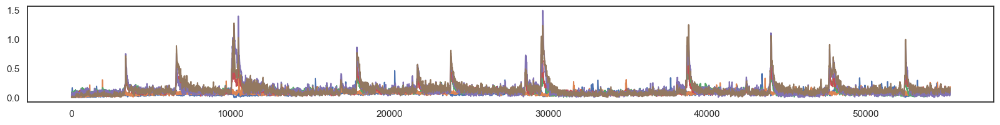

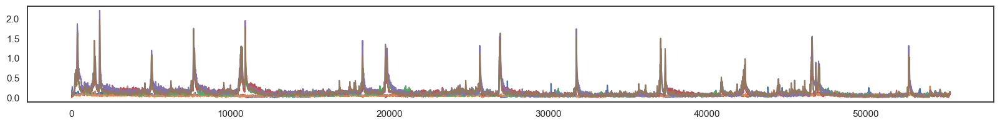

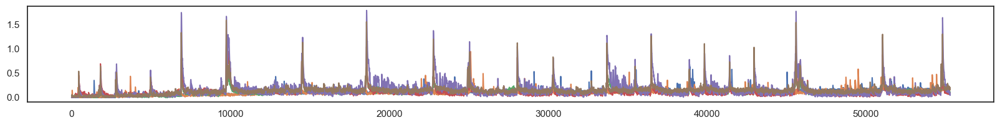

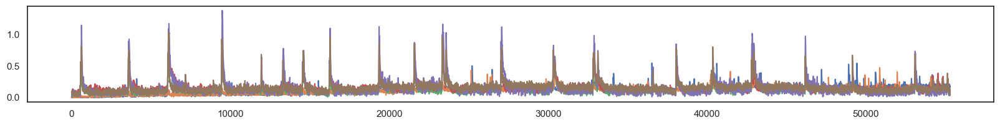

In [183]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = mu7
mu7_list = list(range(len(mu7)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))

        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])[:light_end]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
        mu7_list[i] = reg_list
        #plt.legend()
        plt.show()

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


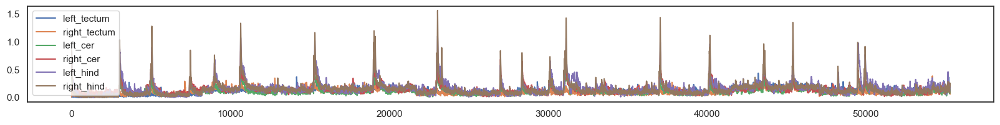

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


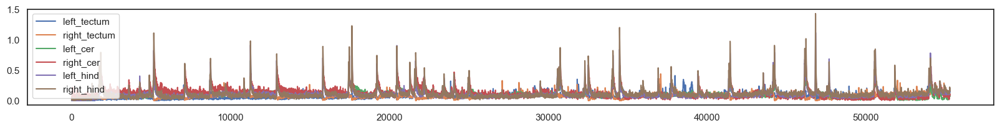

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


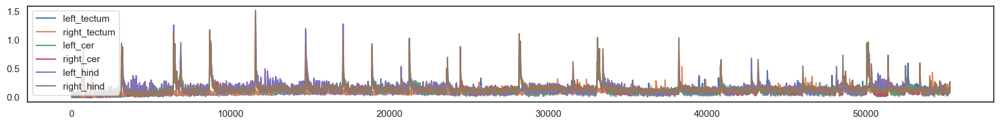

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


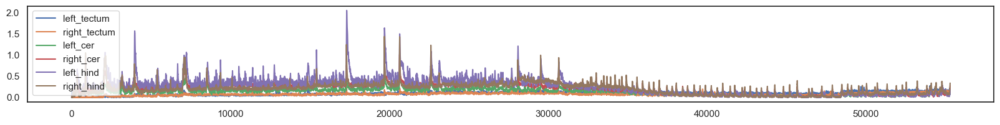

In [184]:
import pickle
from scipy.ndimage import gaussian_filter1d
choose = wt7
wt7_list = list(range(len(wt7)))
for i in range(len(choose)):
    with open(choose[i], 'br') as f:
        curr = pickle.load(f)
        fig, axarr = plt.subplots(figsize = (20,2))
        reg_list = list(range(len(name_list)))

        for e in range(len(name_list)):
            trace = np.array(curr[name_list[e]])[:light_end]
            
            dff = deltaff(trace, 0.05)
            data = gaussian_filter1d(dff, 3, axis = 0) 
            reg_list[e] = data
            plt.plot(data, label = name_list[e])
        wt7_list[i] = reg_list
        #plt.legend()
        plt.show()

# Spontaneous

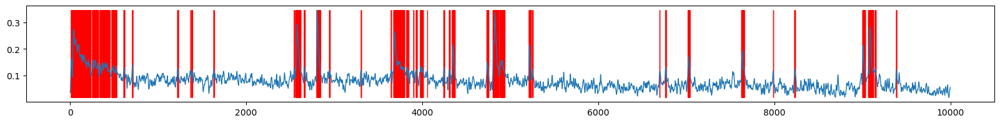

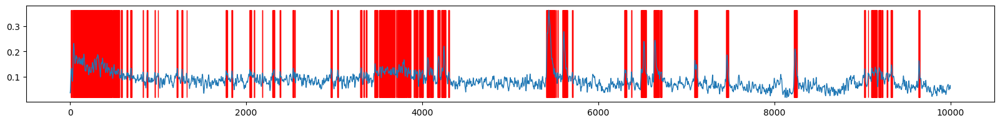

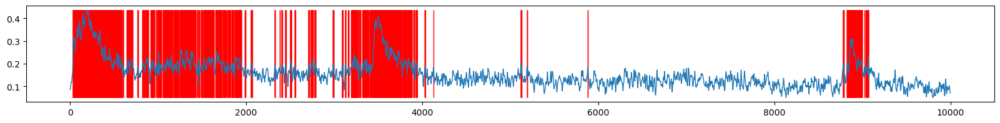

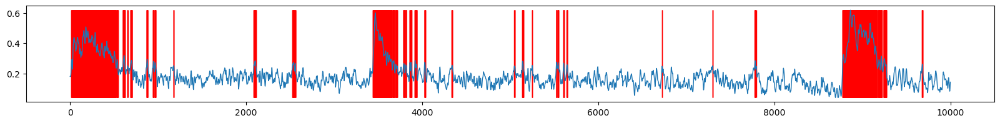

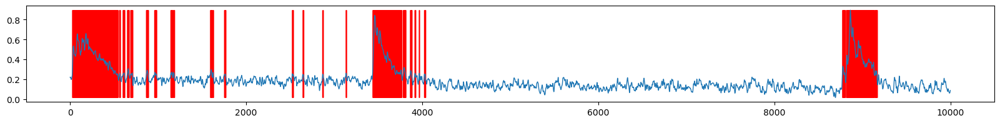

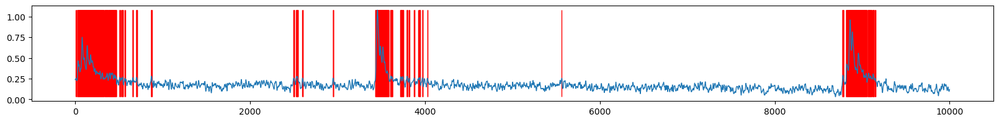

In [72]:
#Choose how many sds 
from scipy.ndimage import gaussian_filter1d
import more_itertools as mit

i = 1
with open(wt6[i], 'br') as f:
    curr = pickle.load(f)
    for e in range(len(name_list)):
        fig, axarr = plt.subplots(figsize = (20,2))
        trace = np.array(curr[name_list[e]])
        dff = deltaff(trace, 0.05)
        data = gaussian_filter1d(dff, 3, axis = 0)
        thresh = np.mean(data) + np.std(data)*1.5
        spike_index = np.where(data > thresh)[0]
        #n_evs = len([list(group) for group in mit.consecutive_groups(np.where(data > thresh)[0])])
        plot_data = data[:10000]
        plot_spike_index = np.where(plot_data > thresh)[0]
        plt.plot(plot_data, label = str(name_list[e]) + '  n =' + str(n_evs), linewidth = 1)
        for x in plot_spike_index: plt.vlines(x=x,  alpha = 1, ymin = np.min(plot_data), ymax = np.max(plot_data), color = 'red', linewidth = 1) 

        #plt.legend()
        plt.show()

In [18]:
#Spike duration, number
from scipy.ndimage import gaussian_filter1d
import more_itertools as mit

wt6_nev, wt6_dur, wt6_spike, wt6_sub = find_events(wt6,1.5)
wt7_nev, wt7_dur, wt7_spike, wt7_sub = find_events(wt7,1.5)
mu6_nev, mu6_dur, mu6_spike, mu6_sub = find_events(mu6,1.5)
mu7_nev, mu7_dur, mu7_spike, mu7_sub = find_events(mu7,1.5)

In [19]:
wt6_amp = amp_n(wt6_sub, name_list)
wt7_amp = amp_n(wt7_sub, name_list)
mu6_amp = amp_n(mu6_sub, name_list)
mu7_amp = amp_n(mu7_sub, name_list)
wt6_reg = reg_append(wt6_amp)
wt7_reg = reg_append(wt7_amp)
mu6_reg = reg_append(mu6_amp)
mu7_reg = reg_append(mu7_amp)

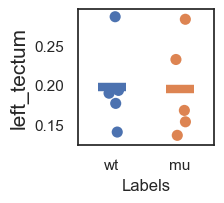

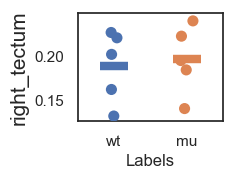

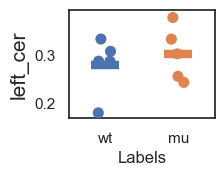

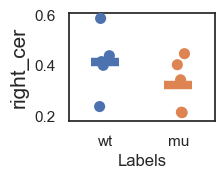

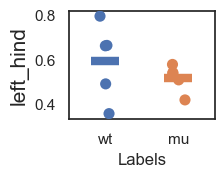

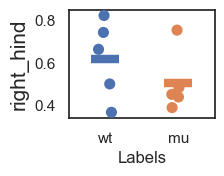

In [20]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
plt.figure(figsize=(6,6))
for o in range(len(name_list)):
    wtdata = wt6_reg[o]
    mudata = mu6_reg[o]
    nom_list = []

    for i in range(len(wtdata)):
        nom_list =  np.append(nom_list, 'wt')
    for i in range(len(mudata)):
        nom_list =  np.append(nom_list, 'mu')

    #DUR - KS
    auc_df = pd.DataFrame({"AUC": np.append(wtdata, mudata), "Labels":  nom_list})

    from matplotlib.collections import PathCollection
    sns.set(style="white")

    plt.subplot(3,3,i+1)
    ax = sns.pointplot(x="Labels", y="AUC", data = auc_df, hue = 'Labels', join=True, ci=0, scale=3, markers = '_')
    for artist in ax.lines:
        artist.set_zorder(10)
    for artist in ax.findobj(PathCollection):
        artist.set_zorder(11)
    ax = sns.stripplot(x="Labels", y="AUC", data=auc_df,  size = 8, jitter = True ,alpha = 1)
    #plt.gca().set_title('k = ' + str(k_vals[i]))
    #plt.gca().set_xlabel('r', size = '15')
    plt.gca().set_ylabel(name_list[o], size = '15')
    ax.legend_.remove()

    plt.show()


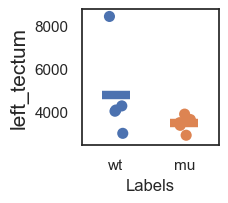

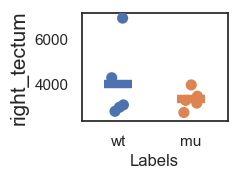

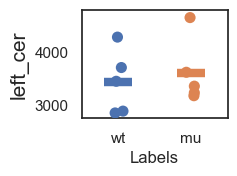

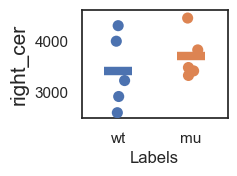

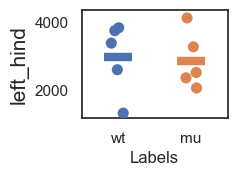

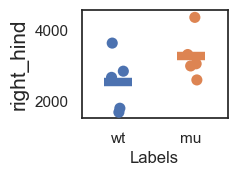

In [21]:
#Duration

plt.figure(figsize=(6,6))
for o in range(len(name_list)):
    wtdata = np.array(wt6_dur )   [:,o]
    mudata = np.array(mu6_dur )   [:,o]
    nom_list = []

    for i in range(len(wtdata)):
        nom_list =  np.append(nom_list, 'wt')
    for i in range(len(mudata)):
        nom_list =  np.append(nom_list, 'mu')

    #DUR - KS
    dur_df = pd.DataFrame({"dur": np.append(wtdata, mudata), "Labels":  nom_list})

    from matplotlib.collections import PathCollection
    sns.set(style="white")

    plt.subplot(3,3,i+1)
    ax = sns.pointplot(x="Labels", y="dur", data = dur_df, hue = 'Labels', join=True, ci=0, scale=3, markers = '_')
    for artist in ax.lines:
        artist.set_zorder(10)
    for artist in ax.findobj(PathCollection):
        artist.set_zorder(11)
    ax = sns.stripplot(x="Labels", y="dur", data=dur_df, size = 8, jitter = True ,alpha = 1)
    #plt.gca().set_title('k = ' + str(k_vals[i]))
    #plt.gca().set_xlabel('r', size = '15')
    plt.gca().set_ylabel(name_list[o], size = '15')
    ax.legend_.remove()
    plt.show()


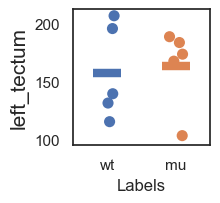

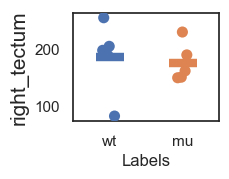

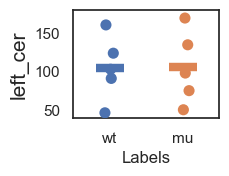

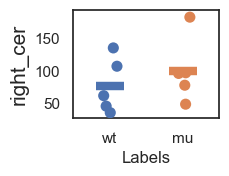

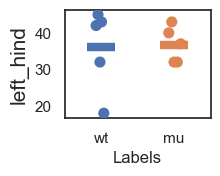

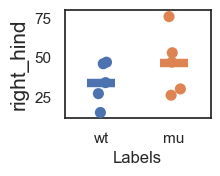

In [22]:
#N events
plt.figure(figsize=(6,6))
for o in range(len(name_list)):
    wtdata = np.array(wt6_nev )   [:,o]
    mudata = np.array(mu6_nev )   [:,o]
    nom_list = []

    for i in range(len(wtdata)):
        nom_list =  np.append(nom_list, 'wt')
    for i in range(len(mudata)):
        nom_list =  np.append(nom_list, 'mu')

    #DUR - KS
    nev_df = pd.DataFrame({"nev": np.append(wtdata, mudata), "Labels":  nom_list})

    from matplotlib.collections import PathCollection
    sns.set(style="white")

    plt.subplot(3,3,i+1)
    ax = sns.pointplot(x="Labels", y="nev", data = nev_df, hue = 'Labels',  join=True, ci=0, scale=3, markers = '_')
    for artist in ax.lines:
        artist.set_zorder(10)
    for artist in ax.findobj(PathCollection):
        artist.set_zorder(11)
    ax = sns.stripplot(x="Labels", y="nev", data=nev_df, size = 8, jitter = True ,alpha = 1)
    #plt.gca().set_title('k = ' + str(k_vals[i]))
    #plt.gca().set_xlabel('r', size = '15')
    plt.gca().set_ylabel(name_list[o], size = '15')
    ax.legend_.remove()
    plt.show()


In [ ]:
#Correlation
wt6_mat = corr_raw(wt6_li, name_list)
wt7_mat = corr_raw(wt7_li, name_list)
mu6_mat = corr_raw(mu6_li, name_list)
mu7_mat = corr_raw(mu7_li, name_list)


wt6_meanmat = mean_mat(wt6_mat, name_list)
wt7_meanmat = mean_mat(wt7_mat, name_list)
mu6_meanmat = mean_mat(mu6_mat, name_list)
mu7_meanmat = mean_mat(mu7_mat, name_list)

diff6_mat = mu6_meanmat - wt6_meanmat
diff7_mat = mu7_meanmat - wt7_meanmat


In [ ]:
#Amplitude of spikes



# Light stim

In [24]:
#wt6_li = plot_light(wt6)
#wt7_li = plot_light(wt7)
#mu6_li = plot_light(mu6)
#mu7_li = plot_light(mu7)
wt6_amp = amp(wt6_list, name_list)
#wt7_amp = amp(wt7_list, name_list)
mu6_amp = amp(mu6_list, name_list)
#mu7_amp = amp(mu7_list, name_list)
wt6_reg = reg_append(wt6_amp)
#wt7_reg = reg_append(wt7_amp)
mu6_reg = reg_append(mu6_amp)
#mu7_reg = reg_append(mu7_amp)

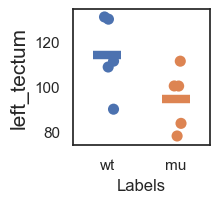

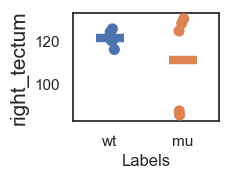

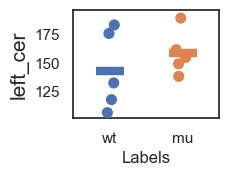

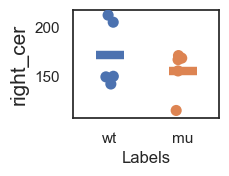

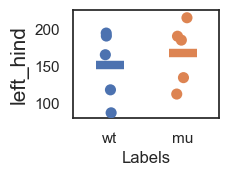

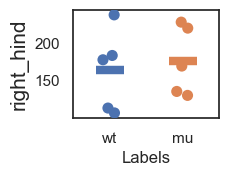

In [25]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
plt.figure(figsize=(6,6))
for o in range(len(name_list)):
    wtdata = wt6_reg[o]
    mudata = mu6_reg[o]
    nom_list = []

    for i in range(len(wtdata)):
        nom_list =  np.append(nom_list, 'wt')
    for i in range(len(mudata)):
        nom_list =  np.append(nom_list, 'mu')

    #DUR - KS
    auc_df = pd.DataFrame({"AUC": np.append(wtdata, mudata), "Labels":  nom_list})

    from matplotlib.collections import PathCollection
    sns.set(style="white")

    plt.subplot(3,3,i+1)
    ax = sns.pointplot(x="Labels", y="AUC", data = auc_df, hue = 'Labels', join=True, ci=0, scale=3, markers = '_')
    for artist in ax.lines:
        artist.set_zorder(10)
    for artist in ax.findobj(PathCollection):
        artist.set_zorder(11)
    ax = sns.stripplot(x="Labels", y="AUC", data=auc_df,  size = 8, jitter = True ,alpha = 1)
    #plt.gca().set_title('k = ' + str(k_vals[i]))
    #plt.gca().set_xlabel('r', size = '15')
    plt.gca().set_ylabel(name_list[o], size = '15')
    ax.legend_.remove()

    plt.show()


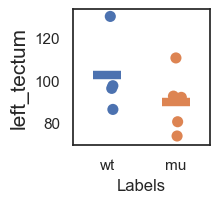

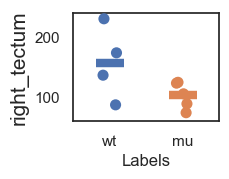

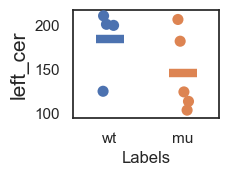

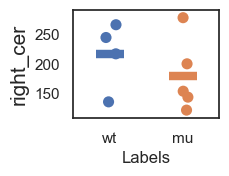

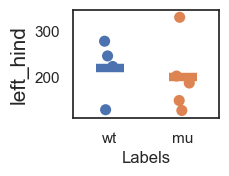

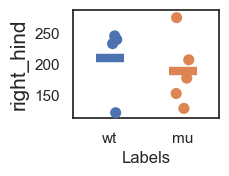

In [156]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
plt.figure(figsize=(6,6))
for o in range(len(name_list)):
    wtdata = wt7_reg[o]
    mudata = mu7_reg[o]
    nom_list = []

    for i in range(len(wtdata)):
        nom_list =  np.append(nom_list, 'wt')
    for i in range(len(mudata)):
        nom_list =  np.append(nom_list, 'mu')

    #DUR - KS
    auc_df = pd.DataFrame({"AUC": np.append(wtdata, mudata), "Labels":  nom_list})

    from matplotlib.collections import PathCollection
    sns.set(style="white")

    plt.subplot(3,3,i+1)
    ax = sns.pointplot(x="Labels", y="AUC", data = auc_df, hue = 'Labels', join=True, ci=0, scale=3, markers = '_')
    for artist in ax.lines:
        artist.set_zorder(10)
    for artist in ax.findobj(PathCollection):
        artist.set_zorder(11)
    ax = sns.stripplot(x="Labels", y="AUC", data=auc_df, size = 8, jitter = True ,alpha = 1)
    #plt.gca().set_title('k = ' + str(k_vals[i]))
    #plt.gca().set_xlabel('r', size = '15')
    plt.gca().set_ylabel(name_list[o], size = '15')
    ax.legend_.remove()

    plt.show()


In [13]:
#Correlation
wt6_mat = corr_raw(wt6_list, name_list)
#wt7_mat = corr_raw(wt7_list, name_list)
mu6_mat = corr_raw(mu6_list, name_list)
#mu7_mat = corr_raw(mu7_list, name_list)


wt6_meanmat = mean_mat(wt6_mat, name_list)
#wt7_meanmat = mean_mat(wt7_mat, name_list)
mu6_meanmat = mean_mat(mu6_mat, name_list)
#mu7_meanmat = mean_mat(mu7_mat, name_list)

diff6_mat = mu6_meanmat - wt6_meanmat
#diff7_mat = mu7_meanmat - wt7_meanmat

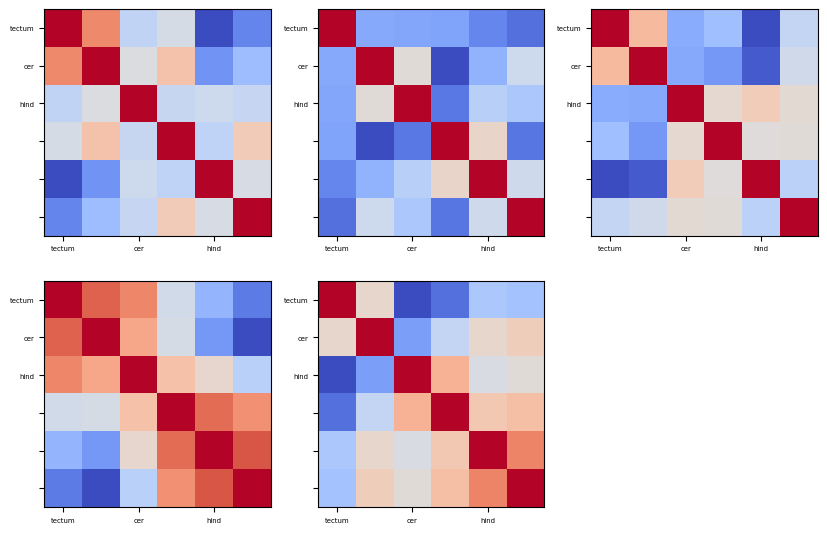

In [14]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
data_mat = wt6_mat

plt.figure(figsize=(10, 10))
for i in range(len(data_mat)):
    curr = data_mat[i]
    plt.subplot(3,3,i+1)
    plot1 = plt.imshow(curr, cmap = 'coolwarm')
    #plt.gca().set_xlabel('r', size = '15')
    #plt.gca().set_ylabel('v_th', size = '15')
    plt.gca().set_xticklabels(np.append(0, subname_list) , fontsize = 5)
    plt.gca().set_yticklabels(np.append(0,subname_list), fontsize = 5)
plt.show()

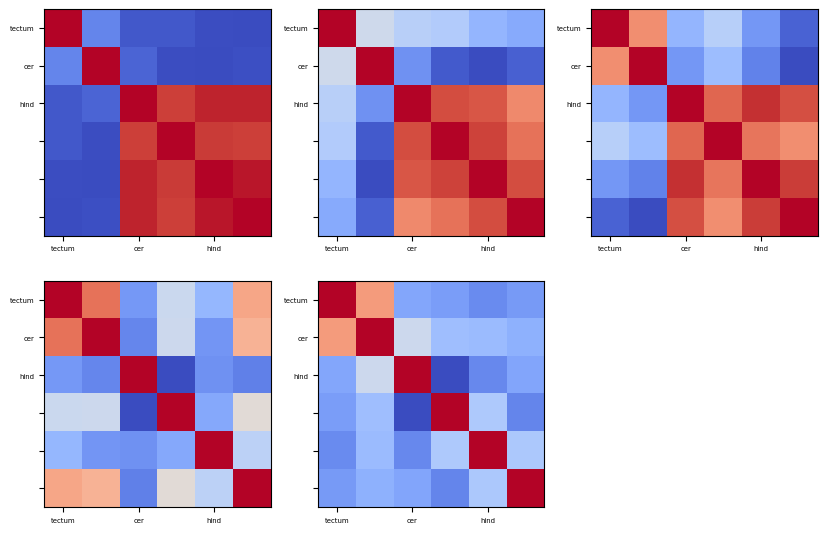

In [15]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
data_mat = mu6_mat

plt.figure(figsize=(10, 10))
for i in range(len(data_mat)):
    curr = data_mat[i]
    plt.subplot(3,3,i+1)
    plot1 = plt.imshow(curr, cmap = 'coolwarm')
    #plt.gca().set_xlabel('r', size = '15')
    #plt.gca().set_ylabel('v_th', size = '15')
    plt.gca().set_xticklabels(np.append(0, subname_list) , fontsize = 5)
    plt.gca().set_yticklabels(np.append(0,subname_list), fontsize = 5)
plt.show()

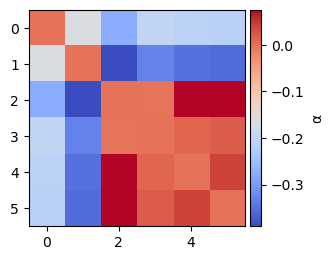

In [16]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors

f, ax = plt.subplots(figsize = (3,3))
plot1 = ax.imshow(diff6_mat, cmap = 'coolwarm')#, norm = divnorm)
divider = make_axes_locatable(ax)
cax0 = divider.append_axes("right", size="5%", pad=0.05)
cbar0 = f.colorbar(plot1, cax=cax0, label = 'α')
plt.show()

Z score = 2.283673073263121


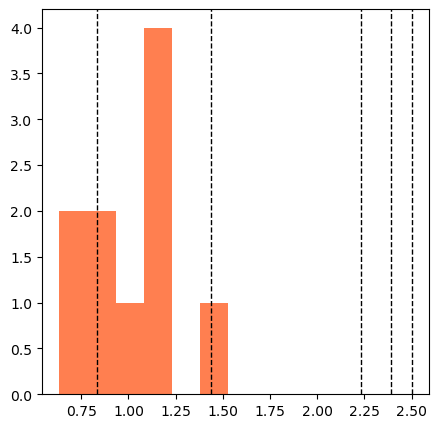

In [17]:
Z, euc_nulldist, comp_euc_mat = Zscore(wt6_mat, mu6_mat)
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
print('Z score = ' + str(Z))
f, ax = plt.subplots(figsize = (5,5))
plot1 = ax.hist(euc_nulldist, bins = 6, color = 'coral')#, norm = divnorm)
mean_list = np.mean(comp_euc_mat, axis=1)
for i in range(len(mean_list)):
    ax.axvline(mean_list[i], color='k', linestyle='dashed', linewidth=1)
plt.show()

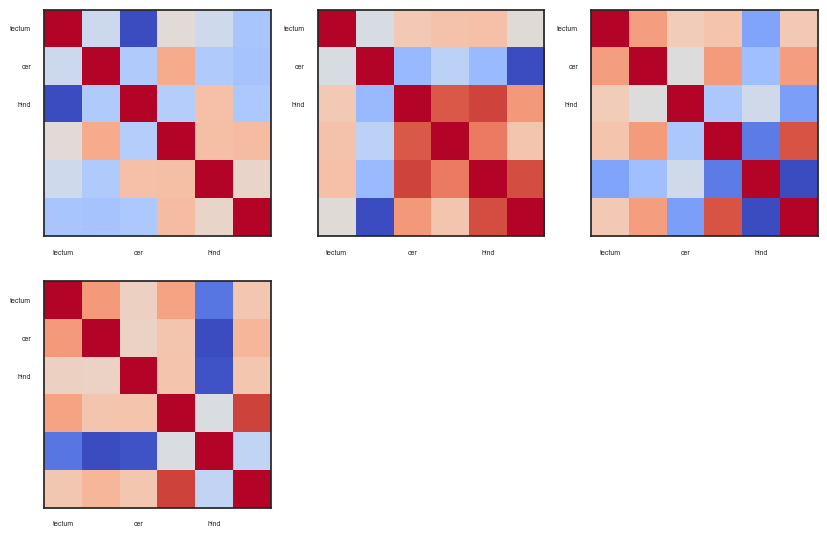

In [425]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
data_mat = wt7_mat

plt.figure(figsize=(10, 10))
for i in range(len(data_mat)):
    curr = data_mat[i]
    plt.subplot(3,3,i+1)
    plot1 = plt.imshow(curr, cmap = 'coolwarm')
    #plt.gca().set_xlabel('r', size = '15')
    #plt.gca().set_ylabel('v_th', size = '15')
    plt.gca().set_xticklabels(np.append(0, subname_list) , fontsize = 5)
    plt.gca().set_yticklabels(np.append(0,subname_list), fontsize = 5)
plt.show()

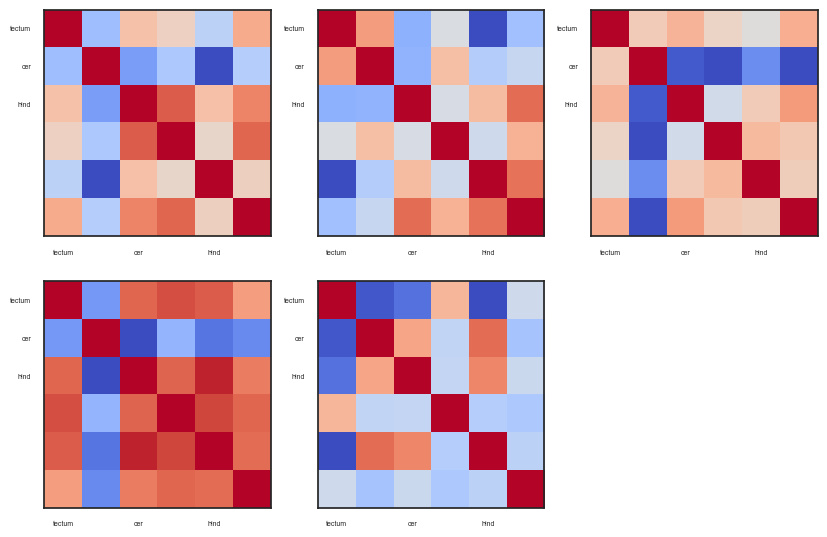

In [426]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
data_mat = mu7_mat

plt.figure(figsize=(10, 10))
for i in range(len(data_mat)):
    curr = data_mat[i]
    plt.subplot(3,3,i+1)
    plot1 = plt.imshow(curr, cmap = 'coolwarm')
    #plt.gca().set_xlabel('r', size = '15')
    #plt.gca().set_ylabel('v_th', size = '15')
    plt.gca().set_xticklabels(np.append(0, subname_list) , fontsize = 5)
    plt.gca().set_yticklabels(np.append(0,subname_list), fontsize = 5)
plt.show()

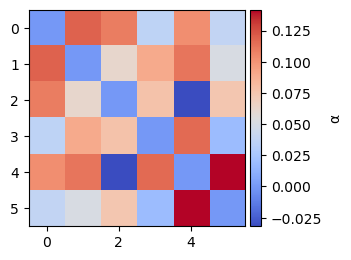

In [45]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors

f, ax = plt.subplots(figsize = (3,3))
plot1 = ax.imshow(diff7_mat, cmap = 'coolwarm')#, norm = divnorm)
divider = make_axes_locatable(ax)
cax0 = divider.append_axes("right", size="5%", pad=0.05)
cbar0 = f.colorbar(plot1, cax=cax0, label = 'α')
plt.show()

In [430]:
euc_nulldist

array([2.92702594, 3.00289753, 2.87090615, 0.58652013, 0.60724214,
       0.36800375])

Z score = 0.2956814482114346


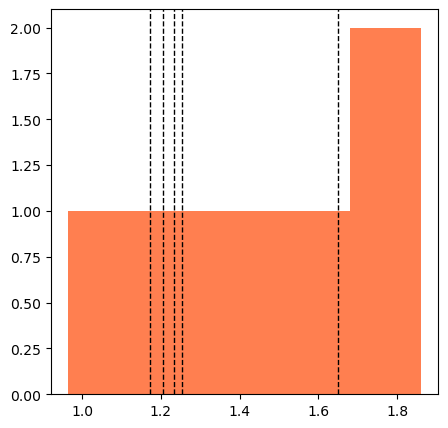

In [46]:
Z, euc_nulldist, comp_euc_mat = Zscore(wt7_mat, mu7_mat)
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
print('Z score = ' + str(Z))
f, ax = plt.subplots(figsize = (5,5))
plot1 = ax.hist(euc_nulldist, bins = 5, color = 'coral')#, norm = divnorm)
mean_list = np.mean(comp_euc_mat, axis=1)
for i in range(len(mean_list)):
    ax.axvline(mean_list[i], color='k', linestyle='dashed', linewidth=1)
plt.show()